In [1]:
from general_tools.notebook.gpu_utils import setup_one_gpu
GPU = 1
setup_one_gpu(GPU)

Picking GPU 1


In [2]:
import sys
import time
import numpy as np
import os.path as osp
import tensorflow as tf
import matplotlib.pyplot as plt

from general_tools.notebook.tf import reset_tf_graph

import tf_lab.point_clouds.in_out as pio
from tf_lab.point_clouds.in_out import PointCloudDataSet, write_model_ids_of_datasets

from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder
from tf_lab.point_clouds.autoencoder import Configuration as Conf
import tf_lab.point_clouds.encoders_decoders as enc_dec

from tf_lab.autopredictors.scripts.helper import shape_net_category_to_synth_id

from tf_lab.autopredictors.plotting import plot_original_pclouds_vs_reconstructed, \
                                           plot_train_val_test_curves, plot_reconstructions_at_epoch

from tf_lab.autopredictors.evaluate import eval_model, read_saved_epochs

from tf_lab.autopredictors.exploration import latent_embedding_of_entire_dataset
                                                  
from general_tools.in_out.basics import create_dir, delete_files_in_directory, files_in_subdirs
from general_tools.simpletons import select_first_last_and_k

from geo_tool import Point_Cloud

from tf_lab.nips.data_sets.shape_net import pc_loader as sn_pc_loader
from tf_lab.point_clouds.raw_gan import RawGAN
from tf_lab.point_clouds.raw_gan_gp import RawGAN_GP
from tf_lab.point_clouds.latent_gan import LatentGAN
from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder


from tf_lab.nips.evaluate_gan import entropy_of_occupancy_grid, jensen_shannon_divergence, \
                                     sample_pclouds_distances

from tf_lab.point_clouds.gan import model_saver_id

from tf_lab.autopredictors.exploration import find_neighbors

from tf_lab.nips.helper import pclouds_centered_and_half_sphere

from tf_lab.point_clouds.generators_discriminators import latent_code_discriminator_two_layers, latent_code_generator_two_layers    

from tf_lab.icml.ae_farm_helper import relevant_class

In [3]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
n_pc_samples = 2048
do_training = True
do_plotting = True
ae_loss = 'emd'

save_synthetic_samples = True
save_model = True
saver_step = 10

class_name = raw_input('Give me the class type: ').lower()
ae_id = raw_input('Give me the AE/experiment ID: ').lower()
cmp_type = raw_input('Comparison Type ("best" epoch vs. "max_min" epoch): ').lower()

syn_id = shape_net_category_to_synth_id()[class_name]

experiment_name = '_'.join(['nb_wgan_gp_ae', ae_id, ae_loss, class_name, str(n_pc_samples), cmp_type, 'epoch'])

top_data_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/'
synthetic_data_out_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/synthetic_point_clouds'

train_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/gan/nb_gan')
train_dir = osp.join(train_dir, experiment_name)
create_dir(train_dir);

Give me the class type: chair
Give me the AE/experiment ID: 13
Comparison Type ("best" epoch vs. "max_min" epoch): best


In [5]:
# Load Raw Point-Clouds of class
pclouds_path = osp.join(top_data_dir, 'Point_Clouds/Shape_Net/Core/from_manifold_meshes/centered/', str(n_pc_samples))
pclouds_path = osp.join(pclouds_path, syn_id)
file_names = pio.load_filenames_of_input_data(pclouds_path, '.ply')
pclouds, model_ids, syn_ids = pio.load_crude_point_clouds(file_names=file_names, n_threads=50, loader=sn_pc_loader)
print '%d files containing complete point clouds were found.' % (len(pclouds), )

6778 files containing complete point clouds were found.


In [6]:
ae_help = relevant_class(ae_loss)

In [7]:
# Load Auto-Encoder
ae_net_name = 'ae_farm_' + class_name + '_conv_arch_' + ae_id + '_2048pts_' + ae_loss
ae_net_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/ae_farming', ae_net_name)
ae_conf = Conf.load(osp.join(ae_net_dir, 'configuration'))
reset_tf_graph()
ae = PointNetAutoEncoder(ae_net_name, ae_conf)
bneck = ae.bottleneck_size
assert(ae_help.experiment_id_to_bneck[int(ae_id)] == bneck) 

if cmp_type.startswith('best'):
    load_epoch, _ = ae_help.best_epochs[bneck]
    print load_epoch
elif cmp_type.startswith('max'):
    load_epoch, _ = ae_help.max_min_epochs[bneck]
else:
    assert(False)
    saved_epochs = read_saved_epochs(ae_conf.train_dir)
    load_epoch = saved_epochs[-1]

ae.restore_model(ae_conf.train_dir, load_epoch, verbose=True)

980
Model restored in epoch 980.


In [8]:
# Convert raw-data to latent codes.
raw_data = PointCloudDataSet(pclouds, init_shuffle=False)
_, latent_codes, _ = latent_embedding_of_entire_dataset(raw_data, ae, ae_conf)
training_data = PointCloudDataSet(latent_codes)

In [17]:
# reconstructed = ae.decode(latent_codes)
# save_dir = osp.join(top_data_dir, 'OUT/icml/ae_reconstructed_point_clouds')
# create_dir(save_dir)
# save_file = osp.join(save_dir, 'ae_' + ae_id + '_2048pts_' + ae_loss + '_' + cmp_type)
# np.savez(save_file, reconstructed)

In [9]:
# TODO : make GAN conf.
init_lr = 0.0001
batch_size = 50

noise_params = {'mu':0, 'sigma': 0.5}
noise_dim = ae.bottleneck_size
max_epochs = 1500

n_syn_samples = training_data.num_examples  # Same number as original GT data.
n_out = [ae.bottleneck_size]

lam = 10
beta = 0.5
disc_kwargs = {'b_norm': False}
reset_tf_graph()
gan = RawGAN_GP(experiment_name, init_lr, lam, n_out, noise_dim,\
                latent_code_discriminator_two_layers, latent_code_generator_two_layers,\
                beta=beta, disc_kwargs=disc_kwargs)


1 (-1.0338507577225013, 1.3211633522684376)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1 is not in all_model_checkpoint_paths. Manually adding it.


/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


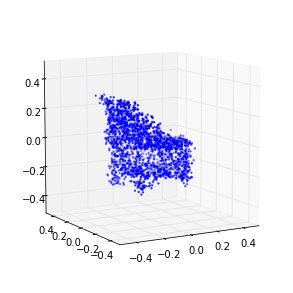

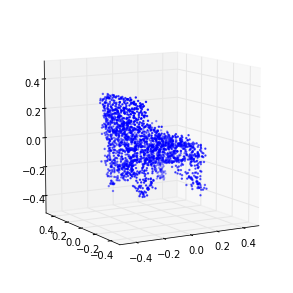

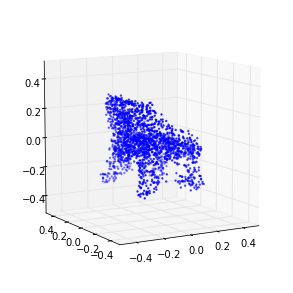

2 (-1.4300160999651308, 1.6401404009924994)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-2 is not in all_model_checkpoint_paths. Manually adding it.


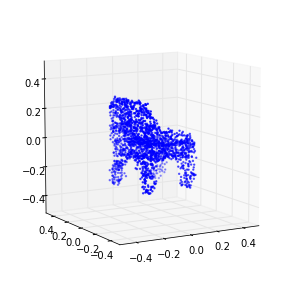

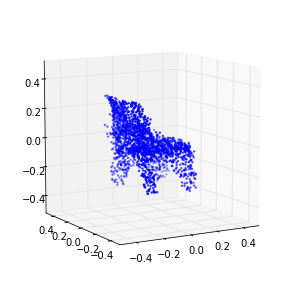

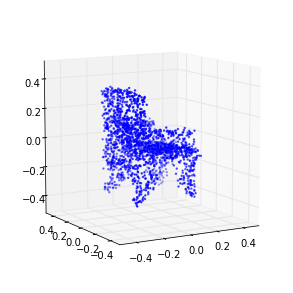

3 (-1.1303025713673345, 1.1878433845661305)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-3 is not in all_model_checkpoint_paths. Manually adding it.


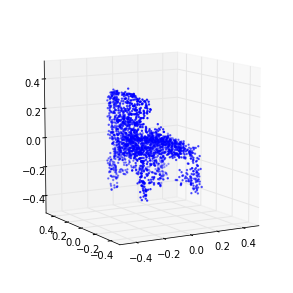

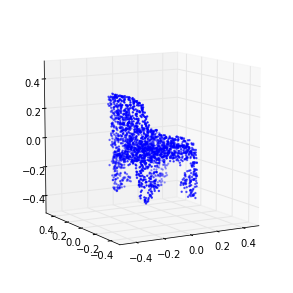

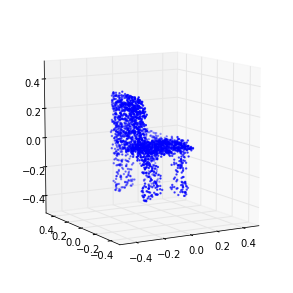

4 (-0.96218188118051595, 0.87372866383305303)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-4 is not in all_model_checkpoint_paths. Manually adding it.


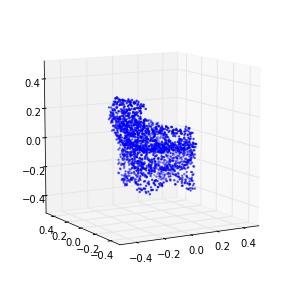

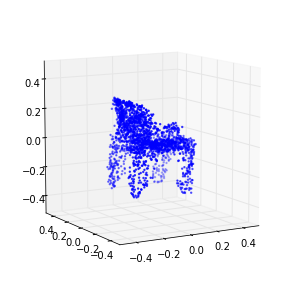

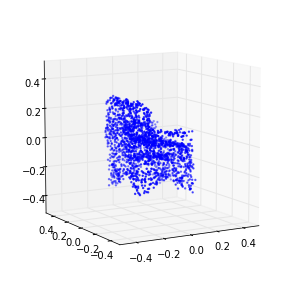

5 (-0.87012609199241353, 0.66861924639454595)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-5 is not in all_model_checkpoint_paths. Manually adding it.


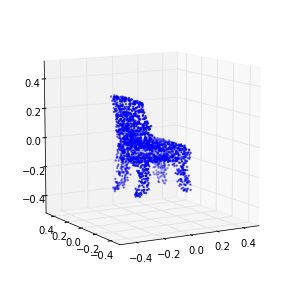

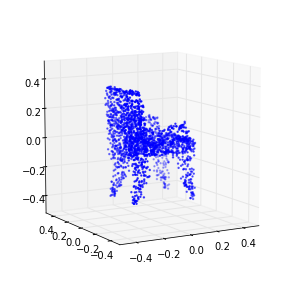

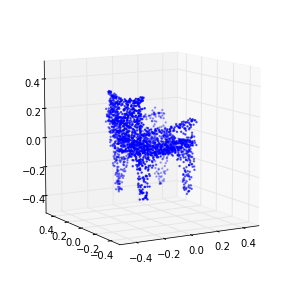

6 (-0.82588261586648448, 0.53142199251386857)
7 (-0.81513687063146523, 0.43967759829980357)
8 (-0.81805928459873911, 0.35308347476853263)
9 (-0.82470502058664963, 0.30208194145449885)
10 (-0.82906215544100159, 0.23590645635569538)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-10 is not in all_model_checkpoint_paths. Manually adding it.


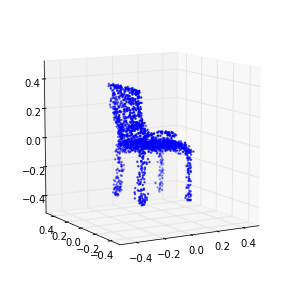

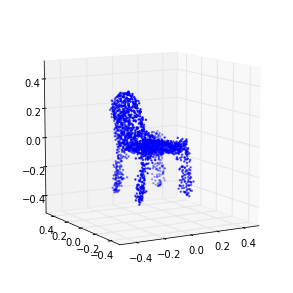

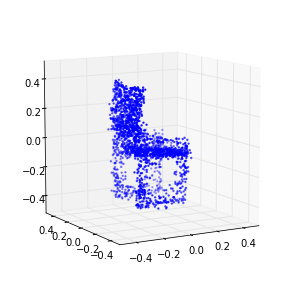

11 (-0.83699070347679982, 0.19638124163504)
12 (-0.83751069219024088, 0.15568828444789956)
13 (-0.83338955684944438, 0.13759733653730816)
14 (-0.82853339645597668, 0.1244978959913607)
15 (-0.82236178053749931, 0.11084412673005352)
16 (-0.81446910655056992, 0.092711114911017592)
17 (-0.80584980116950145, 0.089210164905698205)
18 (-0.7986376908090379, 0.067094756428290298)
19 (-0.79087810207296305, 0.055743925894300141)
20 (-0.78229885586985837, 0.051755783872471914)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-20 is not in all_model_checkpoint_paths. Manually adding it.


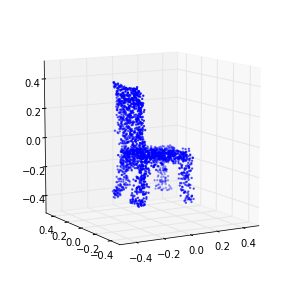

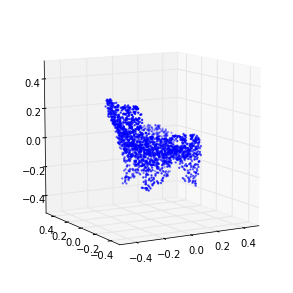

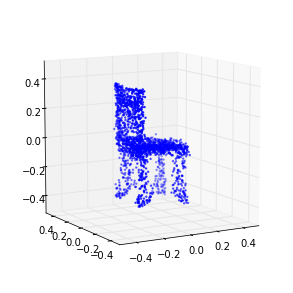

21 (-0.76876190194377192, 0.050203004093081864)
22 (-0.75816040613033153, 0.03275315287626452)
23 (-0.75166901217566595, 0.027736272973318894)
24 (-0.73875324328740433, 0.0061901337553367571)
25 (-0.72857457531823056, 0.024000720802211651)
26 (-0.7238426636766504, 0.0072635224054533026)
27 (-0.71340324878692629, -0.011708087055012584)
28 (-0.70319896229991208, -0.014348105743044504)
29 (-0.69428541130489774, -0.017689028220182215)
30 (-0.68435431630523114, -0.024522061425226706)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-30 is not in all_model_checkpoint_paths. Manually adding it.


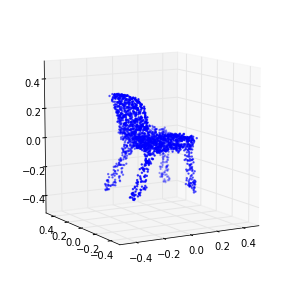

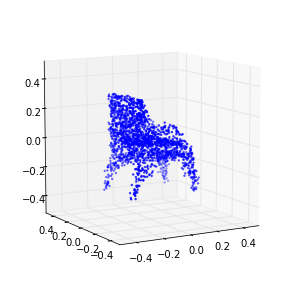

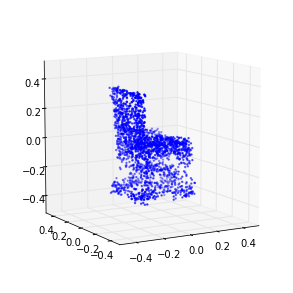

31 (-0.67305375514207066, -0.021681751909286336)
32 (-0.66013347175386217, -0.029162770081138996)
33 (-0.65267347229851613, -0.035643377841484768)
34 (-0.6391559353581181, -0.040109903430911129)
35 (-0.62709428690097946, -0.035409233567339403)
36 (-0.61793804124549578, -0.043982832571836536)
37 (-0.60935581348560475, -0.050232775681824597)
38 (-0.59854733237513791, -0.061210867741869554)
39 (-0.59042562820293287, -0.070561609955297575)
40 (-0.58057921550892022, -0.064938180286575248)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-40 is not in all_model_checkpoint_paths. Manually adding it.


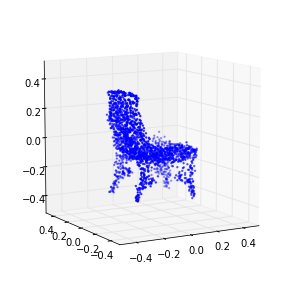

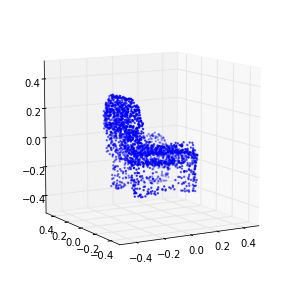

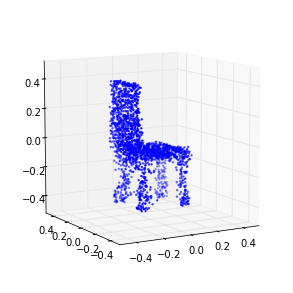

41 (-0.57113844156265259, -0.077484283320329805)
42 (-0.56373984990296544, -0.086197889927360744)
43 (-0.55557763090840095, -0.092393628701015751)
44 (-0.54577483954253025, -0.10457007586956024)
45 (-0.53836393952369688, -0.1068192205771252)
46 (-0.53372528376402684, -0.11400560924300442)
47 (-0.5224848714139726, -0.12866941259966957)
48 (-0.51544753997414205, -0.14143506354755825)
49 (-0.50891874300109019, -0.13862851096524131)
50 (-0.50233890083101063, -0.1548084776710581)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-50 is not in all_model_checkpoint_paths. Manually adding it.


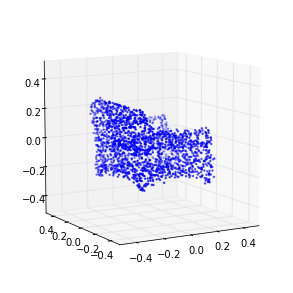

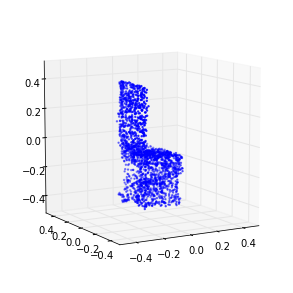

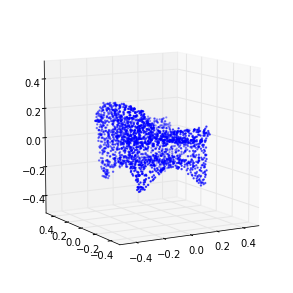

51 (-0.49556076901930352, -0.16577353411250645)
52 (-0.48744553747000519, -0.16401981865918194)
53 (-0.48186925384733414, -0.19498739088023151)
54 (-0.47399908039304944, -0.19864555917404317)
55 (-0.4682512614462111, -0.20071409863454323)
56 (-0.46168336228088097, -0.20400068936524568)
57 (-0.45459283215028268, -0.21552383182225404)
58 (-0.44600340216248124, -0.22363362820060165)
59 (-0.44239507847362092, -0.23014525572458902)
60 (-0.43596878250439963, -0.21902688565077605)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-60 is not in all_model_checkpoint_paths. Manually adding it.


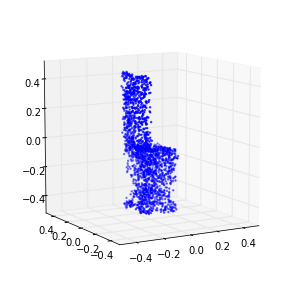

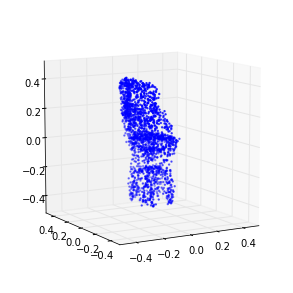

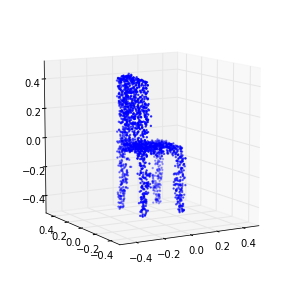

61 (-0.42940331145569133, -0.2539805505010817)
62 (-0.42552365307454709, -0.24609870601583411)
63 (-0.42002516786257427, -0.26666942018049733)
64 (-0.41448071444476092, -0.26127402429227475)
65 (-0.40661581445623329, -0.28874832833254777)
66 (-0.40127387002662374, -0.27917156451278263)
67 (-0.39640243980619644, -0.29557684946943213)
68 (-0.3895032661932486, -0.3019072347217136)
69 (-0.38515467047691343, -0.29727088742785984)
70 (-0.37841398605593929, -0.32134858877570543)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-70 is not in all_model_checkpoint_paths. Manually adding it.


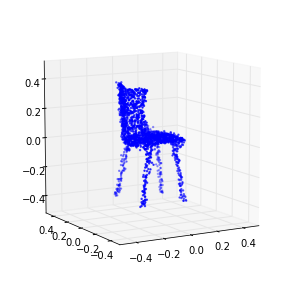

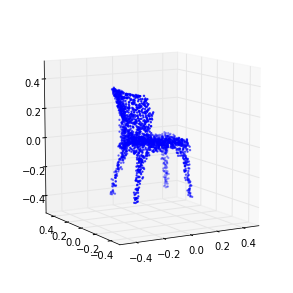

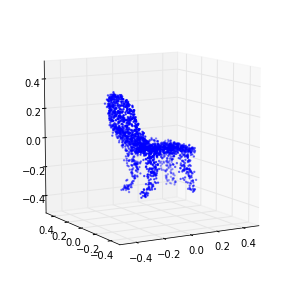

71 (-0.37516361165929724, -0.32503607206874424)
72 (-0.36482998044402509, -0.32029734386338127)
73 (-0.36042956754013344, -0.32888333554621096)
74 (-0.35625484276700903, -0.34320970707469517)
75 (-0.35339294914846064, -0.3447436348155693)
76 (-0.34475521268667997, -0.36389238746077929)
77 (-0.34124428254586681, -0.35488090250227189)
78 (-0.33438712159792583, -0.38027331895298427)
79 (-0.32948692242304484, -0.38283661780533967)
80 (-0.32464283108711245, -0.38834648772522257)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-80 is not in all_model_checkpoint_paths. Manually adding it.


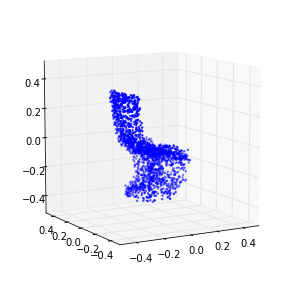

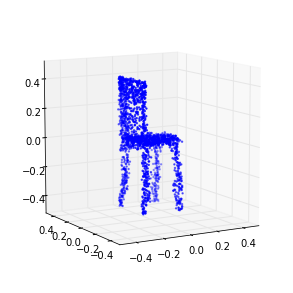

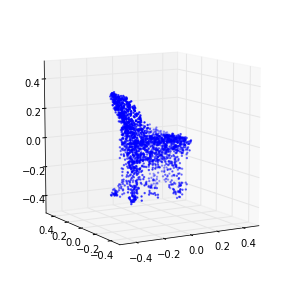

81 (-0.32148074154500605, -0.38267025130766408)
82 (-0.31558767468840987, -0.40575220077126112)
83 (-0.31333957976765103, -0.39758476835710033)
84 (-0.30744481837307963, -0.39699183901151019)
85 (-0.30558411280314129, -0.41341683930820888)
86 (-0.30059501440436753, -0.40995539780016299)
87 (-0.29778587553236219, -0.41463795635435319)
88 (-0.29381049683800448, -0.42107541803960447)
89 (-0.29024346835083431, -0.42353263828489518)
90 (-0.28713189341403822, -0.4367205688246974)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-90 is not in all_model_checkpoint_paths. Manually adding it.


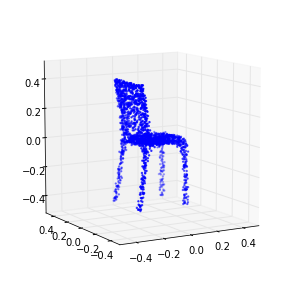

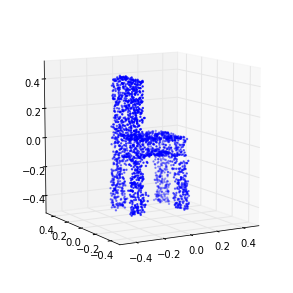

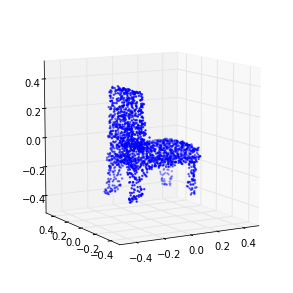

91 (-0.28192927561424397, -0.45126741572662638)
92 (-0.2786872959799237, -0.45468164704464098)
93 (-0.27561142654330645, -0.4493930085941597)
94 (-0.27273459721494603, -0.44795089408203409)
95 (-0.26866671994880392, -0.4624745790605192)
96 (-0.26559579173723857, -0.45290680947127165)
97 (-0.26158377947630707, -0.45448345608181423)
98 (-0.25828854000126872, -0.47159720902089719)
99 (-0.25656238452151969, -0.4769787104041488)
100 (-0.25185875086872667, -0.46893305027926407)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-100 is not in all_model_checkpoint_paths. Manually adding it.


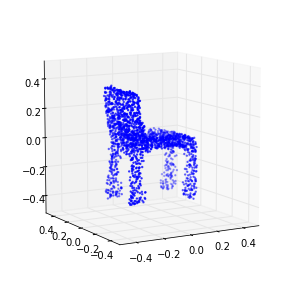

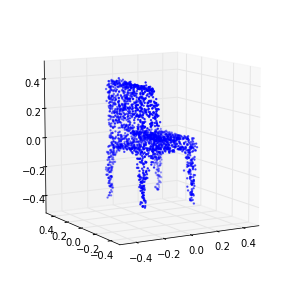

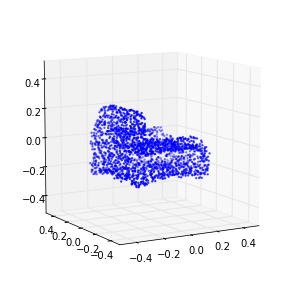

101 (-0.25012981372850912, -0.47022866650863931)
102 (-0.24621532426940071, -0.47250027899388913)
103 (-0.24454000702610723, -0.46928411501425282)
104 (-0.24271602431933084, -0.48318930135832894)
105 (-0.23657612469461228, -0.47752493399160878)
106 (-0.23447452099234969, -0.48381054732534623)
107 (-0.23425570295916665, -0.49276637479111002)
108 (-0.23110268502323716, -0.48120118070531775)
109 (-0.22755212894192448, -0.47924641326621725)
110 (-0.22566608609976591, -0.48930888595404448)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-110 is not in all_model_checkpoint_paths. Manually adding it.


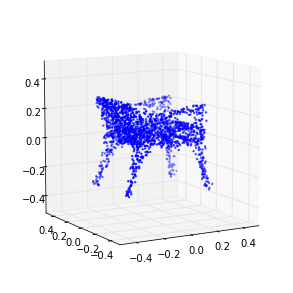

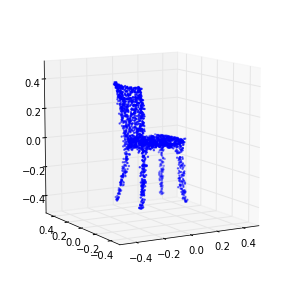

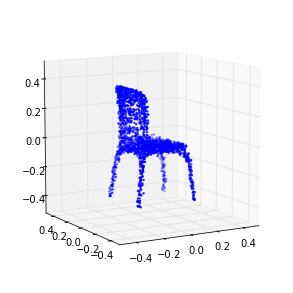

111 (-0.22343216141064962, -0.50735882807660981)
112 (-0.22154430747032167, -0.48633078844458971)
113 (-0.22052498172830654, -0.48944575477529456)
114 (-0.21617369011596396, -0.48720594909456039)
115 (-0.21718466888975213, -0.50025066622981318)
116 (-0.21548538506031037, -0.47759305878921793)
117 (-0.21146032136899454, -0.49991994102795917)
118 (-0.20925985199433786, -0.49541962919411836)
119 (-0.20648687801979207, -0.48662210173077053)
120 (-0.20374581471637443, -0.48728853353747614)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-120 is not in all_model_checkpoint_paths. Manually adding it.


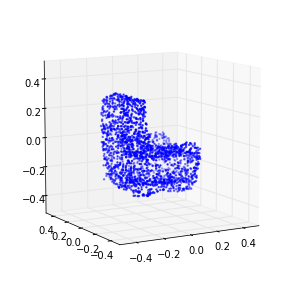

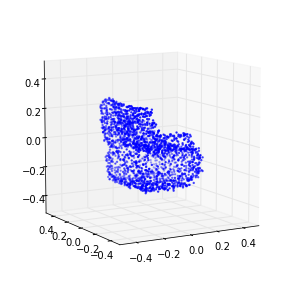

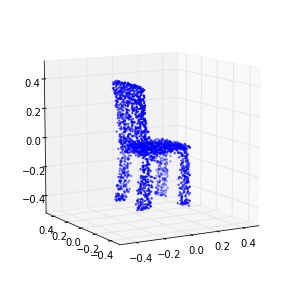

121 (-0.2074591702885098, -0.47495777077145046)
122 (-0.20404084048889301, -0.48179148965411717)
123 (-0.20278590133896582, -0.49493003884951275)
124 (-0.20523586560178686, -0.47289101282755536)
125 (-0.20443099770281051, -0.48214576752097521)
126 (-0.20013347378483526, -0.46654923315401431)
127 (-0.19881832345768258, -0.47645652956432766)
128 (-0.19905254940191905, -0.47129541966650224)
129 (-0.19972429430043256, -0.47657894757058883)
130 (-0.19817884481615491, -0.45750143240999291)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-130 is not in all_model_checkpoint_paths. Manually adding it.


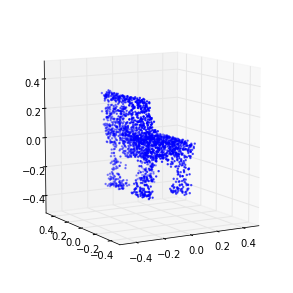

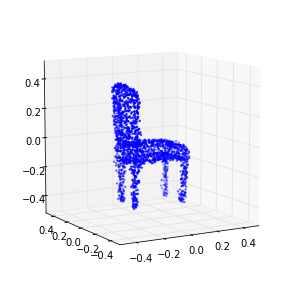

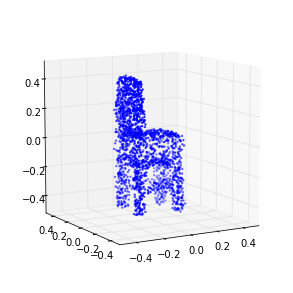

131 (-0.19723727802435556, -0.46047580352535955)
132 (-0.19903609973412972, -0.45891112530672989)
133 (-0.19487933571691865, -0.46058100793096757)
134 (-0.19584785876450717, -0.44656089941660565)
135 (-0.19659733882656805, -0.44303245345751446)
136 (-0.19718721602801922, -0.42879829031449779)
137 (-0.19285139463565967, -0.41818502103840866)
138 (-0.1941969178892948, -0.42943799164560104)
139 (-0.19277438979457925, -0.40406372591301248)
140 (-0.193134817260283, -0.42421887428672228)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-140 is not in all_model_checkpoint_paths. Manually adding it.


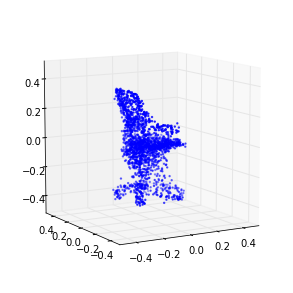

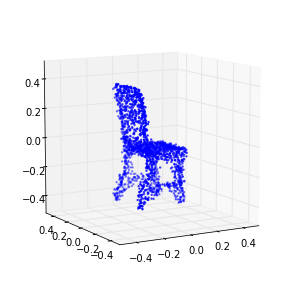

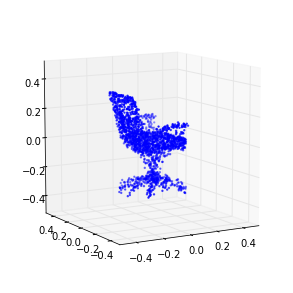

141 (-0.19173576202657489, -0.41424899079181532)
142 (-0.19152956869867113, -0.40469123147152086)
143 (-0.19228698931358479, -0.41886740039896081)
144 (-0.18864519971388358, -0.39727645560547159)
145 (-0.19099628516921291, -0.40808096417674311)
146 (-0.19104899101787143, -0.38575480933542605)
147 (-0.19148511969380907, -0.40628101869865701)
148 (-0.18930064539114635, -0.40610296417165687)
149 (-0.19172945199189362, -0.3804801845992053)
150 (-0.18676958972657168, -0.39319842501922891)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-150 is not in all_model_checkpoint_paths. Manually adding it.


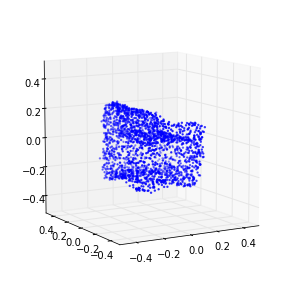

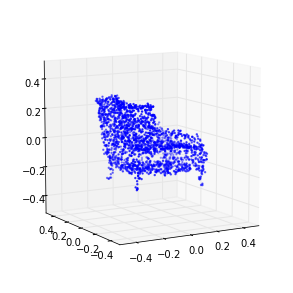

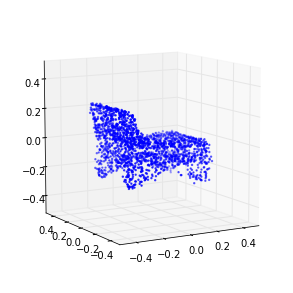

151 (-0.18971522406295493, -0.38528336198241625)
152 (-0.18710814372256951, -0.39235003899644921)
153 (-0.18635796705881755, -0.38476062483257717)
154 (-0.18660341308072761, -0.37030469598593535)
155 (-0.18876490890979766, -0.38994921578301323)
156 (-0.1852162234209202, -0.37805173684049537)
157 (-0.18724941776858436, -0.38035184255352728)
158 (-0.18714866433982497, -0.36488195260365802)
159 (-0.18394706768018229, -0.35557951309062819)
160 (-0.18628509717958944, -0.36087498731083339)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-160 is not in all_model_checkpoint_paths. Manually adding it.


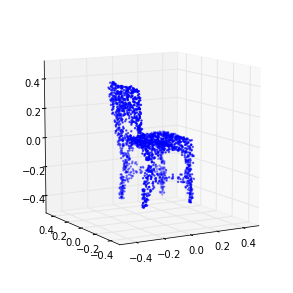

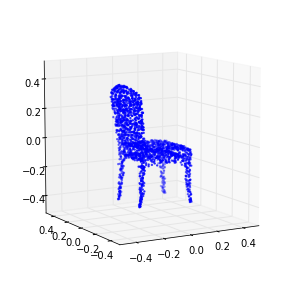

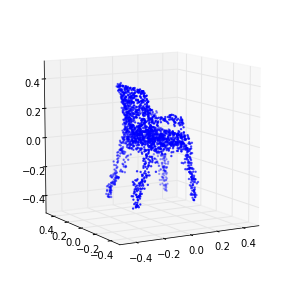

161 (-0.18538333205161273, -0.35902594747366728)
162 (-0.18274963763025071, -0.37217380934291416)
163 (-0.18562117340388121, -0.34991719546141448)
164 (-0.18322434430872953, -0.35024123832031534)
165 (-0.18151952872673671, -0.34476340810457867)
166 (-0.18579781502485276, -0.34671394251011034)
167 (-0.1856418827065715, -0.34369135234091019)
168 (-0.18189596809722758, -0.34008726698380931)
169 (-0.18535451138461079, -0.33831900247821101)
170 (-0.1844666862377414, -0.32951761837358828)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-170 is not in all_model_checkpoint_paths. Manually adding it.


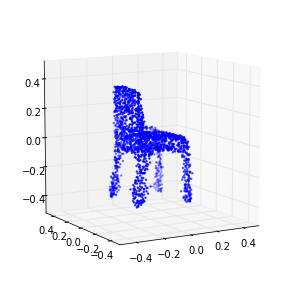

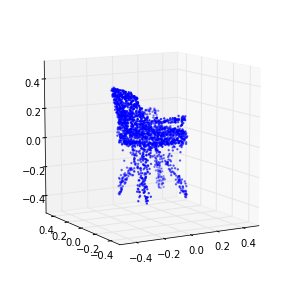

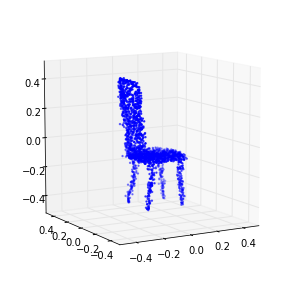

171 (-0.18619112206829919, -0.34344198306401569)
172 (-0.18362779391032677, -0.33649840730207936)
173 (-0.17983363916476566, -0.32143057937975283)
174 (-0.1839385050866339, -0.33018315942199145)
175 (-0.18558755163793211, -0.31682150783362212)
176 (-0.18250441015870483, -0.31479705042309231)
177 (-0.18221047719319661, -0.30820057292779285)
178 (-0.18229105362185724, -0.3105541666348775)
179 (-0.18338410059611002, -0.29243826810960416)
180 (-0.1841718895567788, -0.30622757916097287)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-180 is not in all_model_checkpoint_paths. Manually adding it.


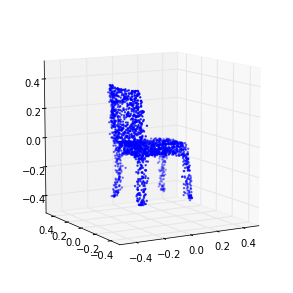

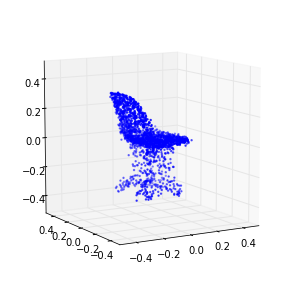

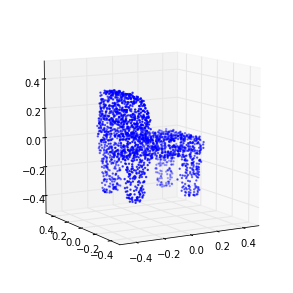

181 (-0.18216299834074798, -0.29475199293207238)
182 (-0.18296016703049342, -0.29692384159123458)
183 (-0.18310223420461019, -0.29914739617594965)
184 (-0.18239365120728809, -0.28423465677985438)
185 (-0.18371610906389024, -0.29025655543362655)
186 (-0.18256534409743769, -0.28944768121948949)
187 (-0.18267173474585569, -0.27061792435469451)
188 (-0.18391676881798991, -0.2677878130365301)
189 (-0.18135302121992464, -0.27110427838784679)
190 (-0.18329510158962672, -0.28102850086159176)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-190 is not in all_model_checkpoint_paths. Manually adding it.


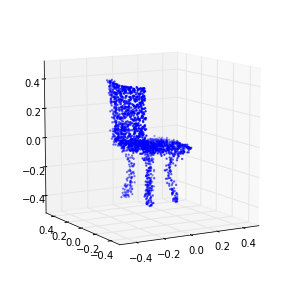

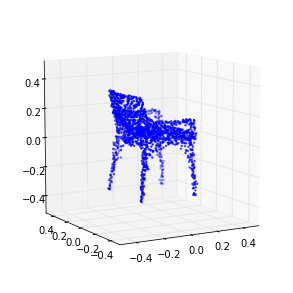

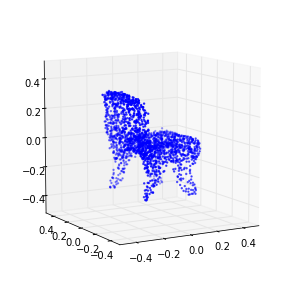

191 (-0.18263284955863598, -0.2701658722427156)
192 (-0.18495473558152165, -0.26596292908544894)
193 (-0.18328293887553393, -0.25779293036019363)
194 (-0.18471984377613773, -0.26824461420377094)
195 (-0.18678605887624952, -0.26120247222759108)
196 (-0.18636479664731909, -0.25557111148481015)
197 (-0.18451607089351724, -0.24756408510384736)
198 (-0.18218024919430414, -0.24215032601798023)
199 (-0.183640753781354, -0.24180150197611916)
200 (-0.18753850360711416, -0.24605621287116297)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-200 is not in all_model_checkpoint_paths. Manually adding it.


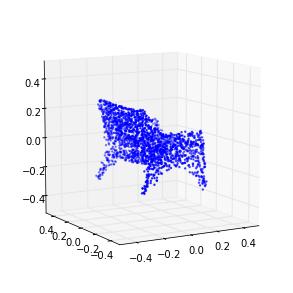

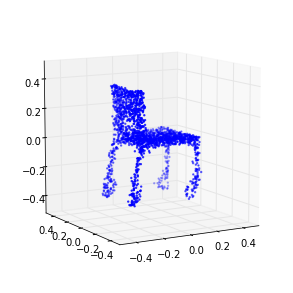

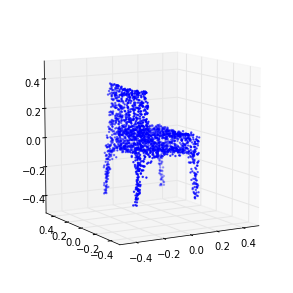

201 (-0.18369743250034473, -0.23841350608401829)
202 (-0.18285957354086416, -0.23187933586261891)
203 (-0.18596111596734435, -0.22639331331959478)
204 (-0.18614374879333709, -0.22985986040698159)
205 (-0.18559109358875839, -0.22806055402314221)
206 (-0.18434306603890879, -0.2185386010894069)
207 (-0.1818226268446004, -0.23104138065267493)
208 (-0.18528507638860631, -0.21957489185863072)
209 (-0.1850662914691148, -0.21667578485276964)
210 (-0.18491958423897073, -0.21062993561780011)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-210 is not in all_model_checkpoint_paths. Manually adding it.


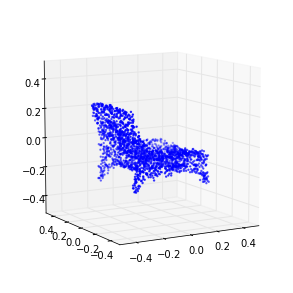

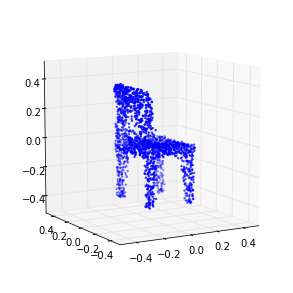

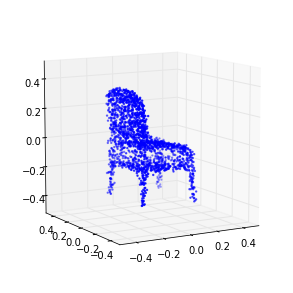

211 (-0.18205747295308997, -0.21670937427768)
212 (-0.18354161801161589, -0.20785407335669906)
213 (-0.18625172840224372, -0.22612433852972808)
214 (-0.18503439249815765, -0.21751023277088447)
215 (-0.18312928488960972, -0.20460557054590295)
216 (-0.18545742807564913, -0.21906256399772786)
217 (-0.18311081771497373, -0.20790009366141426)
218 (-0.18328181913605443, -0.21375893166771642)
219 (-0.18341282451594318, -0.20290357867876688)
220 (-0.18414820482333502, -0.20185185251412568)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-220 is not in all_model_checkpoint_paths. Manually adding it.


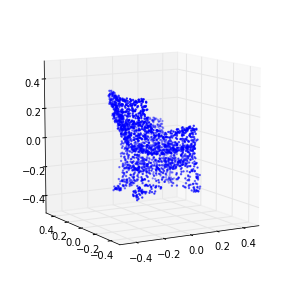

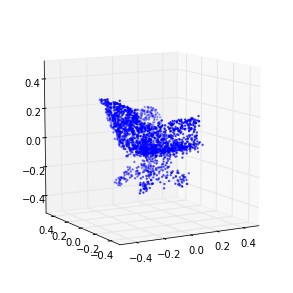

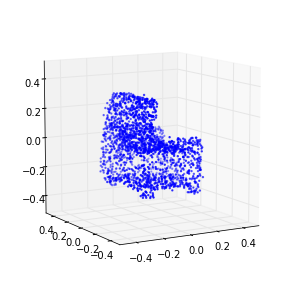

221 (-0.18703111354951504, -0.19250501747484561)
222 (-0.18337227713178705, -0.19310636211324622)
223 (-0.18606856542604941, -0.20187370258348961)
224 (-0.18507236385786974, -0.18084441953235203)
225 (-0.18362878527906207, -0.19758485533573009)
226 (-0.18603940727534118, -0.19498739529539039)
227 (-0.18567574090427821, -0.17912859773194348)
228 (-0.18565414558958124, -0.18743205180874578)
229 (-0.18456878187479797, -0.19532867272694907)
230 (-0.18356675869888731, -0.18090968165132734)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-230 is not in all_model_checkpoint_paths. Manually adding it.


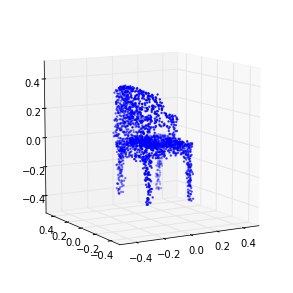

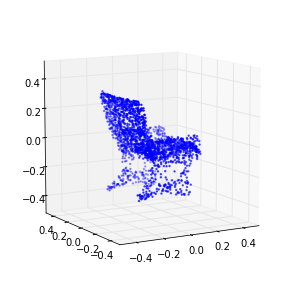

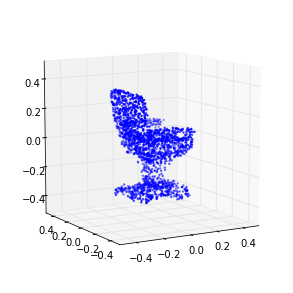

231 (-0.18441044864831146, -0.18081096421789239)
232 (-0.18481983812870803, -0.19545257201901189)
233 (-0.18630243694340742, -0.18244568562066113)
234 (-0.18417126116929231, -0.16726183063454098)
235 (-0.1859218031167984, -0.17558348178863525)
236 (-0.18332140600239788, -0.17891155459262706)
237 (-0.18409192777342268, -0.16464993109305701)
238 (-0.18551537538016283, -0.1618375206987063)
239 (-0.18288460986481772, -0.16969490823922334)
240 (-0.18604621467766938, -0.16822459079601146)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-240 is not in all_model_checkpoint_paths. Manually adding it.


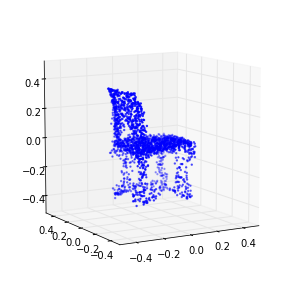

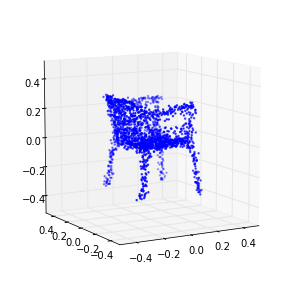

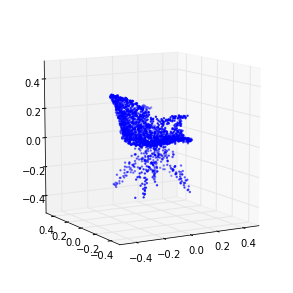

241 (-0.18574749959839715, -0.1660405013848234)
242 (-0.18792348824165486, -0.16838225335986526)
243 (-0.18424377044041951, -0.16840593351258171)
244 (-0.18601164961302721, -0.17089028822051155)
245 (-0.18621042061735082, -0.16581611583630243)
246 (-0.18615600505360849, -0.16183581230817018)
247 (-0.18526709962774207, -0.16651187147255297)
248 (-0.18388524182416774, -0.15205946978595522)
249 (-0.18313570717970531, -0.17017947358113747)
250 (-0.18651442792680528, -0.14810569749938118)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-250 is not in all_model_checkpoint_paths. Manually adding it.


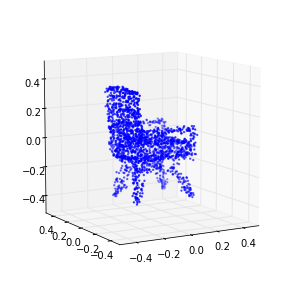

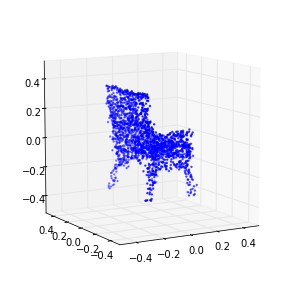

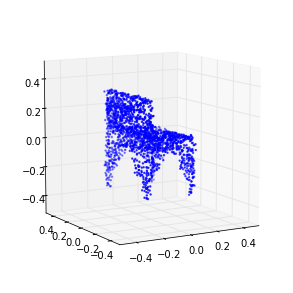

251 (-0.18540435113288739, -0.15622166075088359)
252 (-0.18474052940253857, -0.14872790321155829)
253 (-0.18447391043106715, -0.15003457444685478)
254 (-0.1843911568875666, -0.13696011983686024)
255 (-0.18716531522847987, -0.15314426438675988)
256 (-0.18545044196976557, -0.14269934015141594)
257 (-0.18613624925966615, -0.13744523486605398)
258 (-0.18553295775696083, -0.13595921822168208)
259 (-0.18479808105362786, -0.13367184610278518)
260 (-0.18732776917793131, -0.13584505711440686)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-260 is not in all_model_checkpoint_paths. Manually adding it.


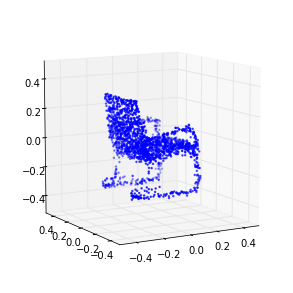

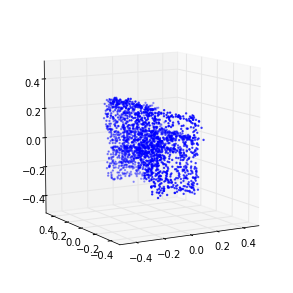

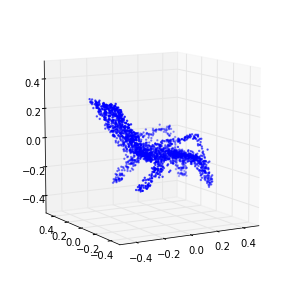

261 (-0.18490143318970997, -0.13929555813471475)
262 (-0.18673266956099757, -0.14183035189354862)
263 (-0.18712635906758132, -0.14578199414191423)
264 (-0.18635854158136581, -0.13788518530351143)
265 (-0.18489246213877641, -0.13723293802252523)
266 (-0.18741238321419115, -0.12961615815206809)
267 (-0.18811027032357674, -0.12913534238382621)
268 (-0.18443855416995508, -0.12883834844386136)
269 (-0.18491729133658938, -0.12563382806601348)
270 (-0.18667115127598799, -0.10698745896418889)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-270 is not in all_model_checkpoint_paths. Manually adding it.


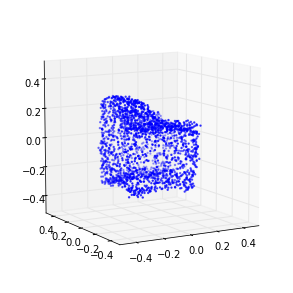

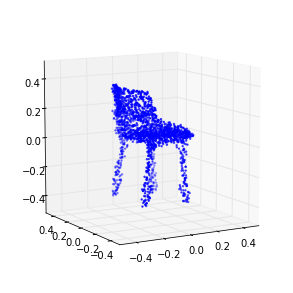

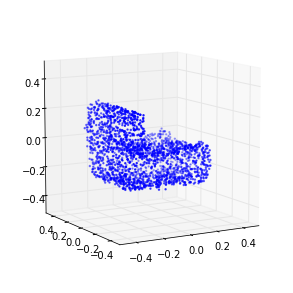

271 (-0.18535508160237912, -0.12632243004110125)
272 (-0.18415084674402518, -0.13136416149360161)
273 (-0.18522869011870138, -0.11869372703410962)
274 (-0.1857531088369864, -0.11336925101500971)
275 (-0.18655494826811331, -0.12868798303383369)
276 (-0.18442993655248924, -0.11225433537253628)
277 (-0.18692335199426721, -0.11766200733405573)
278 (-0.18603974735295331, -0.10734741720888349)
279 (-0.18282154787469793, -0.11454463336202833)
280 (-0.18540404074721867, -0.11109576208723916)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-280 is not in all_model_checkpoint_paths. Manually adding it.


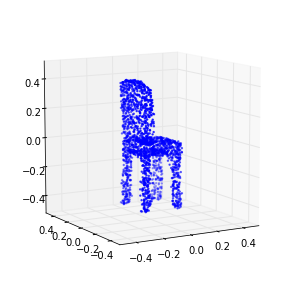

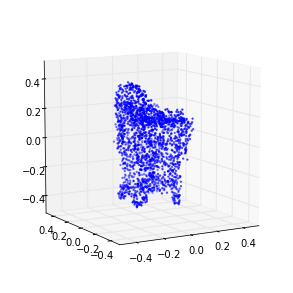

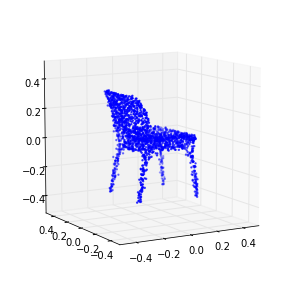

281 (-0.18409810231791601, -0.10346241819637793)
282 (-0.1852581379590211, -0.11733748681015438)
283 (-0.18412415385246278, -0.11272060264039922)
284 (-0.18443889783488379, -0.09506352052644447)
285 (-0.183429121474425, -0.11208160787268921)
286 (-0.18717848802054371, -0.10905079184858887)
287 (-0.18432169440719817, -0.099927372678562443)
288 (-0.18457897592473912, -0.10404966716413144)
289 (-0.18322611302137376, -0.10446269023749563)
290 (-0.18487386537922754, -0.088744393515366102)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-290 is not in all_model_checkpoint_paths. Manually adding it.


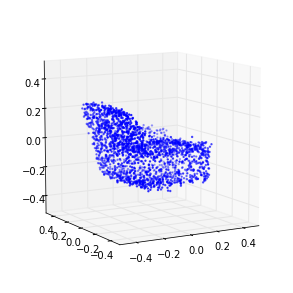

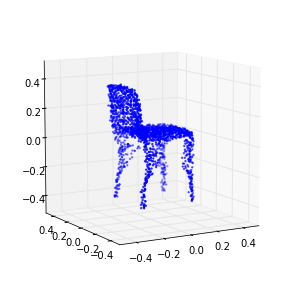

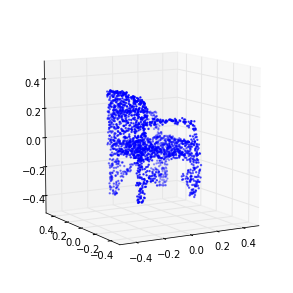

291 (-0.18550761088177009, -0.09452084189763775)
292 (-0.1826712996871383, -0.096190966251823634)
293 (-0.18299341566032834, -0.086473637708911186)
294 (-0.18330231209595998, -0.093787385357750788)
295 (-0.18544977539115481, -0.087099352644549474)
296 (-0.18403054851072806, -0.085108152004303758)
297 (-0.18475544971448404, -0.094459787287093977)
298 (-0.18344218957203406, -0.085069235690214018)
299 (-0.18188244109904325, -0.078854081600352566)
300 (-0.18371808733101244, -0.075525799697196042)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-300 is not in all_model_checkpoint_paths. Manually adding it.


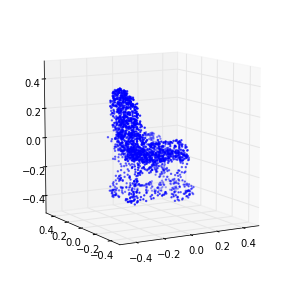

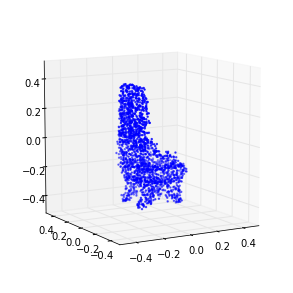

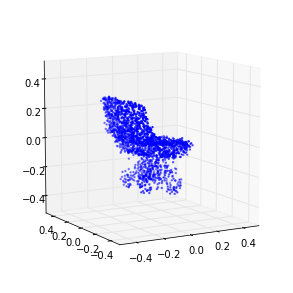

301 (-0.18259291102488837, -0.074965576882715573)
302 (-0.1823471814945892, -0.075697780000390832)
303 (-0.18333075234183557, -0.066445530495709837)
304 (-0.18235114492751933, -0.079868730571534902)
305 (-0.18227496246496835, -0.066727873075891425)
306 (-0.18155015006109521, -0.066298127277857721)
307 (-0.18486475403662081, -0.072773250302782769)
308 (-0.18468738027192927, -0.075866109105171983)
309 (-0.18409344189696841, -0.068629574237598315)
310 (-0.18570866501993602, -0.069006411013779814)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-310 is not in all_model_checkpoint_paths. Manually adding it.


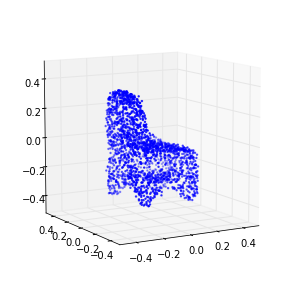

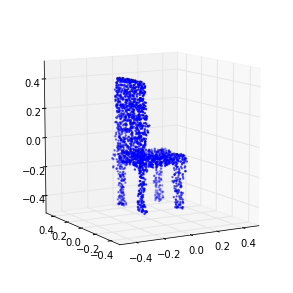

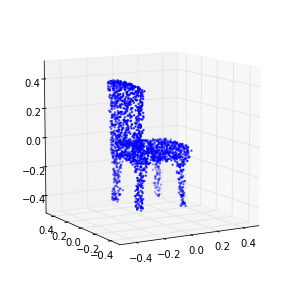

311 (-0.18514752807440582, -0.07335735333186609)
312 (-0.18445857316255571, -0.062302556854707224)
313 (-0.18230157891909282, -0.060569706924811555)
314 (-0.18365934998900801, -0.070039799988821705)
315 (-0.18409726178204572, -0.06961024752645581)
316 (-0.18523956294412966, -0.070523266853005792)
317 (-0.18493384961728696, -0.061457024059361882)
318 (-0.18634935904432226, -0.05985970229462341)
319 (-0.18491922765970231, -0.055997808946779477)
320 (-0.18730090354327802, -0.055736877179394163)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-320 is not in all_model_checkpoint_paths. Manually adding it.


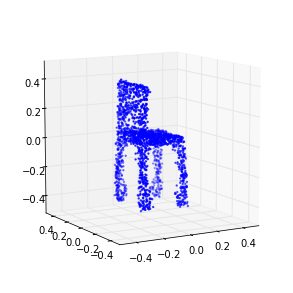

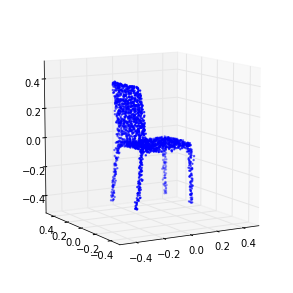

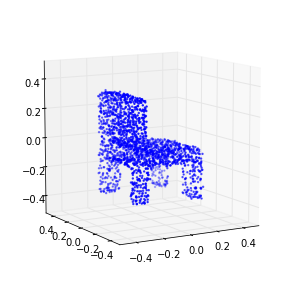

321 (-0.18636416792869567, -0.053723191014594503)
322 (-0.18503140763000206, -0.059637740185415303)
323 (-0.18410722210451408, -0.052203288336318952)
324 (-0.18508097452146036, -0.049184660806700038)
325 (-0.18653986001456224, -0.04694810640756731)
326 (-0.18624109278122583, -0.052618635231973951)
327 (-0.18379478046187647, -0.033340514396075847)
328 (-0.18603047585045851, -0.043404787882334657)
329 (-0.18500680636476588, -0.043365752126124722)
330 (-0.18550444488172177, -0.046033509213615348)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-330 is not in all_model_checkpoint_paths. Manually adding it.


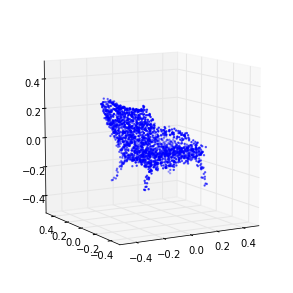

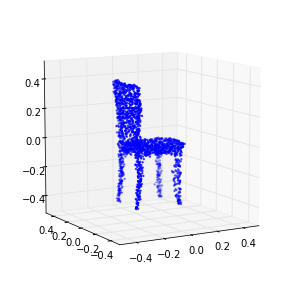

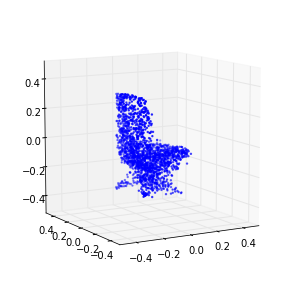

331 (-0.18384150553632667, -0.045053791409979262)
332 (-0.18301172703504562, -0.049456933884088089)
333 (-0.18517181492514082, -0.035834807626627108)
334 (-0.18682830455126587, -0.03620313824568358)
335 (-0.18706778045053835, -0.042654780101858907)
336 (-0.18706227971447839, -0.033030925542806032)
337 (-0.18755372928248512, -0.028168216360629432)
338 (-0.18733994232283699, -0.039022084618746129)
339 (-0.18803816012762212, -0.030680642894434708)
340 (-0.1844011996631269, -0.030867762811895873)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-340 is not in all_model_checkpoint_paths. Manually adding it.


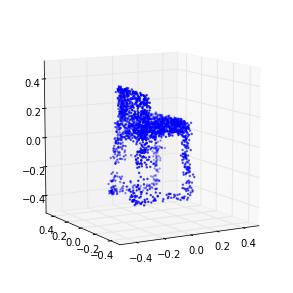

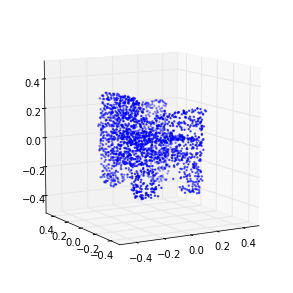

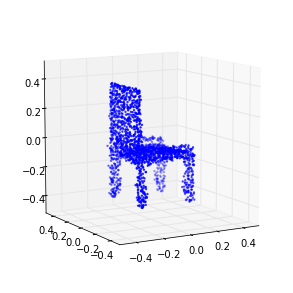

341 (-0.18510828724613895, -0.039767302555480492)
342 (-0.18720713710343395, -0.028414772922621557)
343 (-0.18863716809837908, -0.030246262335115008)
344 (-0.18618145033165259, -0.031735876368151769)
345 (-0.18662721614042918, -0.034135349853723136)
346 (-0.18661089727172145, -0.0086936345841321684)
347 (-0.18641861577828725, -0.024588917563151982)
348 (-0.18715099030070834, -0.024131325418474497)
349 (-0.18592155443297492, -0.020127958186936599)
350 (-0.18669479941880263, -0.01675061433127633)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-350 is not in all_model_checkpoint_paths. Manually adding it.


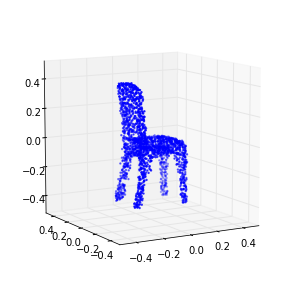

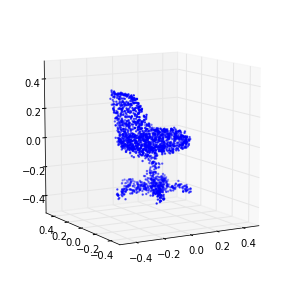

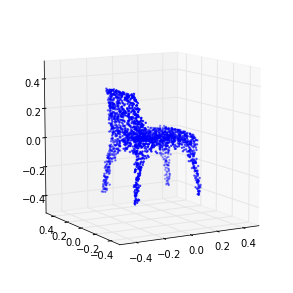

351 (-0.18602915698731387, -0.026314442822088797)
352 (-0.1858615655038092, -0.017373999071962857)
353 (-0.18779871397548251, -0.0067531906706453475)
354 (-0.18772750552053805, -0.015940609025872417)
355 (-0.19001395415376734, -0.0014392445381316873)
356 (-0.18674987554550171, -0.0045002591365051487)
357 (-0.18772711919413673, -0.011959837904820839)
358 (-0.18789212190442614, 0.0060648789060198599)
359 (-0.18734808001253339, -0.0095380309762226213)
360 (-0.18647267674958265, -0.0060346742091631446)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-360 is not in all_model_checkpoint_paths. Manually adding it.


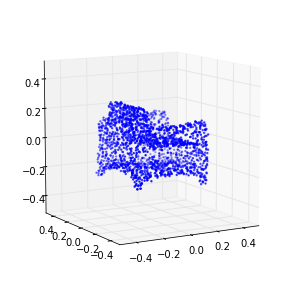

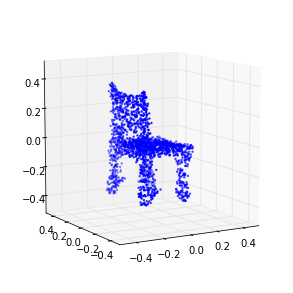

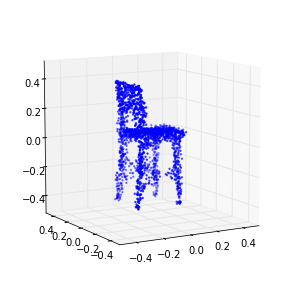

361 (-0.18827921891653979, -0.0087344565739234294)
362 (-0.18644216435926933, -0.010188055535157522)
363 (-0.1878531802031729, 0.0072496839609273054)
364 (-0.18761293711485685, 0.0037926159264450826)
365 (-0.18948263294166989, 0.006034698281264691)
366 (-0.18758778721094133, 0.0047252224499566686)
367 (-0.18834659457206726, 0.012749797526609015)
368 (-0.18822371065616608, 0.0054338331575746893)
369 (-0.18867176572481792, 0.023645409348386305)
370 (-0.18867691446233678, 0.0088378933292848089)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-370 is not in all_model_checkpoint_paths. Manually adding it.


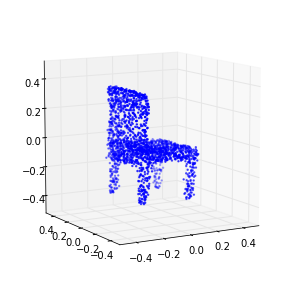

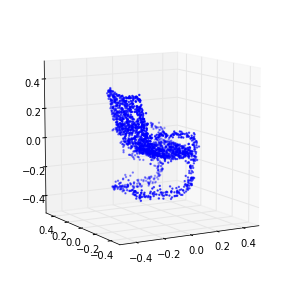

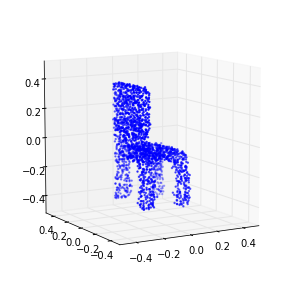

371 (-0.1851949269020999, 0.0044131663076027675)
372 (-0.18816131209885634, 0.024081893920622491)
373 (-0.18845797170091558, 0.0070194154460397028)
374 (-0.18452992058462567, 0.020982401893922576)
375 (-0.18537152464743015, 0.02514123533748918)
376 (-0.18673995236555735, 0.023930395358345576)
377 (-0.18863598963728659, 0.020310314820596465)
378 (-0.18716996510823566, 0.0225854373054096)
379 (-0.18446282578839196, 0.033370932943567085)
380 (-0.18948674268192714, 0.025890529017757485)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-380 is not in all_model_checkpoint_paths. Manually adding it.


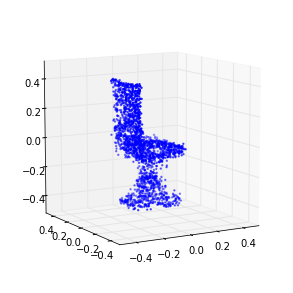

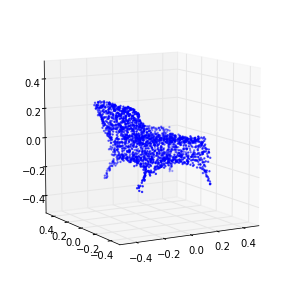

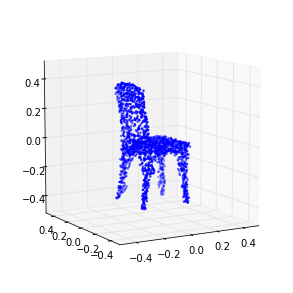

381 (-0.18675146235360041, 0.034467741881531698)
382 (-0.18898132487579627, 0.032814211970954028)
383 (-0.18842677849310416, 0.021003202914639755)
384 (-0.1875500970416599, 0.021076430316531548)
385 (-0.18876944256049616, 0.020607473078632244)
386 (-0.18748659524652694, 0.032950987918647354)
387 (-0.18825601416605489, 0.018224037243743187)
388 (-0.18695926290971263, 0.036412861111953305)
389 (-0.18688337063347851, 0.027358214940047927)
390 (-0.18606148505652392, 0.024411423838938826)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-390 is not in all_model_checkpoint_paths. Manually adding it.


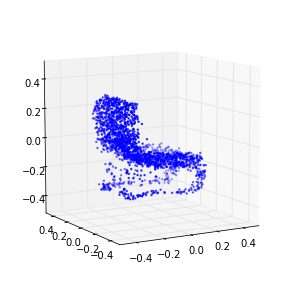

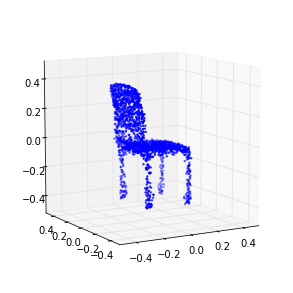

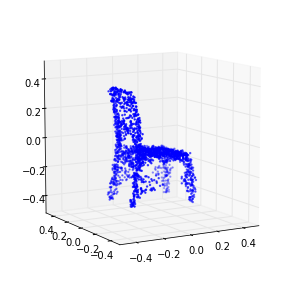

391 (-0.18520500891738467, 0.040551318373117179)
392 (-0.18788628103556457, 0.042751266862507221)
393 (-0.18810391757223341, 0.031342315246109607)
394 (-0.18633948134051428, 0.037212865427136421)
395 (-0.18836250956411715, 0.04998262209334859)
396 (-0.18618921273284489, 0.041663487614304932)
397 (-0.18697511399233782, 0.043422001638208273)
398 (-0.18619766847954855, 0.049155589779493983)
399 (-0.18840983946014334, 0.053706276196020621)
400 (-0.1876156735199469, 0.052315377725150297)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-400 is not in all_model_checkpoint_paths. Manually adding it.


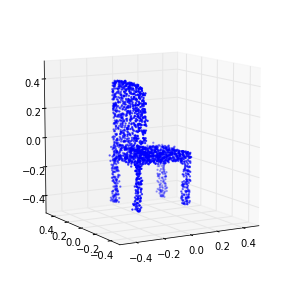

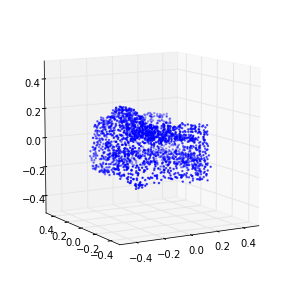

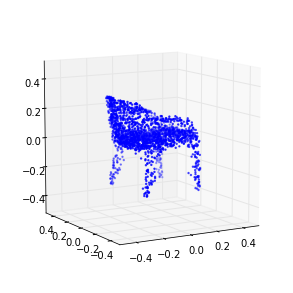

401 (-0.18676135264061117, 0.041387618933286935)
402 (-0.18690686247966909, 0.043992000494014333)
403 (-0.18638038535912832, 0.057140785924814363)
404 (-0.18717985500892004, 0.051429833113043395)
405 (-0.18570587635040284, 0.064581293336771151)
406 (-0.18556580885692878, 0.047407487234859554)
407 (-0.18694940606753033, 0.067499152971086676)
408 (-0.18716755509376526, 0.055207205522391528)
409 (-0.18599305274309935, 0.068998549823407779)
410 (-0.18812043418486912, 0.065949987275180991)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-410 is not in all_model_checkpoint_paths. Manually adding it.


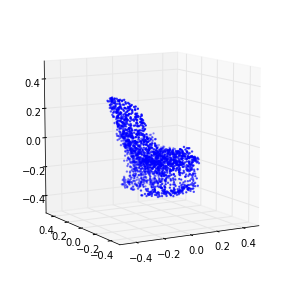

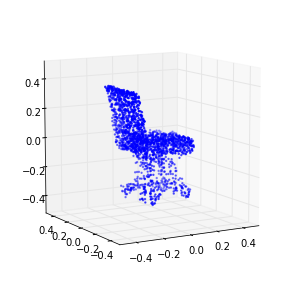

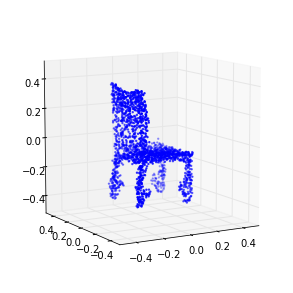

411 (-0.18478988607724509, 0.057744319309239033)
412 (-0.18852016660902235, 0.063164949279140542)
413 (-0.18798772179418141, 0.060658895790025043)
414 (-0.18587012357181973, 0.065182328155195271)
415 (-0.187211938754276, 0.060073519263554503)
416 (-0.18744575414392683, 0.064609287720587522)
417 (-0.18604335685571036, 0.074047257502873734)
418 (-0.18685844165307505, 0.076937154763274729)
419 (-0.18831096909664297, 0.077843942851931955)
420 (-0.18627838569658775, 0.071265024098533178)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-420 is not in all_model_checkpoint_paths. Manually adding it.


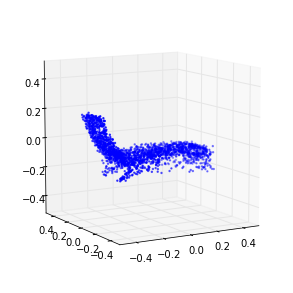

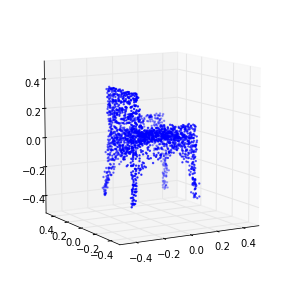

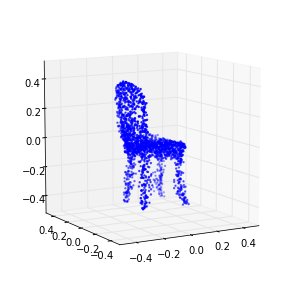

421 (-0.18428193463219536, 0.073169145112236336)
422 (-0.18757414828847957, 0.074087844264728045)
423 (-0.18461151790839656, 0.07114890548917982)
424 (-0.18485418740246032, 0.068858190681095471)
425 (-0.18683666586875916, 0.074512389936932807)
426 (-0.18696244634963849, 0.078417538354794189)
427 (-0.1880953914589352, 0.07365442246750549)
428 (-0.18623725473880767, 0.07607374360991849)
429 (-0.18652133279376559, 0.087074604437307079)
430 (-0.18518860792672193, 0.081238844604403879)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-430 is not in all_model_checkpoint_paths. Manually adding it.


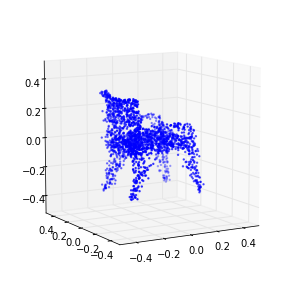

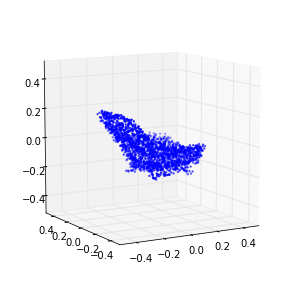

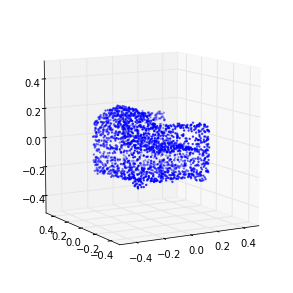

431 (-0.187429200830283, 0.084216852844865228)
432 (-0.18827472318101812, 0.081460099529336999)
433 (-0.18587984067422372, 0.079580376269640749)
434 (-0.18766586863332324, 0.083663439999024078)
435 (-0.18412319482476622, 0.090678921038353885)
436 (-0.1861601996201056, 0.086864911571696957)
437 (-0.18591572642326354, 0.085872885667615473)
438 (-0.18559970828118147, 0.094297301162172248)
439 (-0.18700579559361494, 0.087606437090370387)
440 (-0.18812532049638253, 0.088215668996175126)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-440 is not in all_model_checkpoint_paths. Manually adding it.


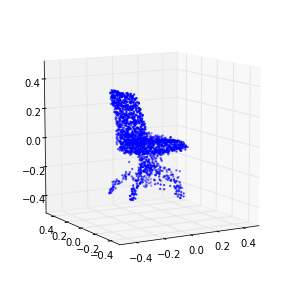

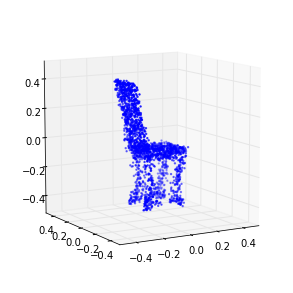

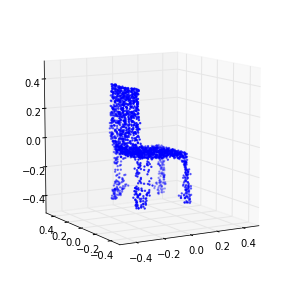

441 (-0.18618290435384821, 0.093106696451151813)
442 (-0.18710207939147949, 0.087071124774714306)
443 (-0.1868787290873351, 0.090638353316872214)
444 (-0.18534174947826951, 0.093685367869006261)
445 (-0.18488349947664473, 0.092196822994285166)
446 (-0.1855033681348518, 0.1066742616671103)
447 (-0.18525687842457383, 0.092400531250017667)
448 (-0.18643759422832065, 0.087012867408770109)
449 (-0.18556158763391001, 0.1002573626184905)
450 (-0.18488490460095583, 0.099470847734698539)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-450 is not in all_model_checkpoint_paths. Manually adding it.


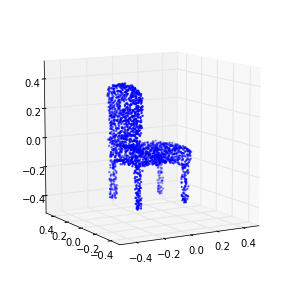

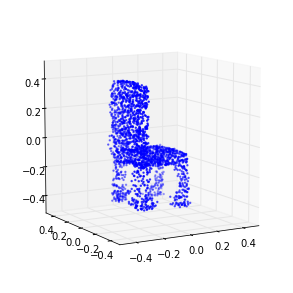

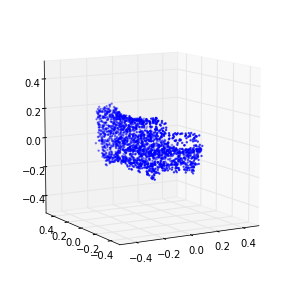

451 (-0.18744835831500867, 0.095398625289952313)
452 (-0.18544707309316705, 0.090336633777176892)
453 (-0.18641460880085273, 0.097279990298880473)
454 (-0.18675240245130326, 0.094988789409399033)
455 (-0.18484904876461736, 0.087364891337023839)
456 (-0.18678410704489107, 0.10213351663615969)
457 (-0.18482895670113741, 0.098317008051607341)
458 (-0.18415749746340293, 0.10332597764553847)
459 (-0.185887493469097, 0.10105646236075295)
460 (-0.18702196147706773, 0.1147661468497029)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-460 is not in all_model_checkpoint_paths. Manually adding it.


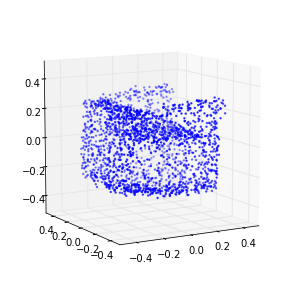

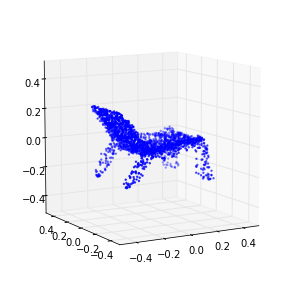

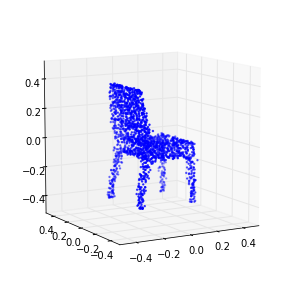

461 (-0.1857154099477662, 0.1039822291996744)
462 (-0.18529961970117356, 0.10618664655420515)
463 (-0.18726578796351398, 0.11504595326604666)
464 (-0.18427926312994075, 0.10969083342287275)
465 (-0.18581649859746296, 0.10592982559292405)
466 (-0.18513041569126976, 0.09704199557503064)
467 (-0.18453637891345553, 0.1096257879226296)
468 (-0.18569124147847846, 0.10883764536292465)
469 (-0.1856991462133549, 0.11520151324846127)
470 (-0.18523436199735713, 0.10804049836264716)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-470 is not in all_model_checkpoint_paths. Manually adding it.


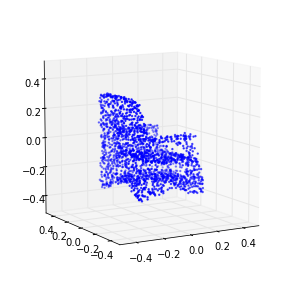

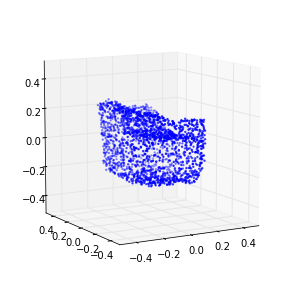

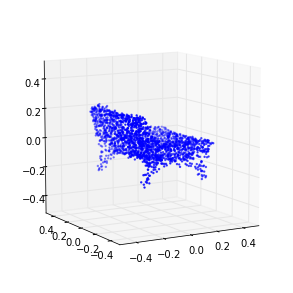

471 (-0.18598028189606136, 0.11546996898121303)
472 (-0.18855980226287136, 0.11875291444637158)
473 (-0.18781650723130613, 0.10993855474171815)
474 (-0.18803205451479665, 0.101860953701867)
475 (-0.18632664570101984, 0.10430808096296257)
476 (-0.18750769164827136, 0.11322001367807388)
477 (-0.18494584781152232, 0.098556801400802752)
478 (-0.18621643748548294, 0.10480776098039415)
479 (-0.18587676529531125, 0.10812097153177967)
480 (-0.18777981676437236, 0.10827933472615701)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-480 is not in all_model_checkpoint_paths. Manually adding it.


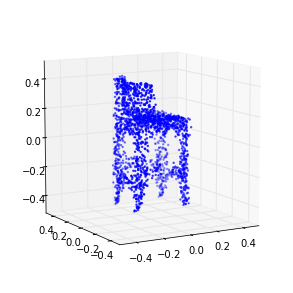

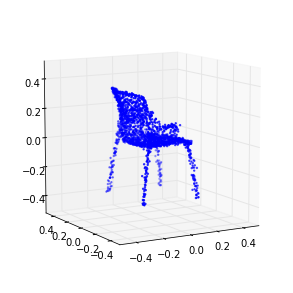

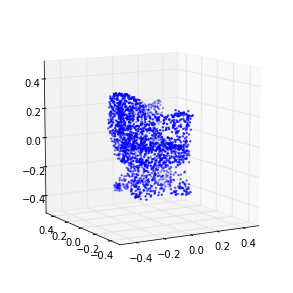

481 (-0.18597076435883839, 0.093531388237520496)
482 (-0.18656384922839978, 0.12041552392420946)
483 (-0.18675601239557618, 0.10550404767747279)
484 (-0.18559585644139184, 0.10967775737797772)
485 (-0.18604419286604282, 0.10622472371216174)
486 (-0.18665894766648611, 0.11644249133489749)
487 (-0.18375890321201749, 0.11390872575618603)
488 (-0.18547012701078697, 0.10962795576563587)
489 (-0.18687123485185481, 0.12141548014349407)
490 (-0.18606279746249871, 0.11225800685308597)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-490 is not in all_model_checkpoint_paths. Manually adding it.


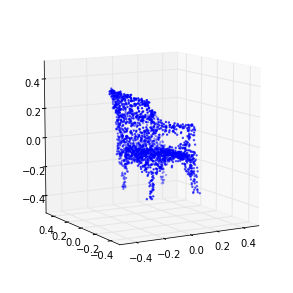

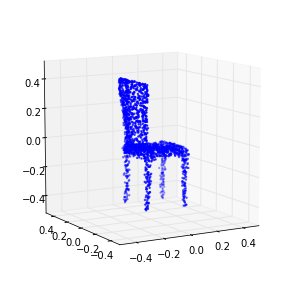

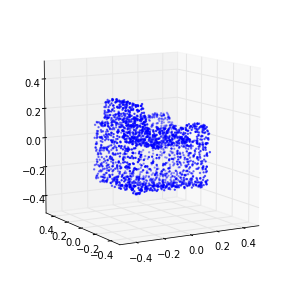

491 (-0.1860651351787426, 0.11676562191159637)
492 (-0.18447390529844496, 0.11889814419878854)
493 (-0.18525995545917087, 0.12040894312991036)
494 (-0.18724119056154181, 0.11262820661067963)
495 (-0.18702428605821397, 0.12923223773638406)
496 (-0.18438974916934966, 0.11715375935589825)
497 (-0.18462904879340419, 0.1274444822359968)
498 (-0.18626222301412512, 0.11641816077408967)
499 (-0.18617285291353861, 0.12686667122222758)
500 (-0.18674480583932665, 0.12525216821167204)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-500 is not in all_model_checkpoint_paths. Manually adding it.


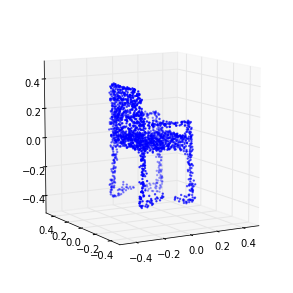

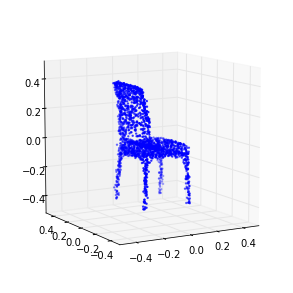

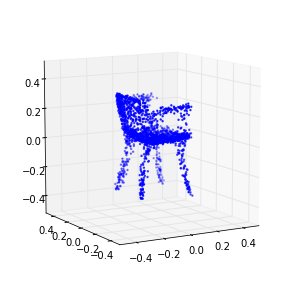

501 (-0.1860525181999913, 0.13076339413722357)
502 (-0.18429234469378436, 0.1202047986012918)
503 (-0.18744316277680573, 0.12360083753312076)
504 (-0.18646505298437896, 0.120436267444381)
505 (-0.18516784939501021, 0.12892840305964151)
506 (-0.18796361353662278, 0.13981078206389039)
507 (-0.18538465268082088, 0.133323366995211)
508 (-0.18389487779802746, 0.12008469882938597)
509 (-0.18413650581130275, 0.12841828029464791)
510 (-0.18812402398497971, 0.1257216030800784)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-510 is not in all_model_checkpoint_paths. Manually adding it.


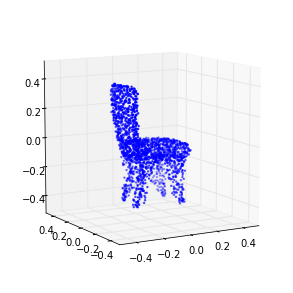

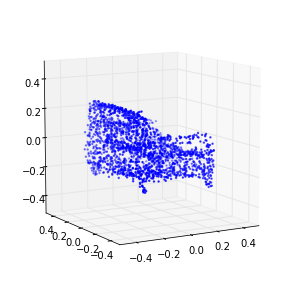

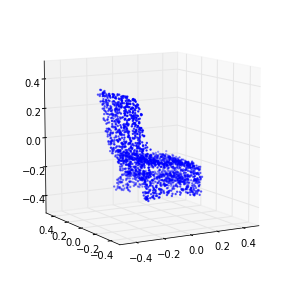

511 (-0.1869054878199542, 0.13428085518104058)
512 (-0.18851375778516133, 0.12183565177299359)
513 (-0.18703575487490054, 0.14220466161215747)
514 (-0.18772631850507523, 0.13238838094252128)
515 (-0.18754077156384785, 0.12226527073868999)
516 (-0.18679057514225994, 0.13915044565995535)
517 (-0.18585088396513905, 0.12717625002066293)
518 (-0.18800522751278348, 0.13744412666117703)
519 (-0.18608142292058028, 0.12456242188259407)
520 (-0.18675320589983904, 0.12538039739485141)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-520 is not in all_model_checkpoint_paths. Manually adding it.


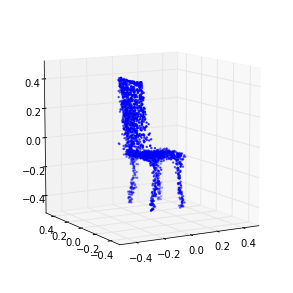

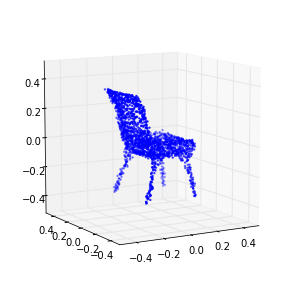

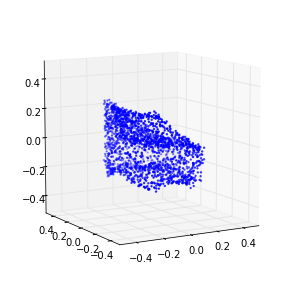

521 (-0.18481531397060111, 0.1317606877397608)
522 (-0.1858275823019169, 0.12596402234501308)
523 (-0.18513396630684534, 0.13676422751612133)
524 (-0.18571598275944037, 0.13368548425259413)
525 (-0.18518380417867944, 0.12990940086267613)
526 (-0.18621133058159439, 0.13575999218004722)
527 (-0.18456520901785956, 0.14206064492464066)
528 (-0.18566577754638813, 0.13475473169927243)
529 (-0.18480137288570403, 0.13989574351796397)
530 (-0.18605496066587943, 0.12361779477861193)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-530 is not in all_model_checkpoint_paths. Manually adding it.


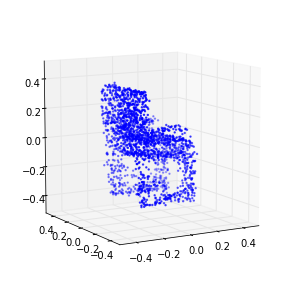

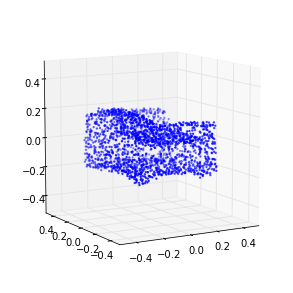

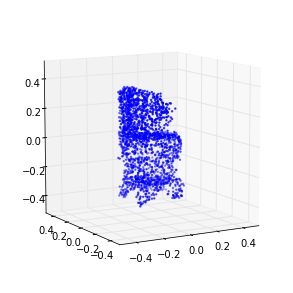

531 (-0.1861691810466625, 0.14371040270284371)
532 (-0.18554943733745152, 0.14200361762885694)
533 (-0.18548351139933975, 0.13387742942130124)
534 (-0.18770523308603851, 0.14318927294678158)
535 (-0.18535525721532328, 0.14458001322216457)
536 (-0.18671335230271022, 0.14417763771834197)
537 (-0.18480530911021761, 0.13673392490104394)
538 (-0.18582805947021203, 0.15041743798388374)
539 (-0.18544380609635955, 0.14553812339350028)
540 (-0.18597039745913613, 0.14096451826669551)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-540 is not in all_model_checkpoint_paths. Manually adding it.


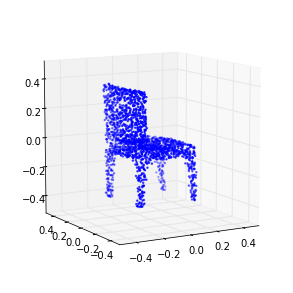

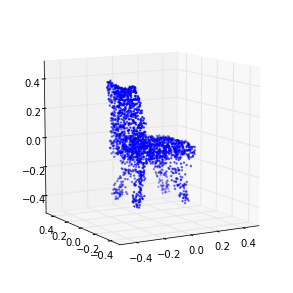

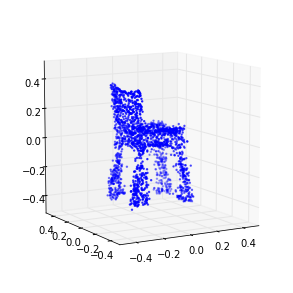

541 (-0.18586935588607081, 0.14689543677700889)
542 (-0.18611754924058915, 0.13644914522215171)
543 (-0.18477439438855206, 0.14584490601663236)
544 (-0.18522389122733363, 0.13714538983724736)
545 (-0.18536337945196363, 0.14589808494956405)
546 (-0.1845462230068666, 0.14650235794208669)
547 (-0.18789379751240765, 0.14726517735807984)
548 (-0.18665940320050275, 0.14352597020290517)
549 (-0.18646211679334992, 0.15188195280454778)
550 (-0.18442216217517854, 0.14713562804239769)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-550 is not in all_model_checkpoint_paths. Manually adding it.


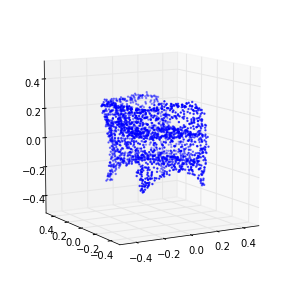

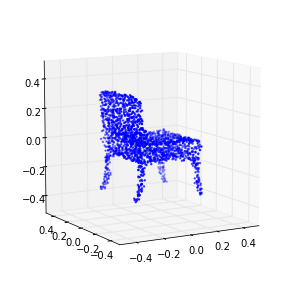

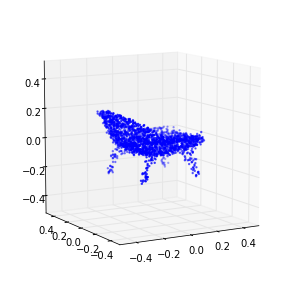

551 (-0.18565151128504012, 0.14894507190695516)
552 (-0.18386890225940281, 0.14607114841540655)
553 (-0.18592719038327535, 0.15007141425653739)
554 (-0.18588144448068405, 0.14897138763357093)
555 (-0.18415526118543413, 0.14636264051552172)
556 (-0.18663317312796909, 0.14692971662238793)
557 (-0.18487389198055973, 0.15526771076299525)
558 (-0.18549751650404048, 0.14804691986905205)
559 (-0.18469348406350172, 0.16221198549977056)
560 (-0.18493592849484197, 0.15574461663210834)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-560 is not in all_model_checkpoint_paths. Manually adding it.


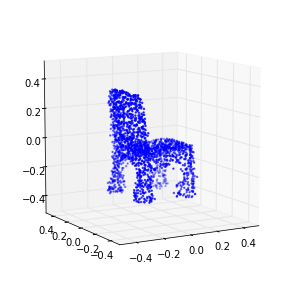

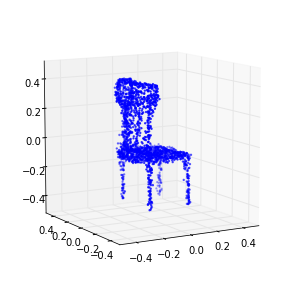

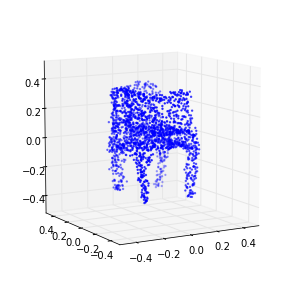

561 (-0.18543660988410313, 0.15654788414637247)
562 (-0.1849471425016721, 0.14499730782376397)
563 (-0.18615543687785113, 0.16132817058651536)
564 (-0.18396649448959915, 0.15308383686674965)
565 (-0.18536700738800896, 0.16197529104020861)
566 (-0.18240636598180843, 0.14776339519906928)
567 (-0.18516986447351949, 0.16634451239197343)
568 (-0.18521627077349909, 0.15994304694511272)
569 (-0.18436249627007378, 0.15189092992632477)
570 (-0.18534745220784787, 0.16387591759363809)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-570 is not in all_model_checkpoint_paths. Manually adding it.


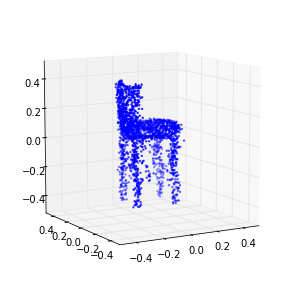

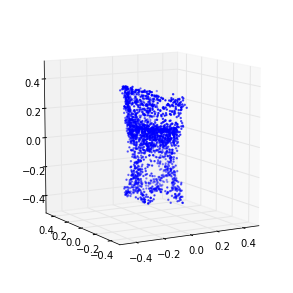

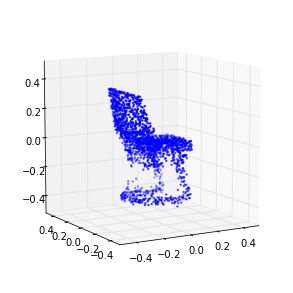

571 (-0.18475399182902441, 0.1535247125559383)
572 (-0.18457827126538312, 0.16018895335771419)
573 (-0.18550021063398431, 0.15763428310553232)
574 (-0.18591434867293746, 0.15093207718045623)
575 (-0.18456368186959513, 0.1671641347584901)
576 (-0.18327809009287094, 0.16002323147323397)
577 (-0.18468581349761398, 0.1517419660532916)
578 (-0.18328271999403281, 0.16653334321799101)
579 (-0.18384658881911525, 0.16174122084070136)
580 (-0.1853235070352201, 0.15714454706068393)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-580 is not in all_model_checkpoint_paths. Manually adding it.


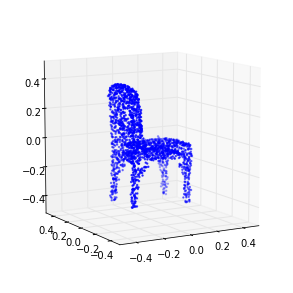

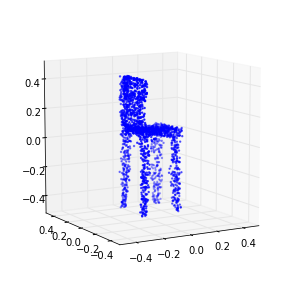

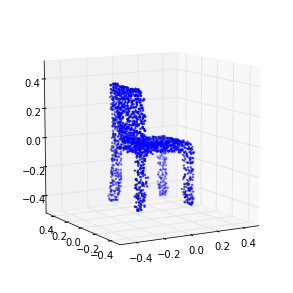

581 (-0.18425019124039896, 0.15961762490095915)
582 (-0.18356977414201808, 0.16463296556914295)
583 (-0.18674189503546115, 0.17476327220598856)
584 (-0.18479637779571392, 0.16078681195223773)
585 (-0.18461917269009132, 0.17015517640996863)
586 (-0.18424236928975141, 0.16323254864524911)
587 (-0.18702586988608041, 0.15662758273107033)
588 (-0.18498739544992093, 0.16212710903750527)
589 (-0.18556057093320069, 0.17082066833972931)
590 (-0.18346698184808094, 0.16699098381731245)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-590 is not in all_model_checkpoint_paths. Manually adding it.


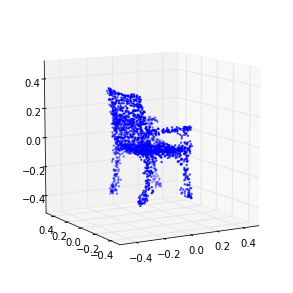

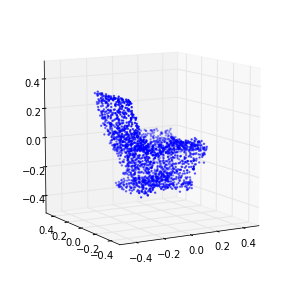

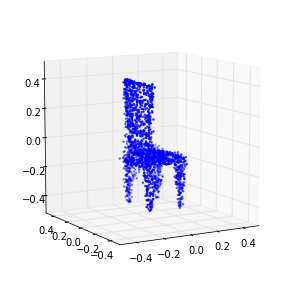

591 (-0.18365613288349575, 0.17832394661726775)
592 (-0.18506900061059881, 0.16852548718452454)
593 (-0.18363051204769701, 0.17505704859892526)
594 (-0.18503475950823889, 0.17507683402962154)
595 (-0.18610671162605286, 0.18436398605505624)
596 (-0.1838007202854863, 0.17375650891551264)
597 (-0.18317256536748674, 0.16947538267683099)
598 (-0.18598174099568968, 0.17675588749073171)
599 (-0.18484320745423988, 0.17790756678139721)
600 (-0.1850387140556618, 0.17184273788222559)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-600 is not in all_model_checkpoint_paths. Manually adding it.


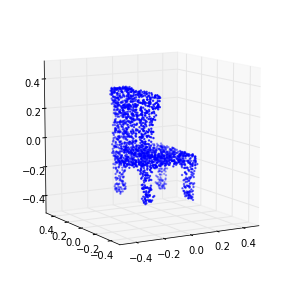

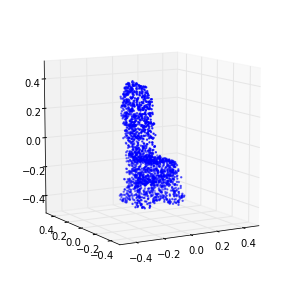

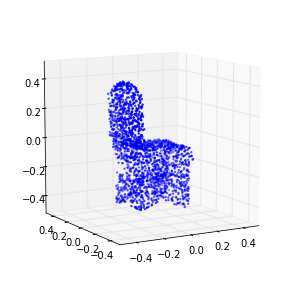

601 (-0.18376159866650899, 0.17181015400974839)
602 (-0.18414609443258356, 0.17762985025291089)
603 (-0.18430302750181268, 0.18095516551423957)
604 (-0.1839638392130534, 0.18015443837201153)
605 (-0.18516399948685258, 0.17265013522571987)
606 (-0.17992052733898162, 0.16794385567859368)
607 (-0.18402524380772203, 0.17982863055335152)
608 (-0.1842355763470685, 0.18087400882332413)
609 (-0.18291908922018829, 0.18391544068301166)
610 (-0.18429111159510084, 0.18622537453969321)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-610 is not in all_model_checkpoint_paths. Manually adding it.


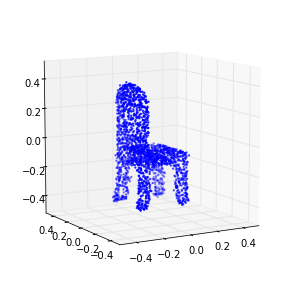

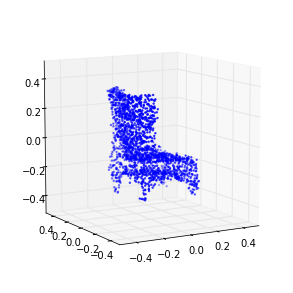

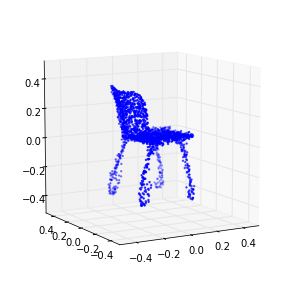

611 (-0.18199824779121965, 0.17287186450428432)
612 (-0.18538474087361936, 0.1838235060373942)
613 (-0.18322444249082495, 0.18590942356321546)
614 (-0.18237340555146889, 0.18304663455044781)
615 (-0.18606216775046455, 0.18598084869208159)
616 (-0.18470604452821943, 0.18716043840955804)
617 (-0.18429848700761794, 0.17641944907329701)
618 (-0.18375449406879921, 0.18223464157846239)
619 (-0.18455370979176627, 0.18674467945540393)
620 (-0.18486796203586792, 0.1909345504310396)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-620 is not in all_model_checkpoint_paths. Manually adding it.


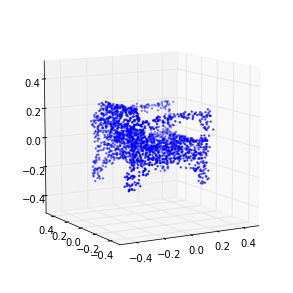

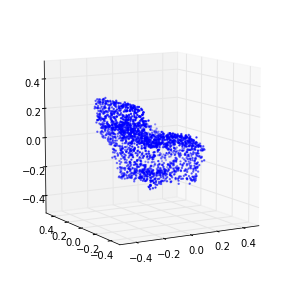

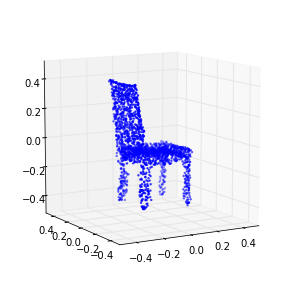

621 (-0.18283997663745175, 0.169765113680451)
622 (-0.185770461735902, 0.18489596468430977)
623 (-0.18398625166327864, 0.18653791149457297)
624 (-0.18339720103475782, 0.18728741175598568)
625 (-0.18502530532854575, 0.19236088185398667)
626 (-0.18565574442898786, 0.18602072585512092)
627 (-0.18426577382617526, 0.19549045353024094)
628 (-0.18447292899643933, 0.19067879573062615)
629 (-0.18471059280413168, 0.19760298839321844)
630 (-0.18447967105441623, 0.19634440486077909)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-630 is not in all_model_checkpoint_paths. Manually adding it.


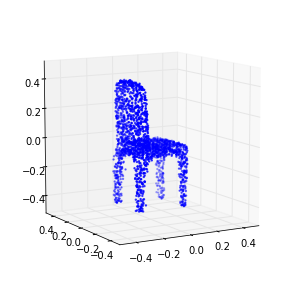

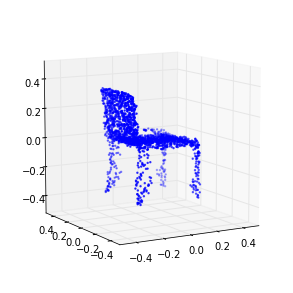

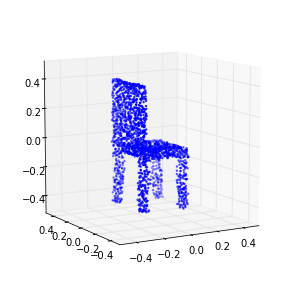

631 (-0.18573467858411646, 0.19242512903831624)
632 (-0.18521904051303864, 0.19028110691794642)
633 (-0.18277600948457365, 0.18722755323957513)
634 (-0.1842747935542354, 0.1952099590389817)
635 (-0.18448646863301596, 0.19190447805104432)
636 (-0.18590457097247795, 0.19668503712724755)
637 (-0.18443178512431957, 0.18876398161605554)
638 (-0.18548214303122626, 0.19326914846897125)
639 (-0.18426604679337255, 0.19066807682867404)
640 (-0.18340527017911276, 0.19578241639667088)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-640 is not in all_model_checkpoint_paths. Manually adding it.


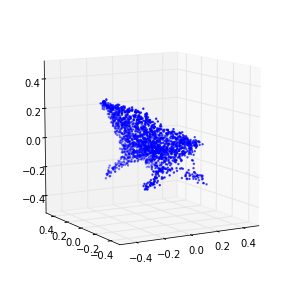

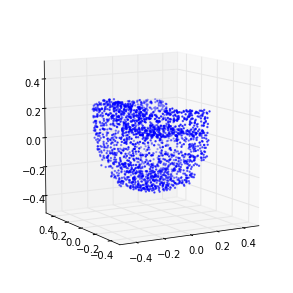

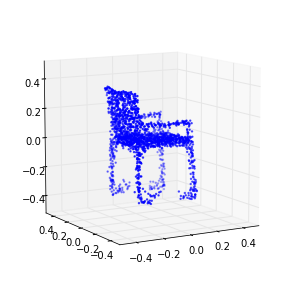

641 (-0.18573658135202195, 0.19760070630797633)
642 (-0.18348912530475192, 0.19553572988068615)
643 (-0.18536059657732645, 0.2020070227207961)
644 (-0.18378926603882401, 0.18583869878892545)
645 (-0.18500462097150308, 0.19848111161479243)
646 (-0.18594608019899439, 0.19412942396269905)
647 (-0.1841061403354009, 0.19803898864322239)
648 (-0.18407444744198412, 0.19546252599468938)
649 (-0.18518351294376231, 0.19270683493879107)
650 (-0.18528002384636139, 0.2075989571986375)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-650 is not in all_model_checkpoint_paths. Manually adding it.


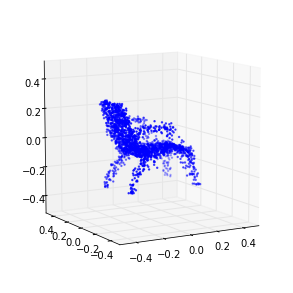

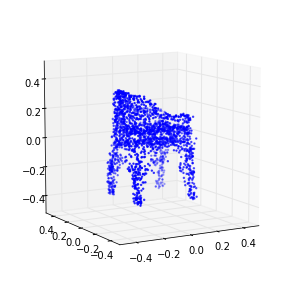

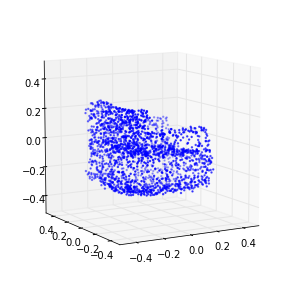

651 (-0.18336409407633322, 0.20020882674941309)
652 (-0.18473561008771261, 0.19973957869741651)
653 (-0.18319822616047329, 0.20759747922420502)
654 (-0.18177462805200506, 0.19889377609447198)
655 (-0.18433288413065452, 0.21047533827799339)
656 (-0.18661183207123369, 0.19820114694259786)
657 (-0.18454346502268756, 0.20147406392627293)
658 (-0.1862387686415955, 0.19652765547787701)
659 (-0.1826797049354624, 0.19926872352759042)
660 (-0.18437034487724305, 0.20039249183955016)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-660 is not in all_model_checkpoint_paths. Manually adding it.


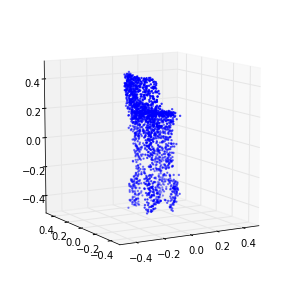

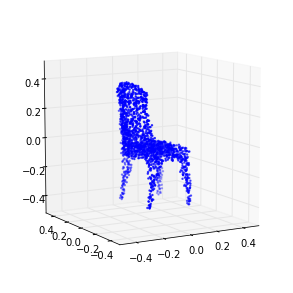

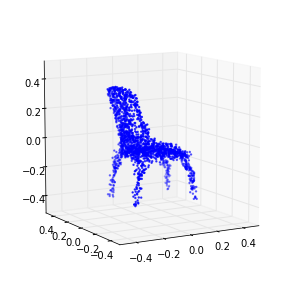

661 (-0.18431536102736437, 0.19444770614306131)
662 (-0.18303971665876884, 0.20674357590851961)
663 (-0.18222991945566955, 0.20663302198604303)
664 (-0.18241273242014425, 0.19347931168697499)
665 (-0.18519310443489639, 0.2086794713029155)
666 (-0.18389026362586905, 0.19769478948027999)
667 (-0.18432559221982955, 0.19948617672478711)
668 (-0.18386008783623023, 0.20213185526706554)
669 (-0.18491585475427133, 0.19959522618187797)
670 (-0.18394328819380867, 0.20735430275952374)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-670 is not in all_model_checkpoint_paths. Manually adding it.


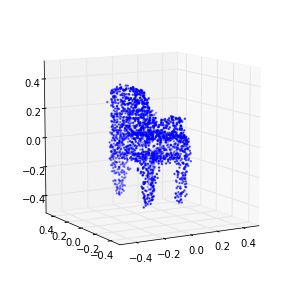

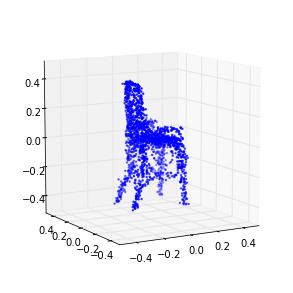

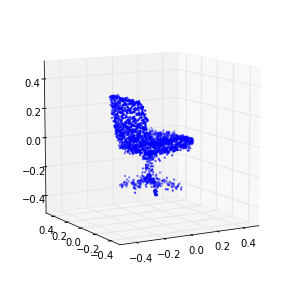

671 (-0.18615800076060826, 0.21308512875327357)
672 (-0.18203120043984167, 0.20691224049638818)
673 (-0.18471911781364017, 0.21093818545341492)
674 (-0.18508845070997873, 0.20456596436323943)
675 (-0.18457111363057738, 0.20421841630229243)
676 (-0.1848575383424759, 0.21244685296659116)
677 (-0.1832133377039874, 0.20277542869249979)
678 (-0.18419107618155303, 0.21536895577554349)
679 (-0.18528418408499825, 0.21002396665237569)
680 (-0.18486878297947071, 0.21446777714623344)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-680 is not in all_model_checkpoint_paths. Manually adding it.


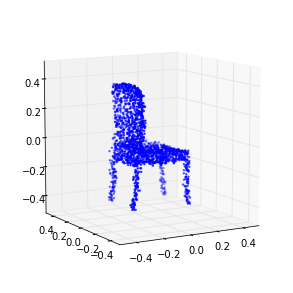

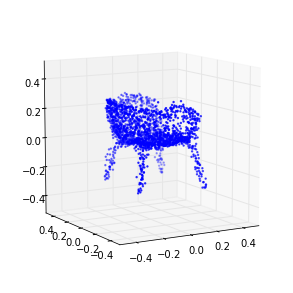

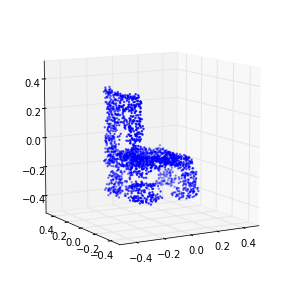

681 (-0.18392488570125015, 0.20425873222174468)
682 (-0.18203383833169937, 0.21433643279252229)
683 (-0.18420586530809049, 0.20434293702796655)
684 (-0.18339161022945685, 0.2101311242138898)
685 (-0.18529043837829873, 0.21194208330578274)
686 (-0.18599301885675501, 0.21218767541426201)
687 (-0.18614462614059449, 0.21674643015419995)
688 (-0.18527102669080098, 0.21645345787207285)
689 (-0.1831149998638365, 0.20428650136347171)
690 (-0.18549355290554187, 0.2093829247686598)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-690 is not in all_model_checkpoint_paths. Manually adding it.


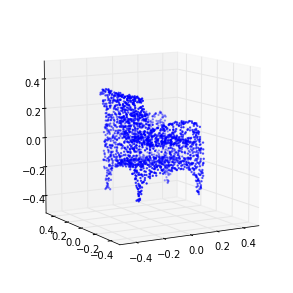

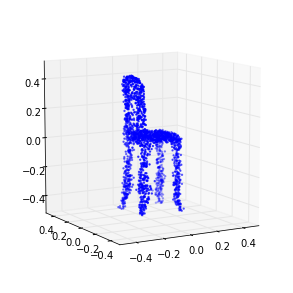

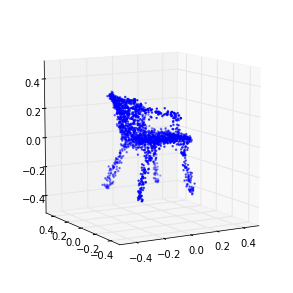

691 (-0.18421622073208843, 0.21435255916030319)
692 (-0.18433634804354773, 0.21694955671275104)
693 (-0.18452892844323759, 0.21536617974440256)
694 (-0.18322267995940314, 0.21142662509723945)
695 (-0.18522117998864915, 0.21361834528269591)
696 (-0.18492124919538144, 0.21278139507329022)
697 (-0.18355139355968547, 0.2117252680990431)
698 (-0.18419795864158206, 0.21753521484357338)
699 (-0.18350360084463049, 0.21513524927474834)
700 (-0.18578895220050104, 0.22299215307942144)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-700 is not in all_model_checkpoint_paths. Manually adding it.


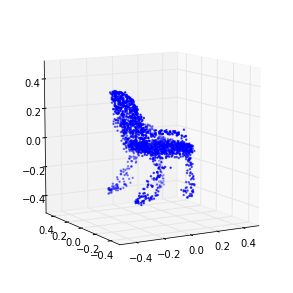

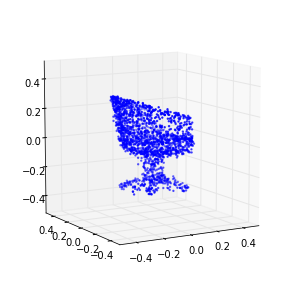

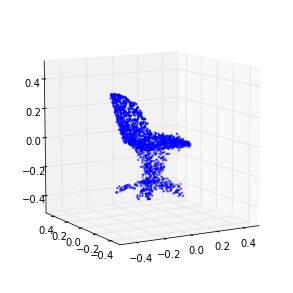

701 (-0.18492687118274195, 0.20768629456007923)
702 (-0.18452341860091245, 0.22002366185188293)
703 (-0.18427876300281948, 0.21907825216099067)
704 (-0.18350369223841914, 0.21053413936385401)
705 (-0.18607779873741997, 0.22228312602749578)
706 (-0.18252535467898404, 0.22058157898761607)
707 (-0.18481073340883961, 0.20856058376806755)
708 (-0.18373615581680228, 0.21706402522546273)
709 (-0.18468053120153921, 0.22091214303617124)
710 (-0.18589192088003512, 0.21686424756491626)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-710 is not in all_model_checkpoint_paths. Manually adding it.


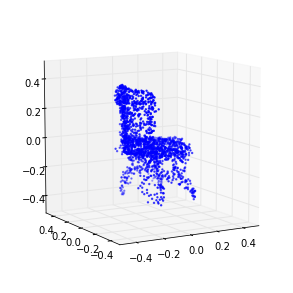

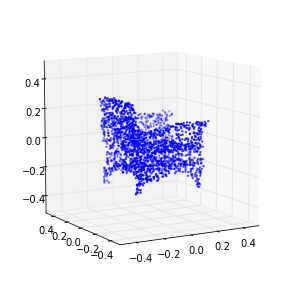

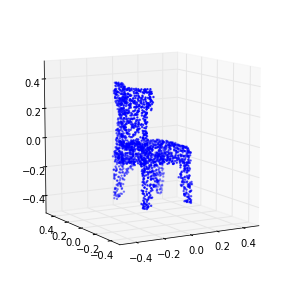

711 (-0.18576244154462107, 0.23806353189327098)
712 (-0.18469507583865413, 0.21154947689285986)
713 (-0.18543182931564473, 0.22268822513244771)
714 (-0.18386782783049124, 0.22639633439205312)
715 (-0.18402861367773127, 0.21970530571760954)
716 (-0.18440823201779966, 0.22947130324663939)
717 (-0.18243012406207898, 0.22171415388584137)
718 (-0.18495702373760717, 0.21840591287171399)
719 (-0.18251776099205017, 0.22890907912342637)
720 (-0.18311438582561634, 0.21687216228908962)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-720 is not in all_model_checkpoint_paths. Manually adding it.


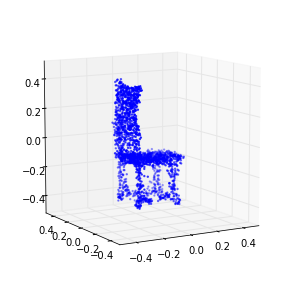

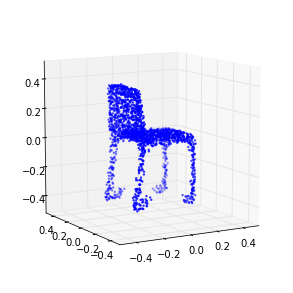

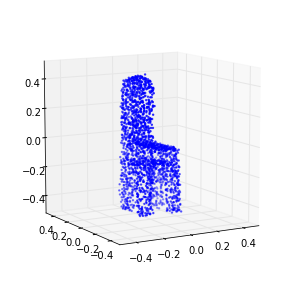

721 (-0.18254838552739885, 0.22743361746823346)
722 (-0.18253760685523351, 0.22640138698948753)
723 (-0.18349375697197737, 0.22074084756550966)
724 (-0.18552937778057876, 0.22355802798712696)
725 (-0.18463783275198054, 0.2197352741603498)
726 (-0.18326679070790608, 0.22649044074394084)
727 (-0.18481991853978899, 0.21992163525687325)
728 (-0.18366799718803831, 0.23348887099160087)
729 (-0.18483004018112464, 0.216928255226877)
730 (-0.18399305167021573, 0.22065597386271865)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-730 is not in all_model_checkpoint_paths. Manually adding it.


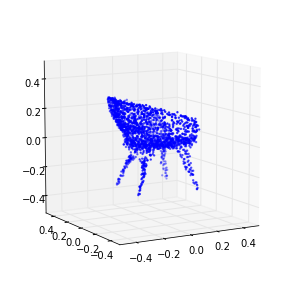

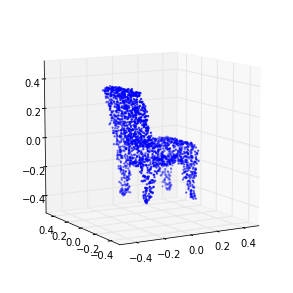

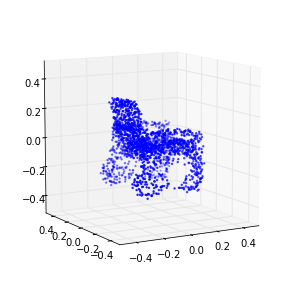

731 (-0.1814457650537844, 0.23070633301028498)
732 (-0.18334442675113677, 0.22641906859698119)
733 (-0.18145128930056537, 0.24114098482661778)
734 (-0.18417755575091752, 0.22371927014103643)
735 (-0.18269862808563092, 0.22800726857450274)
736 (-0.18628795058638961, 0.24767469366391501)
737 (-0.18310757754025636, 0.23365154200130039)
738 (-0.18476338375497747, 0.22458888093630472)
739 (-0.18313017918003929, 0.24186640260396181)
740 (-0.18531295326020983, 0.22908956033212166)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-740 is not in all_model_checkpoint_paths. Manually adding it.


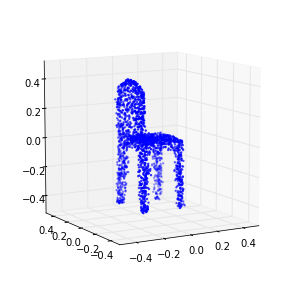

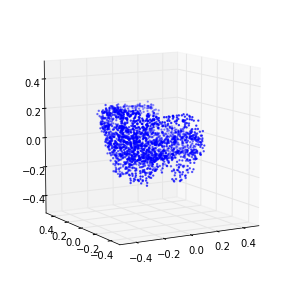

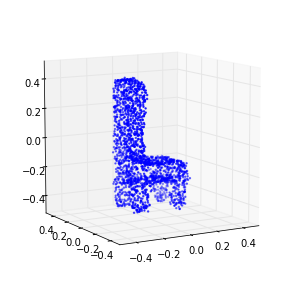

741 (-0.18419173900727873, 0.22823260558976066)
742 (-0.18234451203434557, 0.22156967829774926)
743 (-0.18457980685763889, 0.2351432133603979)
744 (-0.18369681680644001, 0.2159254534376992)
745 (-0.18557625578509437, 0.22809287740124595)
746 (-0.18331907435699746, 0.22752423308513783)
747 (-0.1840609390426565, 0.2289796366735741)
748 (-0.18330669988084722, 0.23901319227836751)
749 (-0.18569415940178766, 0.23381687038474613)
750 (-0.18417291861993296, 0.22282713044572761)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-750 is not in all_model_checkpoint_paths. Manually adding it.


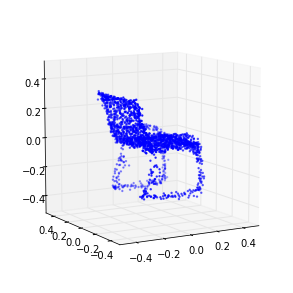

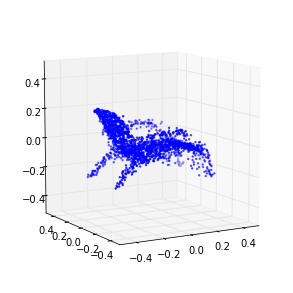

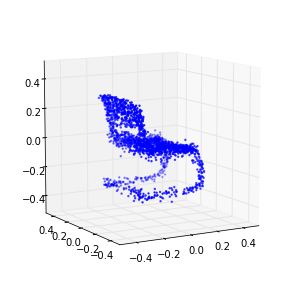

751 (-0.1834765440887875, 0.24224677350785997)
752 (-0.18402644715927266, 0.23964790999889374)
753 (-0.18176773300877325, 0.2305602894888984)
754 (-0.18149783103554337, 0.23411960623882436)
755 (-0.18470125419122202, 0.21503910753462049)
756 (-0.18482061823209125, 0.23656129837036133)
757 (-0.18202894583896354, 0.23548802071147495)
758 (-0.18337420992277287, 0.23174620888851308)
759 (-0.18245299452984776, 0.23043667552647767)
760 (-0.18422176826883246, 0.23139932365329177)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-760 is not in all_model_checkpoint_paths. Manually adding it.


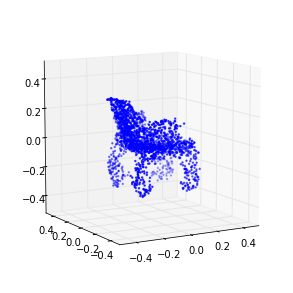

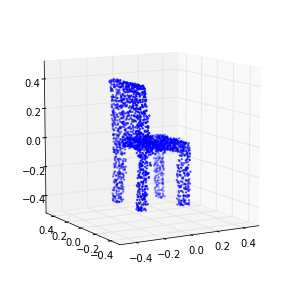

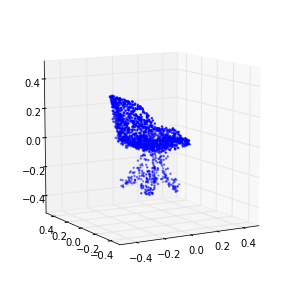

761 (-0.18491565651363798, 0.23946968493638215)
762 (-0.18107341820443118, 0.22875012788507673)
763 (-0.18398643836930947, 0.24055324384459742)
764 (-0.18421681578512544, 0.23701005953329582)
765 (-0.18448395640761764, 0.23401911391152275)
766 (-0.18372205451682763, 0.22889766097068787)
767 (-0.1827615737915039, 0.2278526833763829)
768 (-0.1829706613664274, 0.23845182359218597)
769 (-0.18330753434587407, 0.23292825398621736)
770 (-0.18406775880742957, 0.2437476951766897)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-770 is not in all_model_checkpoint_paths. Manually adding it.


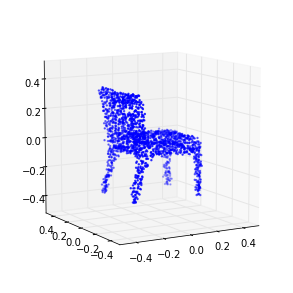

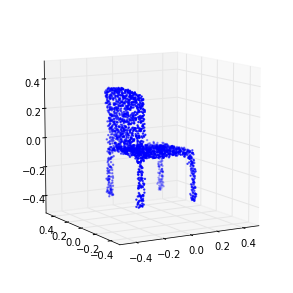

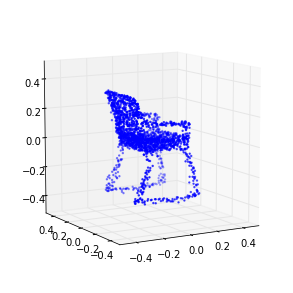

771 (-0.18206102947394054, 0.23831023606989118)
772 (-0.18433212455776002, 0.23657105476767928)
773 (-0.1825781410491025, 0.23986503095538528)
774 (-0.18249433515248475, 0.23976554142104256)
775 (-0.18545708667348931, 0.23857596792556621)
776 (-0.18227108739040515, 0.24393097835558433)
777 (-0.18105720160184083, 0.24445046870796769)
778 (-0.18315936426321666, 0.23590565886762407)
779 (-0.18468233435242265, 0.24276360151944337)
780 (-0.18529012942755663, 0.24548574840580975)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-780 is not in all_model_checkpoint_paths. Manually adding it.


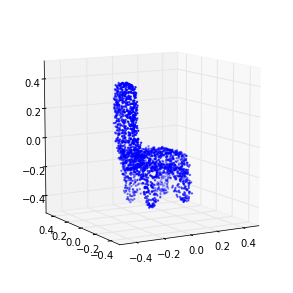

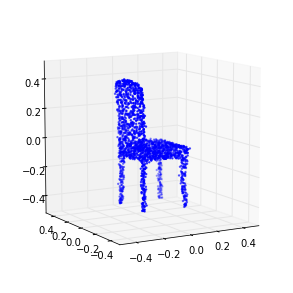

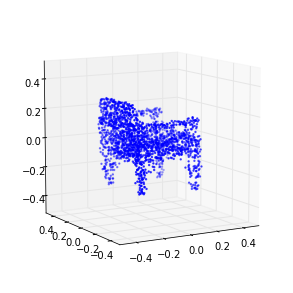

781 (-0.18308052530995123, 0.24297869039906395)
782 (-0.18475429625422865, 0.24374857324141044)
783 (-0.18547808163695864, 0.23565298870757775)
784 (-0.18156973785824246, 0.23763757392212195)
785 (-0.18425301854257231, 0.24296266447614739)
786 (-0.18325721047542715, 0.2353013246147721)
787 (-0.18466611118228346, 0.24517675130455582)
788 (-0.18456630497067064, 0.24289769872471137)
789 (-0.18348709405572325, 0.2441332251937301)
790 (-0.18375086685021719, 0.24078144353848915)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-790 is not in all_model_checkpoint_paths. Manually adding it.


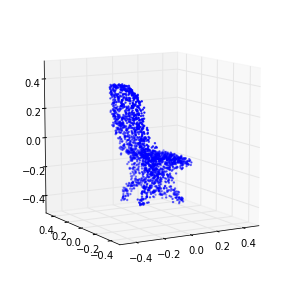

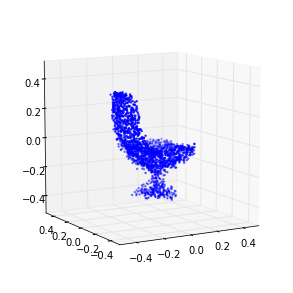

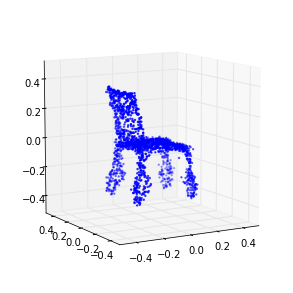

791 (-0.18331193427244821, 0.22833338931754785)
792 (-0.18340433328240005, 0.24856844489221219)
793 (-0.18208686974313523, 0.24708526609120546)
794 (-0.18376242893713493, 0.25552478598223793)
795 (-0.18335400499679425, 0.24810588359832764)
796 (-0.18520959130039921, 0.25347379015551674)
797 (-0.18407800970254121, 0.23977292908562553)
798 (-0.18430860230216273, 0.2506295519846457)
799 (-0.18334216398221476, 0.24521689006575831)
800 (-0.18463824314099772, 0.24724996089935303)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-800 is not in all_model_checkpoint_paths. Manually adding it.


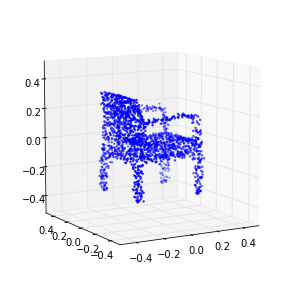

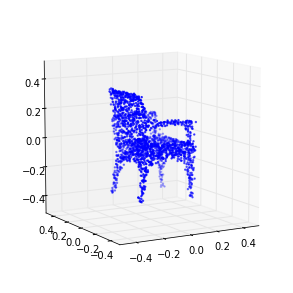

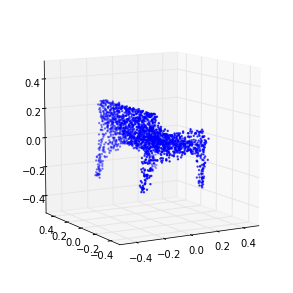

801 (-0.18517625133196514, 0.24567007411409308)
802 (-0.18372735977172852, 0.24797836442788443)
803 (-0.18303729991118114, 0.2504519306951099)
804 (-0.18337835548100648, 0.23982255547134965)
805 (-0.18375839568950511, 0.25653590924210018)
806 (-0.18312052929842915, 0.25629139498428061)
807 (-0.180373225443893, 0.2423214465379715)
808 (-0.18484813570976258, 0.24888997828518902)
809 (-0.18394386050877748, 0.24816449483235678)
810 (-0.18364557049892566, 0.248027503490448)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-810 is not in all_model_checkpoint_paths. Manually adding it.


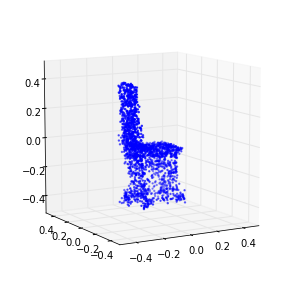

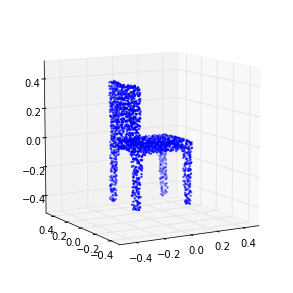

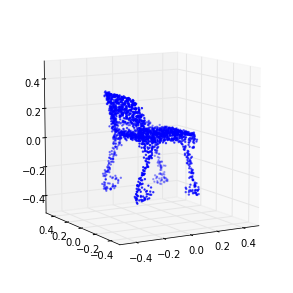

811 (-0.18282455768850114, 0.242938706168422)
812 (-0.18388642547307191, 0.2504259977075789)
813 (-0.18571971367906642, 0.25092550229143212)
814 (-0.18264243459260021, 0.24942160204604821)
815 (-0.1850159212394997, 0.25780860086282092)
816 (-0.18175558900391614, 0.24139502920486308)
817 (-0.18377265632152556, 0.257428718385873)
818 (-0.18372900541181916, 0.25537480413913727)
819 (-0.18495218544094652, 0.24885925981733534)
820 (-0.18422660717257747, 0.25223859040825453)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-820 is not in all_model_checkpoint_paths. Manually adding it.


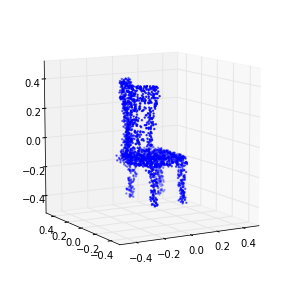

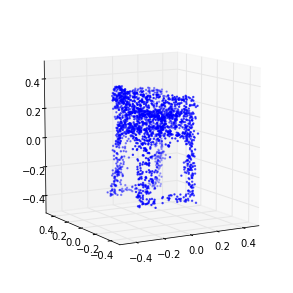

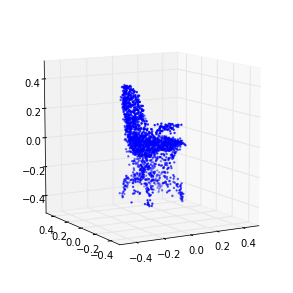

821 (-0.18315473717671854, 0.26502915609765937)
822 (-0.18488164974583521, 0.25827518436643815)
823 (-0.18505198944497991, 0.25603605199743201)
824 (-0.18528831457650219, 0.24319218651012139)
825 (-0.18322771875946611, 0.2579454498158561)
826 (-0.18337283057195169, 0.26086593005392289)
827 (-0.18406745129161411, 0.25232661487879576)
828 (-0.18381300215367918, 0.26015547635378661)
829 (-0.18203231405328821, 0.2436322972730354)
830 (-0.18409364974057232, 0.24796993257822814)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-830 is not in all_model_checkpoint_paths. Manually adding it.


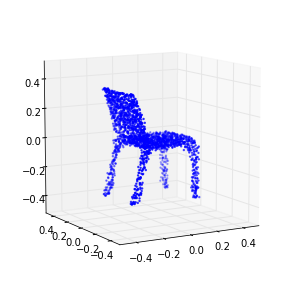

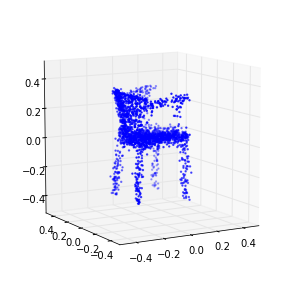

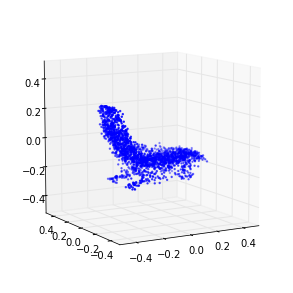

831 (-0.18538833580635211, 0.25706267025735641)
832 (-0.18261932852091611, 0.25712426889825751)
833 (-0.18335572790216517, 0.24846614510924728)
834 (-0.18435044487317404, 0.2515465545433539)
835 (-0.18309037464636344, 0.25499148722048159)
836 (-0.18172827550658474, 0.25521708252253356)
837 (-0.18345061408148872, 0.25858229122779985)
838 (-0.18473747505082025, 0.26554422632411673)
839 (-0.18555055646984667, 0.24798359197598915)
840 (-0.182453105074388, 0.24858363469441733)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-840 is not in all_model_checkpoint_paths. Manually adding it.


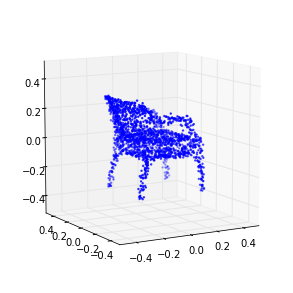

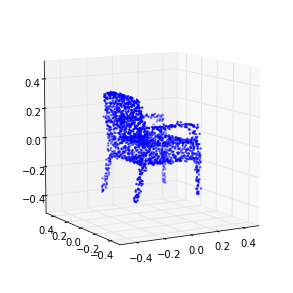

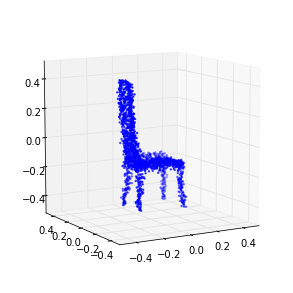

841 (-0.18352984057532418, 0.25444836417833966)
842 (-0.18296611176596747, 0.25270133106796827)
843 (-0.18500829648088526, 0.25271037828039239)
844 (-0.18234231516166968, 0.24919099553867621)
845 (-0.18267520798577203, 0.25122854996610572)
846 (-0.18429261744022368, 0.25516005412296011)
847 (-0.1817387456143344, 0.26153633936687753)
848 (-0.18458259342997163, 0.26350178873097457)
849 (-0.18437787018440388, 0.25896736979484558)
850 (-0.18421893390240493, 0.25282221977357511)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-850 is not in all_model_checkpoint_paths. Manually adding it.


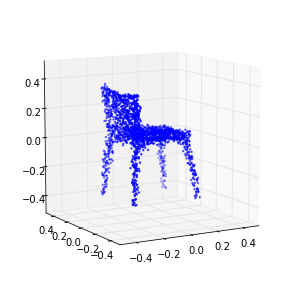

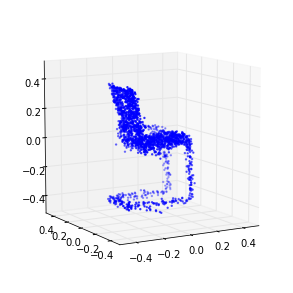

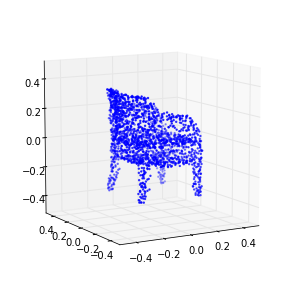

851 (-0.18276699935948407, 0.2577611290746265)
852 (-0.18430234591166178, 0.26761640442742241)
853 (-0.183443315382357, 0.26202538388746754)
854 (-0.18384751313262515, 0.25255488521522945)
855 (-0.18428081274032593, 0.26299213700824314)
856 (-0.18174626054587187, 0.26572191384103561)
857 (-0.18367750721949119, 0.25783649859605012)
858 (-0.18384194605880314, 0.26079441165482559)
859 (-0.18466664370563296, 0.26015528319058595)
860 (-0.18641054862075382, 0.25834005022490464)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-860 is not in all_model_checkpoint_paths. Manually adding it.


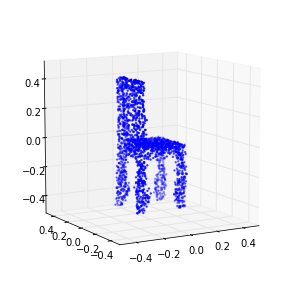

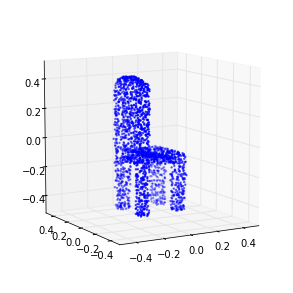

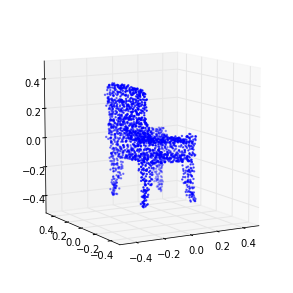

861 (-0.18342295973389236, 0.25736199043415209)
862 (-0.18391570614443886, 0.26686075660917496)
863 (-0.18298574901289411, 0.25973449150721234)
864 (-0.18310760358969372, 0.25648467739423114)
865 (-0.18484025961822934, 0.26339657825452312)
866 (-0.18405832846959433, 0.26521654537430517)
867 (-0.18363965440679481, 0.26063693232006496)
868 (-0.18266071390222621, 0.26191846253695311)
869 (-0.18314475212936049, 0.26382490882167109)
870 (-0.18318927166638552, 0.2634811638681977)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-870 is not in all_model_checkpoint_paths. Manually adding it.


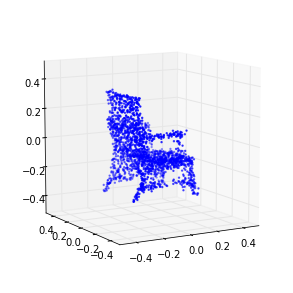

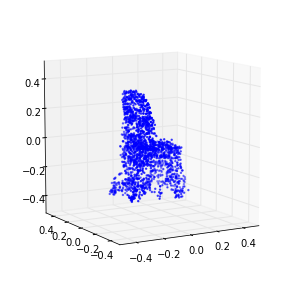

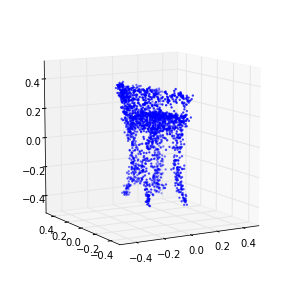

871 (-0.18549331680492118, 0.2645314744225255)
872 (-0.18460184617174996, 0.26831593612829846)
873 (-0.18448364017186342, 0.2682618300120036)
874 (-0.182923596545502, 0.26879287097189164)
875 (-0.18244383081241891, 0.26753931851298723)
876 (-0.18748164927517927, 0.26390166635866519)
877 (-0.18243899124640006, 0.26799825275385819)
878 (-0.18504145288908924, 0.25890080465210807)
879 (-0.18475608284826631, 0.26373627064404664)
880 (-0.18338288775196782, 0.27021788778128447)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-880 is not in all_model_checkpoint_paths. Manually adding it.


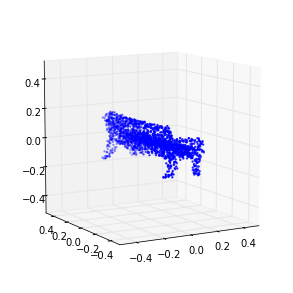

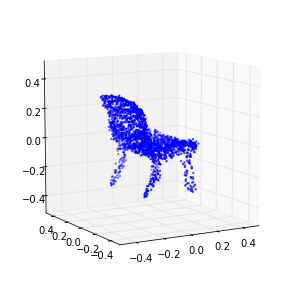

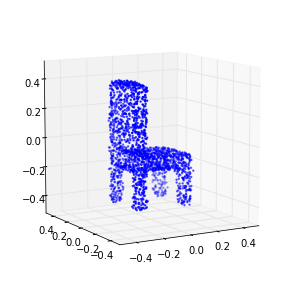

881 (-0.18534332933249298, 0.26959050198396045)
882 (-0.18284647431638507, 0.26917799479431576)
883 (-0.18497900300555759, 0.27514110284822957)
884 (-0.18362221309432278, 0.2690103578346747)
885 (-0.18288859438013147, 0.2687494224972195)
886 (-0.18148768500045495, 0.26467083118580004)
887 (-0.18672977409980915, 0.26511997867513587)
888 (-0.18506012294027541, 0.2679118271227236)
889 (-0.1856672743956248, 0.26234405460181059)
890 (-0.18320205597965805, 0.26278228561083478)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-890 is not in all_model_checkpoint_paths. Manually adding it.


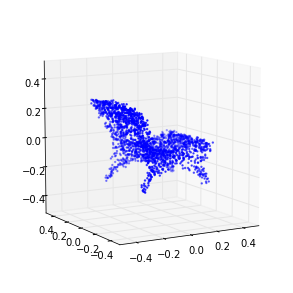

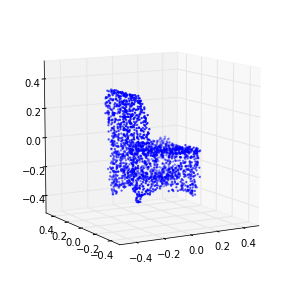

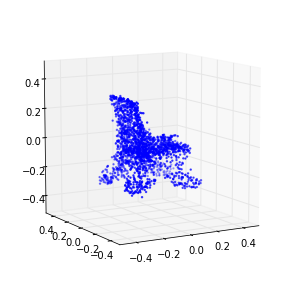

891 (-0.18454994912500736, 0.27348346511522931)
892 (-0.18363568517896864, 0.26250292857487995)
893 (-0.18653907466817785, 0.26736918809237303)
894 (-0.18584806974287385, 0.26517513559924233)
895 (-0.18417135626077652, 0.26796344695267854)
896 (-0.18357455244770757, 0.26444006297323441)
897 (-0.18528271957680031, 0.27222857265560713)
898 (-0.18223007641456745, 0.26641237073474461)
899 (-0.18492334374675043, 0.26597392338293568)
900 (-0.18525489943998832, 0.26987942832487599)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-900 is not in all_model_checkpoint_paths. Manually adding it.


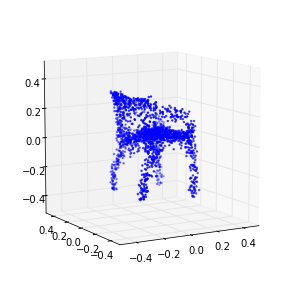

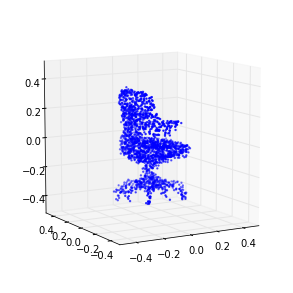

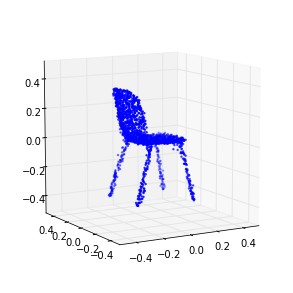

901 (-0.18361178570323519, 0.26644660090958633)
902 (-0.18226975677190005, 0.27327093978722888)
903 (-0.18415808975696563, 0.27928940675876757)
904 (-0.18500812881522707, 0.27088601666468159)
905 (-0.1838104185130861, 0.27123713879673567)
906 (-0.18255632872934693, 0.27558159717807063)
907 (-0.1840189939295804, 0.2682275336097788)
908 (-0.18421971555109376, 0.26991245868029418)
909 (-0.18288263225996937, 0.27328896025816601)
910 (-0.18257020601519833, 0.27475877161379214)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-910 is not in all_model_checkpoint_paths. Manually adding it.


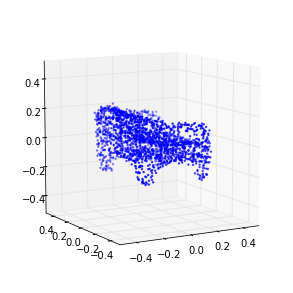

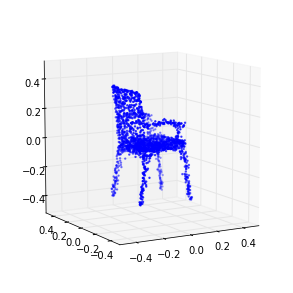

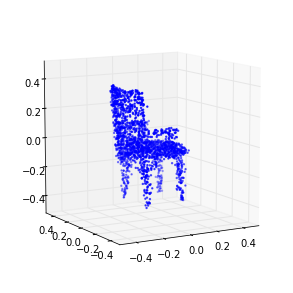

911 (-0.18362789501746496, 0.26860352191660142)
912 (-0.18493458507237612, 0.25994240023471693)
913 (-0.18445049182132439, 0.26980396498132636)
914 (-0.18478196406805958, 0.27649177500495203)
915 (-0.18446328474415674, 0.2839765085114373)
916 (-0.18402340290723024, 0.27691577982019494)
917 (-0.18458669770646979, 0.2725353765266913)
918 (-0.18279079430633122, 0.27157722855055771)
919 (-0.18338272141085732, 0.27016804450088078)
920 (-0.18142213418527886, 0.27284295691384208)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-920 is not in all_model_checkpoint_paths. Manually adding it.


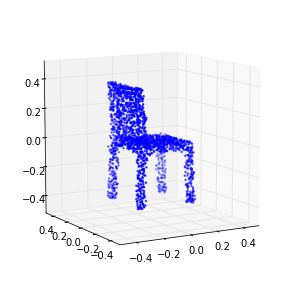

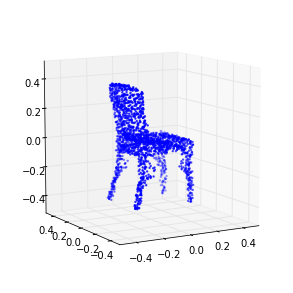

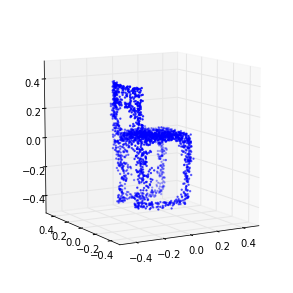

921 (-0.18416454361544715, 0.27867033194612573)
922 (-0.18514444220949103, 0.28134225253705625)
923 (-0.18398094668432519, 0.26836182011498344)
924 (-0.18215884064082746, 0.27294291942207899)
925 (-0.18381146093209585, 0.267539096099359)
926 (-0.18427667231471451, 0.27332315455984185)
927 (-0.18249946164864081, 0.27549553303806867)
928 (-0.18485349769945497, 0.27390866036768313)
929 (-0.18480904323083383, 0.27421999695124449)
930 (-0.18486463968400602, 0.26932384736008114)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-930 is not in all_model_checkpoint_paths. Manually adding it.


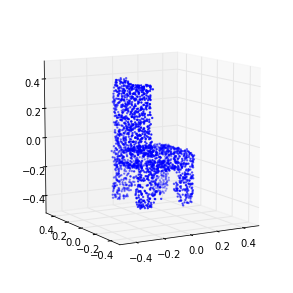

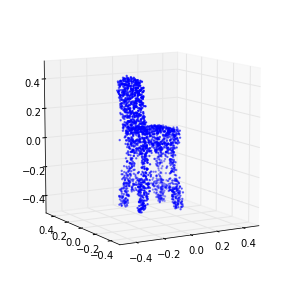

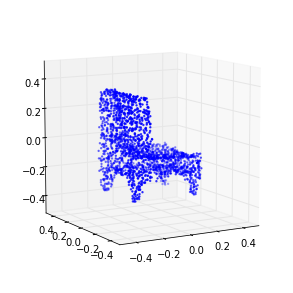

931 (-0.18262553634466949, 0.26931021445327336)
932 (-0.18631774098784834, 0.28112692689454116)
933 (-0.1843171070019404, 0.27575207915570998)
934 (-0.18461909398988441, 0.27819318131164267)
935 (-0.18250434144779487, 0.28346141400160613)
936 (-0.181853394596665, 0.26474466533572588)
937 (-0.18571968509091272, 0.26737506301314745)
938 (-0.18463942309220632, 0.26924573988826189)
939 (-0.18562089094409237, 0.27467722914837023)
940 (-0.18495533918892895, 0.27158664166927338)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-940 is not in all_model_checkpoint_paths. Manually adding it.


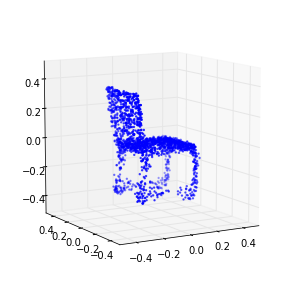

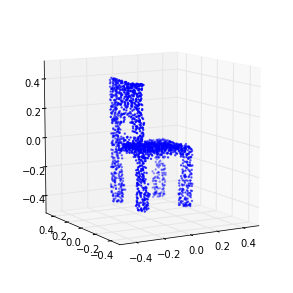

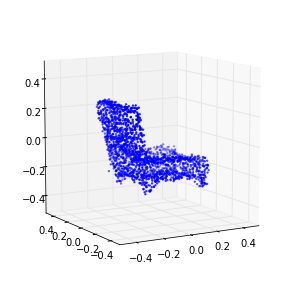

941 (-0.18459881312317319, 0.27246421630735751)
942 (-0.18335152687849821, 0.26775739535137461)
943 (-0.18296435795448446, 0.27150495902255728)
944 (-0.18509270537782599, 0.2749831058360912)
945 (-0.18541292603369111, 0.27961852263521264)
946 (-0.18290933171908061, 0.27637723640159323)
947 (-0.18441115926813195, 0.27190955700697722)
948 (-0.18405092369627069, 0.28026462815426012)
949 (-0.18435401386684841, 0.26824343204498291)
950 (-0.186661974368272, 0.27972960306538475)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-950 is not in all_model_checkpoint_paths. Manually adding it.


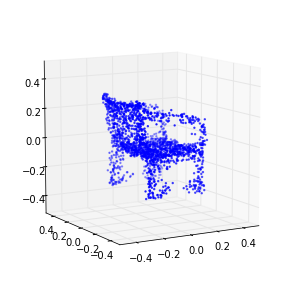

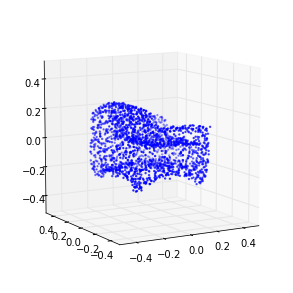

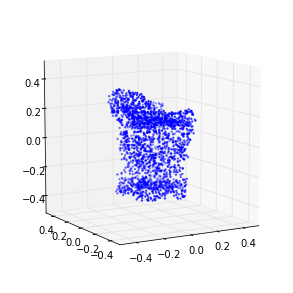

951 (-0.18283906854965068, 0.27458717204906324)
952 (-0.18438489569558036, 0.27727656397554612)
953 (-0.18335674912841232, 0.27835022409756977)
954 (-0.18306645165990901, 0.27376391490300495)
955 (-0.18608745557290537, 0.27240476453745804)
956 (-0.18491220584622137, 0.2803514693622236)
957 (-0.18442887443083303, 0.2801745931307475)
958 (-0.18178562643351379, 0.26762043270799851)
959 (-0.18559281627337137, 0.27280474316190789)
960 (-0.18368920948770312, 0.274808786533497)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-960 is not in all_model_checkpoint_paths. Manually adding it.


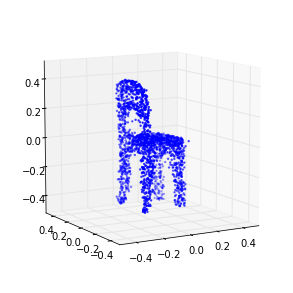

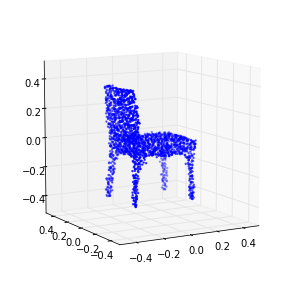

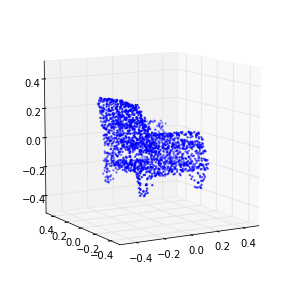

961 (-0.18491387654233862, 0.28000392847590977)
962 (-0.18527645314181293, 0.27744513750076294)
963 (-0.1840590524452704, 0.28283118097870436)
964 (-0.18199389731442486, 0.27571976515981889)
965 (-0.18560257178765757, 0.27163337226267215)
966 (-0.18388356422936475, 0.28362628817558289)
967 (-0.18354376201276426, 0.27523745099703473)
968 (-0.18515787676528647, 0.27970140399756255)
969 (-0.1846210937809061, 0.2890624243904043)
970 (-0.18607603659232458, 0.27152480847305721)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-970 is not in all_model_checkpoint_paths. Manually adding it.


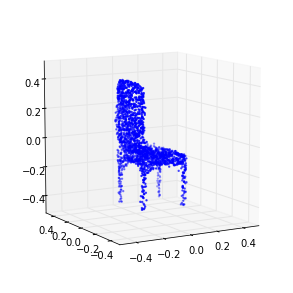

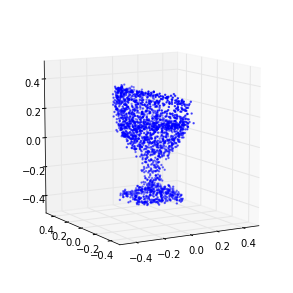

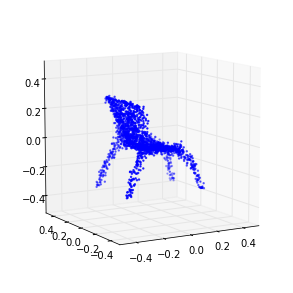

971 (-0.18390162863113263, 0.27442228021445098)
972 (-0.18440305347795841, 0.28214892855396978)
973 (-0.1845744514906848, 0.27450017465485466)
974 (-0.18509144109708292, 0.27683216995663112)
975 (-0.18354278968440163, 0.27508690677307268)
976 (-0.18414503672608623, 0.26931555955498304)
977 (-0.18740345923988908, 0.28863209706765636)
978 (-0.18446697383015245, 0.26701833418122045)
979 (-0.18668401771121554, 0.2867125316902443)
980 (-0.18433599427894309, 0.27200143811879335)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-980 is not in all_model_checkpoint_paths. Manually adding it.


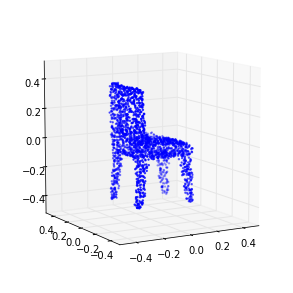

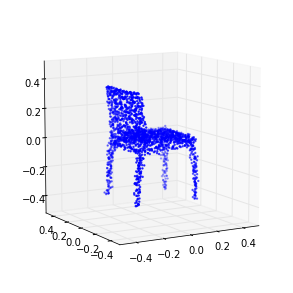

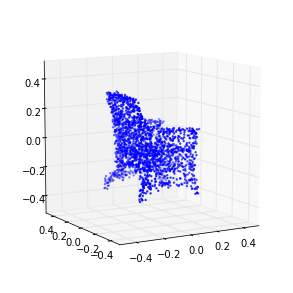

981 (-0.18359434074825712, 0.2878731941735303)
982 (-0.1855570196001618, 0.27336842980649734)
983 (-0.18525075139822783, 0.27772382067309487)
984 (-0.18505817971847677, 0.27877991894880932)
985 (-0.18383939398659599, 0.28417045485090325)
986 (-0.18240084305957513, 0.28427014969013353)
987 (-0.18449786526185494, 0.28865358399020302)
988 (-0.18496143277044649, 0.28188620121390734)
989 (-0.18473438896514752, 0.27628163275895296)
990 (-0.18303445566583562, 0.2797144485844506)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-990 is not in all_model_checkpoint_paths. Manually adding it.


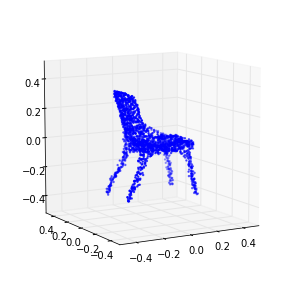

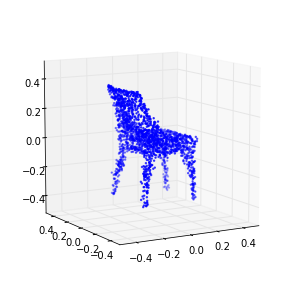

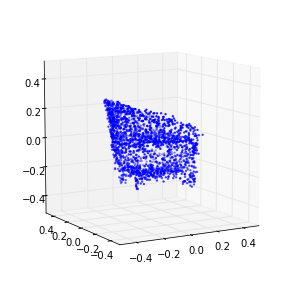

991 (-0.18562925049552212, 0.2800392773416307)
992 (-0.18525775019769317, 0.28328361665761032)
993 (-0.18363284601105584, 0.28062960450296048)
994 (-0.18533270171395055, 0.27860273089673782)
995 (-0.1838194317287869, 0.27323802036267741)
996 (-0.18318779490612172, 0.27743224247738169)
997 (-0.18309447379023941, 0.27419397124537714)
998 (-0.18437041529902706, 0.27895395181797167)
999 (-0.18402245806323159, 0.26500566966003841)
1000 (-0.18405514756838481, 0.27765958563045218)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1000 is not in all_model_checkpoint_paths. Manually adding it.


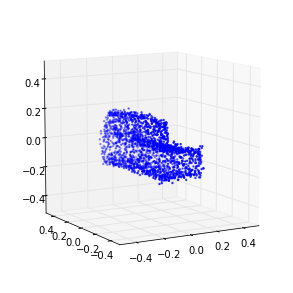

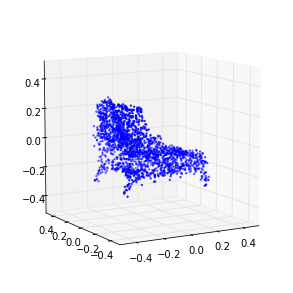

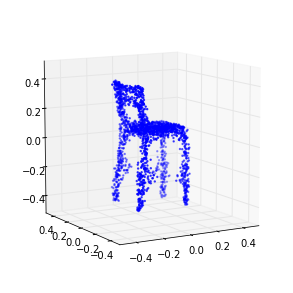

1001 (-0.18395067100171689, 0.29191889696651036)
1002 (-0.18498278933542747, 0.2775411241584354)
1003 (-0.18474138588817032, 0.27487541128087928)
1004 (-0.1849247403718807, 0.27805213906146864)
1005 (-0.18370274206002554, 0.2915076094645041)
1006 (-0.18461277738765433, 0.28203950436026964)
1007 (-0.18517654609900933, 0.28585749533441329)
1008 (-0.1846907686856058, 0.28273650341563755)
1009 (-0.18337162578547442, 0.27544081652605973)
1010 (-0.18520746529102325, 0.27087580219463064)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1010 is not in all_model_checkpoint_paths. Manually adding it.


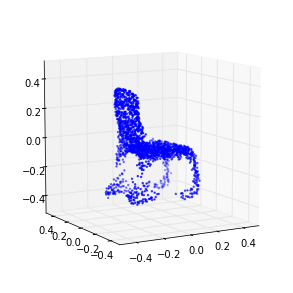

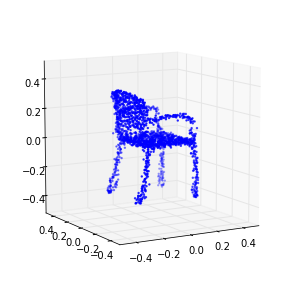

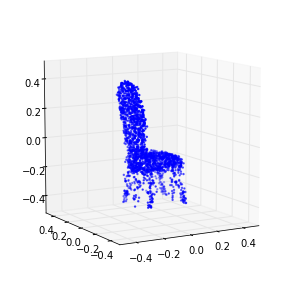

1011 (-0.18392252337049556, 0.27863061428070068)
1012 (-0.18621869881947836, 0.28675956417013099)
1013 (-0.18258026429900417, 0.27456296097349236)
1014 (-0.18673279958742636, 0.27974054493285994)
1015 (-0.18479413246666943, 0.27708100499930205)
1016 (-0.18563540815203278, 0.27620361248652142)
1017 (-0.18572063026604829, 0.27268541963012133)
1018 (-0.18429551974490838, 0.2760649041997062)
1019 (-0.18587101344709042, 0.27225895060433281)
1020 (-0.18465075862628441, 0.27905683164243344)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1020 is not in all_model_checkpoint_paths. Manually adding it.


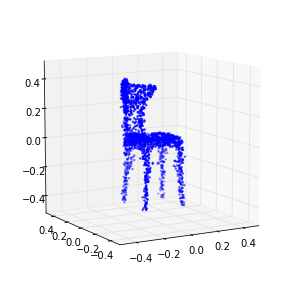

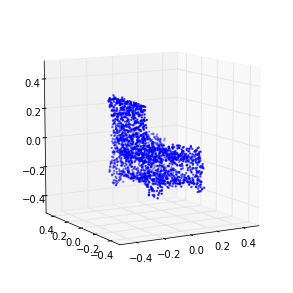

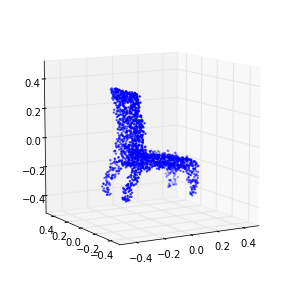

1021 (-0.18535904674618334, 0.28199526115700052)
1022 (-0.18536669545703463, 0.28020798332161373)
1023 (-0.18513710090407617, 0.27825302934205093)
1024 (-0.18392213914129468, 0.28359019425180221)
1025 (-0.18583928810225592, 0.27525728885774259)
1026 (-0.18504584464761947, 0.28430785625069227)
1027 (-0.18516141441133288, 0.28442913073080556)
1028 (-0.18455501916231931, 0.29056123782087256)
1029 (-0.18468068341414134, 0.29103639280354537)
1030 (-0.18416978562319719, 0.28643038979283086)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1030 is not in all_model_checkpoint_paths. Manually adding it.


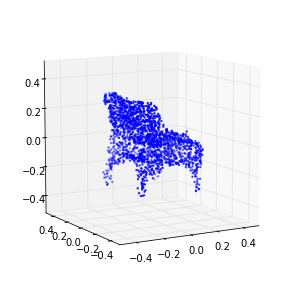

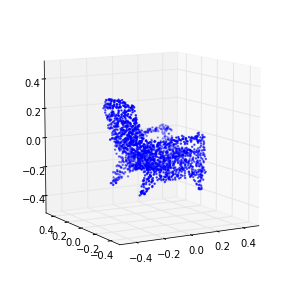

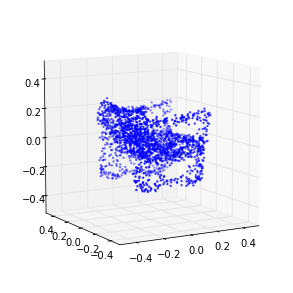

1031 (-0.18473513336093336, 0.28775516814655727)
1032 (-0.18450257745054033, 0.27881998706746985)
1033 (-0.18521748262423057, 0.27945748523429587)
1034 (-0.18442913183459528, 0.27781402071317035)
1035 (-0.1827994007755209, 0.28252095646328396)
1036 (-0.18609426065727516, 0.27687697057370786)
1037 (-0.18501912046361851, 0.29001708494292366)
1038 (-0.18537523591959917, 0.28460378337789466)
1039 (-0.18502533082608824, 0.28672816797539041)
1040 (-0.18549147645632427, 0.28274803636250673)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1040 is not in all_model_checkpoint_paths. Manually adding it.


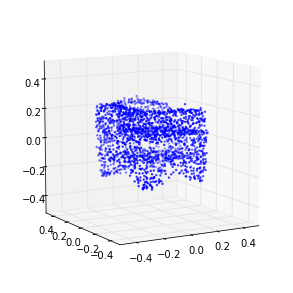

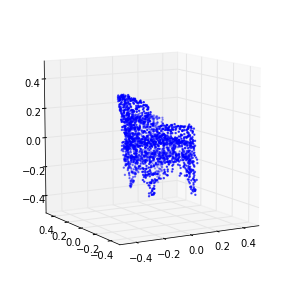

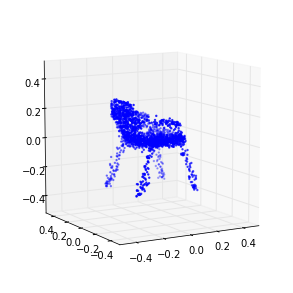

1041 (-0.18458734441686558, 0.27821545523625835)
1042 (-0.18454852744385047, 0.27923532658153111)
1043 (-0.18564997580316331, 0.29328688427254007)
1044 (-0.18594002226988474, 0.28215798570050132)
1045 (-0.18554738837259788, 0.28570551839139724)
1046 (-0.18408904671669007, 0.29675568805800545)
1047 (-0.1868223225628888, 0.27965464636131571)
1048 (-0.18559435296941687, 0.28741221626599628)
1049 (-0.18521270906483686, 0.2890850912641596)
1050 (-0.1858711377338127, 0.28673556005513229)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1050 is not in all_model_checkpoint_paths. Manually adding it.


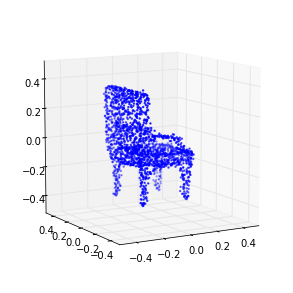

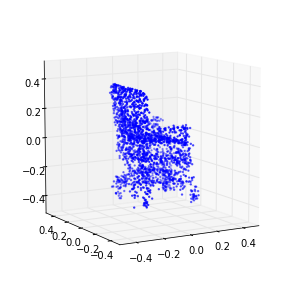

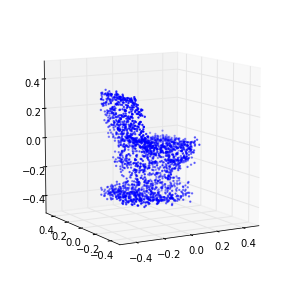

1051 (-0.18589470353391435, 0.28424392806159127)
1052 (-0.18708990094838318, 0.28790452524467752)
1053 (-0.18771228580563157, 0.27947494387626648)
1054 (-0.18462142160645237, 0.28392763822167005)
1055 (-0.18358676632245383, 0.2899312001687509)
1056 (-0.18586302675582744, 0.28852716750568813)
1057 (-0.18497049786426403, 0.29347790280977887)
1058 (-0.18299112518628438, 0.28402266458228781)
1059 (-0.18392921752399868, 0.29002071089214748)
1060 (-0.18595746976357919, 0.29085530285482053)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1060 is not in all_model_checkpoint_paths. Manually adding it.


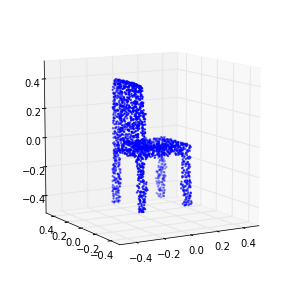

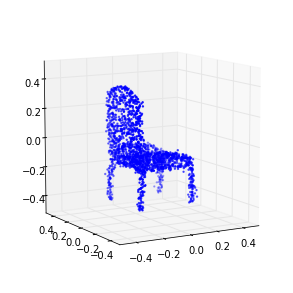

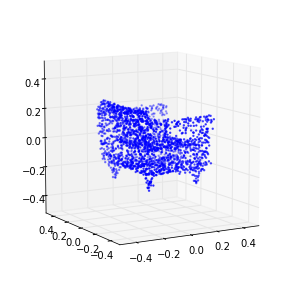

1061 (-0.18662117697574473, 0.29406871729426914)
1062 (-0.18451969275871913, 0.28545722365379333)
1063 (-0.18575516387268348, 0.28592868645985919)
1064 (-0.18398112776102843, 0.29025019981242994)
1065 (-0.18580836742012588, 0.29347899335402028)
1066 (-0.18466866778002844, 0.27943487906897507)
1067 (-0.18494161245999513, 0.29010851957179884)
1068 (-0.18478872014416589, 0.28317962421311271)
1069 (-0.18615606040866287, 0.28246957284432872)
1070 (-0.18597160577774047, 0.28178349026927241)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1070 is not in all_model_checkpoint_paths. Manually adding it.


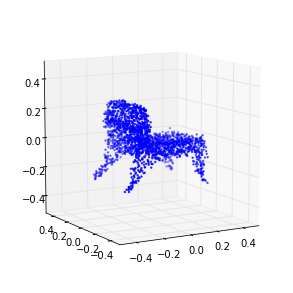

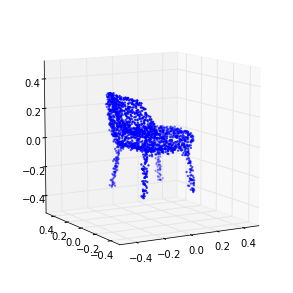

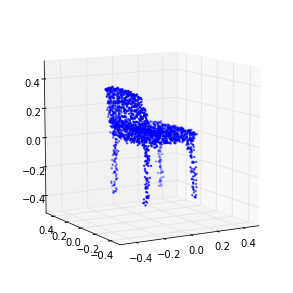

1071 (-0.18584357511114191, 0.27932728882189151)
1072 (-0.18721887425140099, 0.28553423947758144)
1073 (-0.18702234614778449, 0.28378299540943569)
1074 (-0.18672782690436751, 0.29139178218664946)
1075 (-0.18516782334557286, 0.28434619638654923)
1076 (-0.18650977810223898, 0.28448320207772432)
1077 (-0.18527860917426922, 0.29082020013420667)
1078 (-0.18559902486977753, 0.28420745333035785)
1079 (-0.18647310027369746, 0.29334439723579969)
1080 (-0.18505626972074862, 0.28369814543812361)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1080 is not in all_model_checkpoint_paths. Manually adding it.


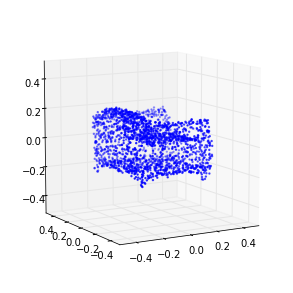

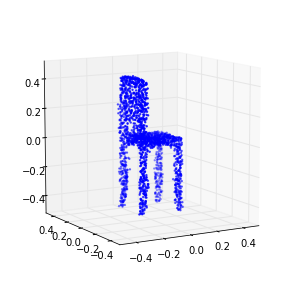

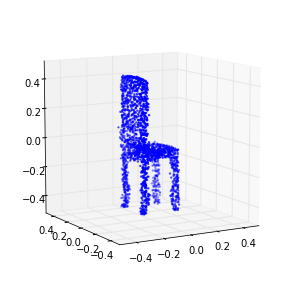

1081 (-0.18740442759460874, 0.29418100471849795)
1082 (-0.18736863301859963, 0.28393586476643878)
1083 (-0.18597599543907023, 0.29402521473390086)
1084 (-0.18574532899591659, 0.29662897299837182)
1085 (-0.18445202642016942, 0.29334807175177113)
1086 (-0.18593240236794506, 0.27915214112511388)
1087 (-0.18592481436552824, 0.28289323603665389)
1088 (-0.18738309531300157, 0.29644811263790838)
1089 (-0.18682274487283496, 0.29270491776642976)
1090 (-0.18625056048234304, 0.29654703206486172)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1090 is not in all_model_checkpoint_paths. Manually adding it.


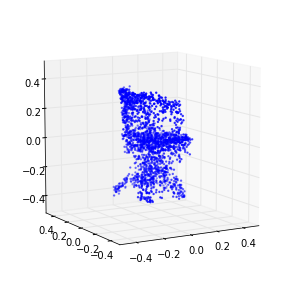

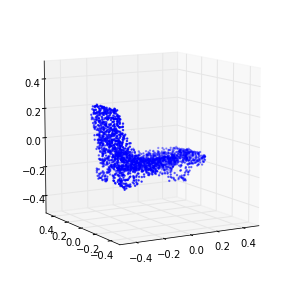

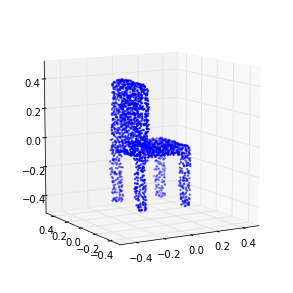

1091 (-0.18637701085320227, 0.29692268923476889)
1092 (-0.18794805551016772, 0.29156757725609672)
1093 (-0.18800003959072961, 0.28741658285812094)
1094 (-0.18558991584512924, 0.28533597787221271)
1095 (-0.18719836672147114, 0.28533843270054571)
1096 (-0.18505974654798155, 0.29924454402040551)
1097 (-0.18562957136719316, 0.28505533712881581)
1098 (-0.18628733036694703, 0.28066351347499424)
1099 (-0.18569322184280113, 0.29414612606719687)
1100 (-0.18394571829725195, 0.29451957896903708)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1100 is not in all_model_checkpoint_paths. Manually adding it.


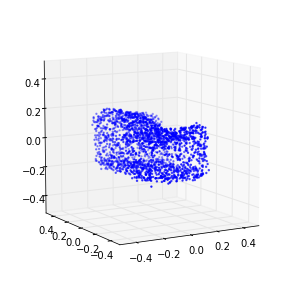

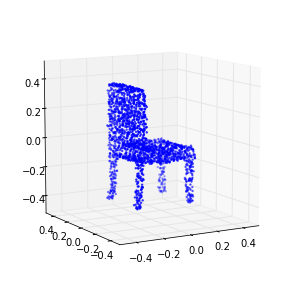

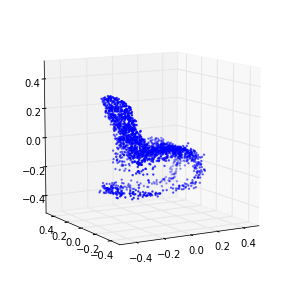

1101 (-0.18484480667997288, 0.28649642456460883)
1102 (-0.18363659900647622, 0.29030976472077547)
1103 (-0.18688924367781037, 0.29800452236775998)
1104 (-0.18527821633550856, 0.28277409407827592)
1105 (-0.18583240509033203, 0.28662382562955219)
1106 (-0.18537955206853371, 0.28205151579998156)
1107 (-0.18620477705090135, 0.29302519670239202)
1108 (-0.18519493186915362, 0.30425446232159931)
1109 (-0.18647896139710038, 0.28503718144363827)
1110 (-0.18544421240135475, 0.28793897341798852)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1110 is not in all_model_checkpoint_paths. Manually adding it.


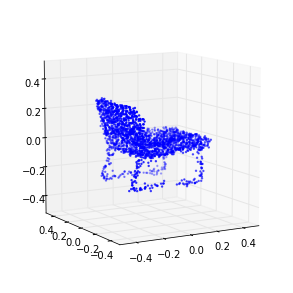

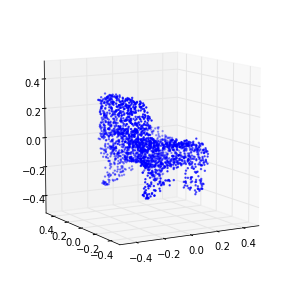

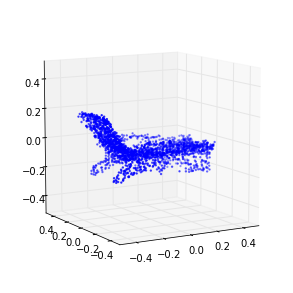

1111 (-0.18665901400424817, 0.28714786304367912)
1112 (-0.18460514832426, 0.2990086453932303)
1113 (-0.18666326723716878, 0.28724754850069684)
1114 (-0.18543369516178412, 0.29045904455361543)
1115 (-0.18477629434179377, 0.28390235481438814)
1116 (-0.18512867799511662, 0.28982496371975652)
1117 (-0.1857702265183131, 0.29134114693712304)
1118 (-0.18521786078258798, 0.28627429957743045)
1119 (-0.18577370809184179, 0.28334764418778596)
1120 (-0.18387802061107422, 0.28823273601355376)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1120 is not in all_model_checkpoint_paths. Manually adding it.


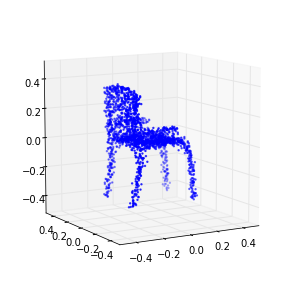

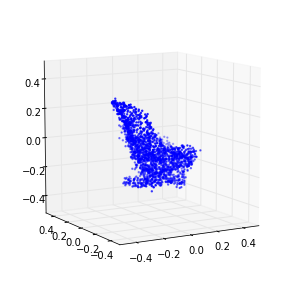

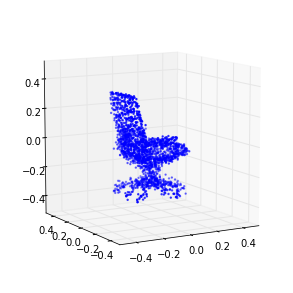

1121 (-0.1858225291525876, 0.29076398412386578)
1122 (-0.18602976534101698, 0.28862994467770614)
1123 (-0.18562137175489354, 0.28900043169657391)
1124 (-0.18510247976691635, 0.29297264968907394)
1125 (-0.18585549725426567, 0.28631831540001762)
1126 (-0.18537609775861105, 0.277766070984028)
1127 (-0.18576518142664875, 0.29386206909462259)
1128 (-0.18603991744694887, 0.28563607511696992)
1129 (-0.18550435437096491, 0.29650658148306386)
1130 (-0.18541109517768578, 0.29181691893824824)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1130 is not in all_model_checkpoint_paths. Manually adding it.


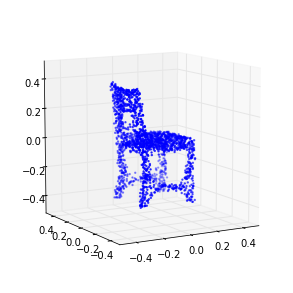

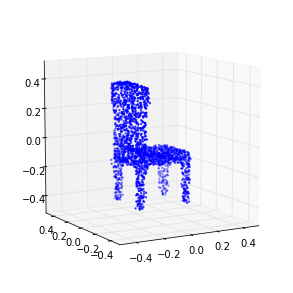

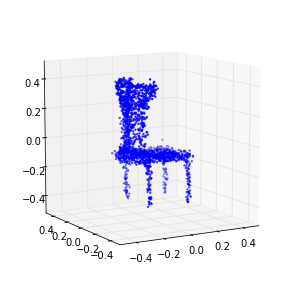

1131 (-0.18640400778364252, 0.2868559779944243)
1132 (-0.184565665324529, 0.2898095393622363)
1133 (-0.18398622141944038, 0.29357688625653583)
1134 (-0.18512056514068886, 0.29558786860218755)
1135 (-0.18570828813093679, 0.28696536907443293)
1136 (-0.18453654768290342, 0.29138191872172886)
1137 (-0.18711579982881194, 0.2919113172425164)
1138 (-0.18585183046482229, 0.29013482839972887)
1139 (-0.18522313965691461, 0.28574815613252147)
1140 (-0.18477443898165669, 0.29150988658269245)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1140 is not in all_model_checkpoint_paths. Manually adding it.


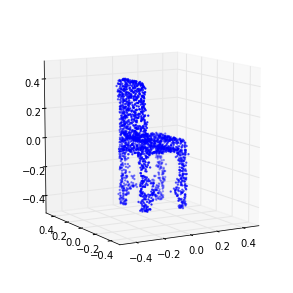

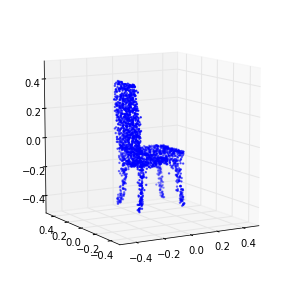

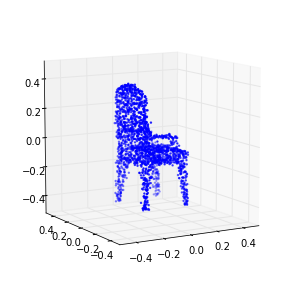

1141 (-0.18606343280386042, 0.28502537144554985)
1142 (-0.18656518249600021, 0.27902400272863881)
1143 (-0.1873180737098058, 0.28250188739211474)
1144 (-0.18674196777520358, 0.28819720723010878)
1145 (-0.18511752668354248, 0.28732087545924717)
1146 (-0.18654467905009234, 0.29364567553555526)
1147 (-0.18738184979668371, 0.28628613772215666)
1148 (-0.18556803531116908, 0.28472464724823282)
1149 (-0.18768966529104444, 0.28787553751910172)
1150 (-0.1844482817031719, 0.28666191741272257)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1150 is not in all_model_checkpoint_paths. Manually adding it.


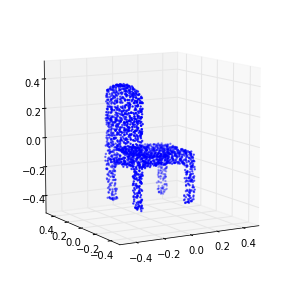

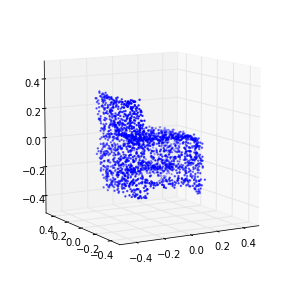

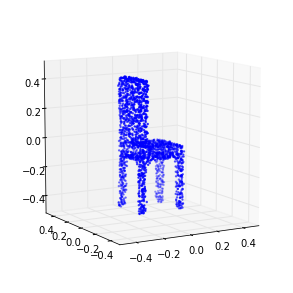

1151 (-0.18604234589470758, 0.29596338890216967)
1152 (-0.1866064997734847, 0.28455810966315093)
1153 (-0.1849323507812288, 0.28772714954835399)
1154 (-0.18608609360677225, 0.29509515894783866)
1155 (-0.18674612023212292, 0.28086459747067205)
1156 (-0.18574448470716123, 0.29263175748012682)
1157 (-0.18569136272977899, 0.2964272752956108)
1158 (-0.18647564130800742, 0.29296994761184408)
1159 (-0.1877679933000494, 0.29310457794754591)
1160 (-0.18483230311561513, 0.2866891214141139)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1160 is not in all_model_checkpoint_paths. Manually adding it.


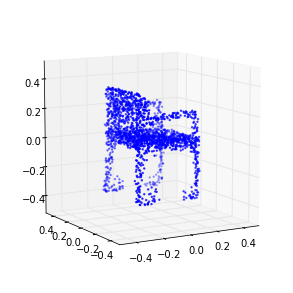

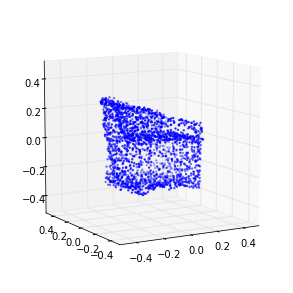

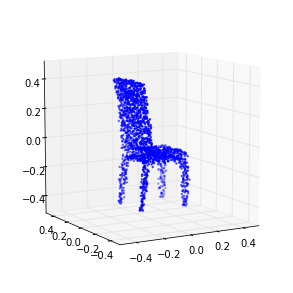

1161 (-0.18724079838505497, 0.28849339705926402)
1162 (-0.18476009832488166, 0.28469169029483088)
1163 (-0.18673441972997454, 0.28637639129603348)
1164 (-0.18598984777927399, 0.28435329265064663)
1165 (-0.185273784785359, 0.28417171924202528)
1166 (-0.18644429864706816, 0.29544526338577271)
1167 (-0.18588022126091852, 0.29627152504744353)
1168 (-0.18527196436016649, 0.29694233558796068)
1169 (-0.18608545705124183, 0.29330010877715218)
1170 (-0.18522460096412235, 0.29152816644421331)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1170 is not in all_model_checkpoint_paths. Manually adding it.


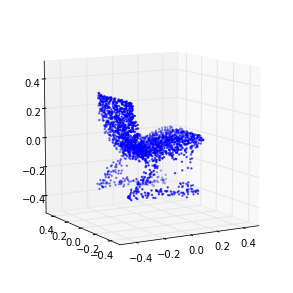

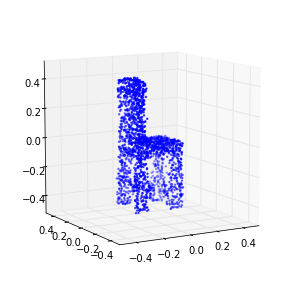

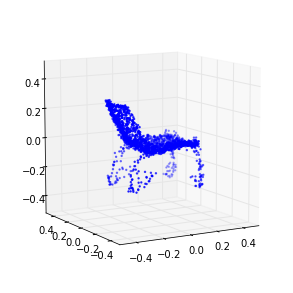

1171 (-0.18430507481098174, 0.28408763474888271)
1172 (-0.18626830191523941, 0.28666191630893284)
1173 (-0.18519359297222562, 0.28767965458057543)
1174 (-0.18475257555643718, 0.289014192642989)
1175 (-0.18308876708701805, 0.28910003878452162)
1176 (-0.18512552634433463, 0.2808390226629045)
1177 (-0.1866379761033588, 0.29258327351676094)
1178 (-0.18651672524434548, 0.28756677442126805)
1179 (-0.18431192172898186, 0.29136277128148963)
1180 (-0.18464497559600407, 0.29168914865564416)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1180 is not in all_model_checkpoint_paths. Manually adding it.


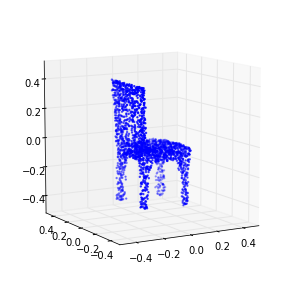

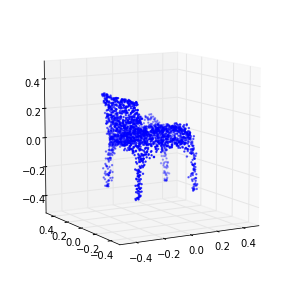

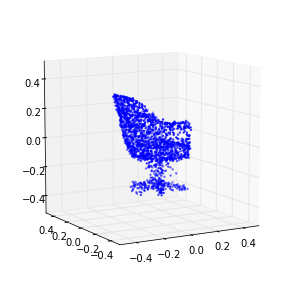

1181 (-0.18494601139315853, 0.29420564682395373)
1182 (-0.185497463522134, 0.2937901461565936)
1183 (-0.18599289269359023, 0.2920302285088433)
1184 (-0.1873033023542828, 0.29011079448240773)
1185 (-0.1858588504570502, 0.28769114447964561)
1186 (-0.18564478346595056, 0.29251907489917894)
1187 (-0.18402249504018714, 0.29148431287871468)
1188 (-0.18671388846856576, 0.29265731904241776)
1189 (-0.18617658681339688, 0.30272805580386408)
1190 (-0.18585157239878619, 0.29281223924071703)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1190 is not in all_model_checkpoint_paths. Manually adding it.


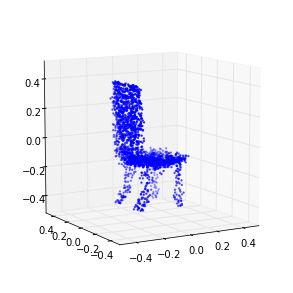

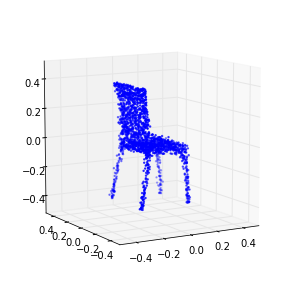

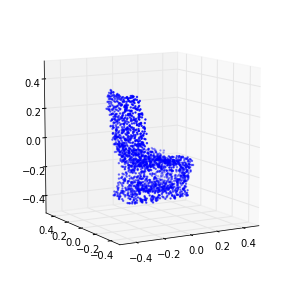

1191 (-0.18620430341473332, 0.29491531076254668)
1192 (-0.18546787577646751, 0.29975167579121059)
1193 (-0.1869518134329054, 0.29766834996364733)
1194 (-0.18543302173967716, 0.29319268906557999)
1195 (-0.18639959417007587, 0.28636523860472218)
1196 (-0.18560083872742122, 0.29199412796232438)
1197 (-0.18554993006918166, 0.29356892020614062)
1198 (-0.18618214858902826, 0.28747327349804064)
1199 (-0.18586811886893378, 0.30027100885355912)
1200 (-0.18553421541496559, 0.29490704006618923)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1200 is not in all_model_checkpoint_paths. Manually adding it.


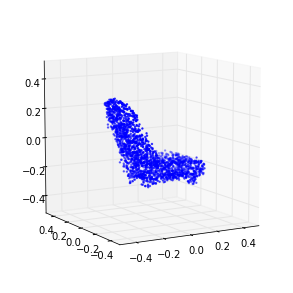

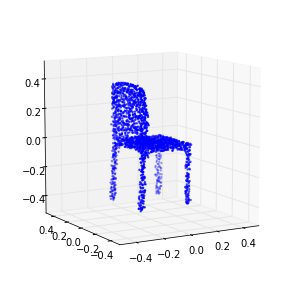

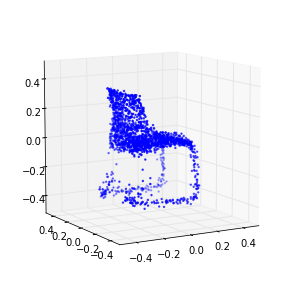

1201 (-0.18482872645060222, 0.2909780740737915)
1202 (-0.18567926585674285, 0.29845832122696769)
1203 (-0.18614979187647501, 0.29402212853784915)
1204 (-0.18318623171912299, 0.29451307875138744)
1205 (-0.1844964580403434, 0.29896360304620528)
1206 (-0.18614477868433352, 0.30069378128758184)
1207 (-0.18545248618832341, 0.28794259384826376)
1208 (-0.18564548393090566, 0.29945420004703382)
1209 (-0.18556470981350651, 0.2935886769383042)
1210 (-0.18487144780379755, 0.28928587392524435)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1210 is not in all_model_checkpoint_paths. Manually adding it.


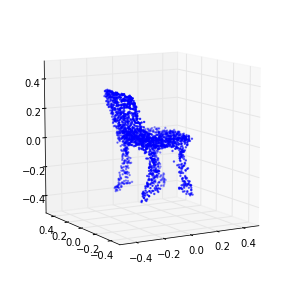

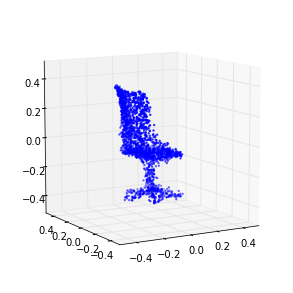

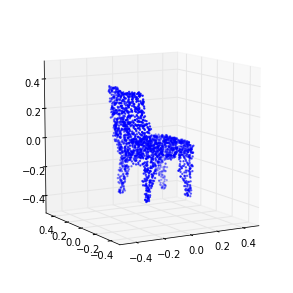

1211 (-0.18658929952868708, 0.30395327232502123)
1212 (-0.18952915536032783, 0.29836142725414699)
1213 (-0.18647843941494271, 0.28310892537788107)
1214 (-0.18548149554817764, 0.29249110045256438)
1215 (-0.1869145890076955, 0.2918089650295399)
1216 (-0.18452162466667316, 0.29404277713210497)
1217 (-0.18451086337919589, 0.298570450257372)
1218 (-0.18893155797764108, 0.29453856084081864)
1219 (-0.18604436483648087, 0.29318450998376916)
1220 (-0.18716270460022821, 0.30294146471553379)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1220 is not in all_model_checkpoint_paths. Manually adding it.


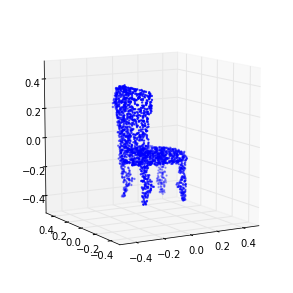

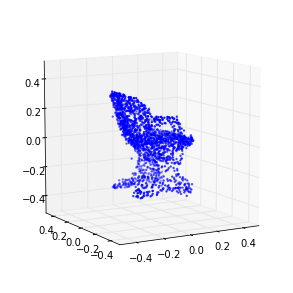

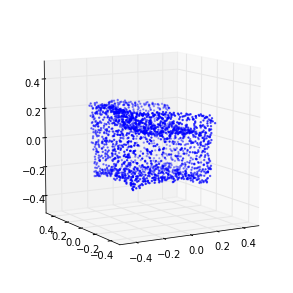

1221 (-0.18444481381663569, 0.28392692848488138)
1222 (-0.18450453954714316, 0.29300076321319296)
1223 (-0.18272150324450598, 0.29578321289133142)
1224 (-0.18546602725982667, 0.30197324024306404)
1225 (-0.18637236963819576, 0.29520013155760588)
1226 (-0.18431009098335549, 0.28947318262524074)
1227 (-0.18612069322003258, 0.29097120077521715)
1228 (-0.18557883677659212, 0.30058266277666446)
1229 (-0.1871369449076829, 0.28794669111569721)
1230 (-0.1865386403269238, 0.30296215635758861)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1230 is not in all_model_checkpoint_paths. Manually adding it.


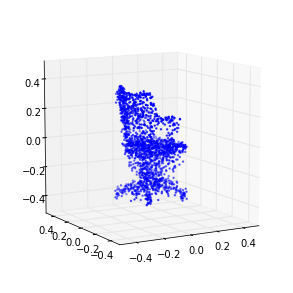

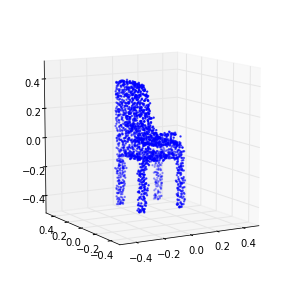

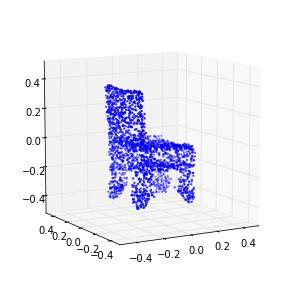

1231 (-0.1867646453557191, 0.29768537150488961)
1232 (-0.1856978522406684, 0.29002137647734749)
1233 (-0.18483783249501828, 0.29662269022729659)
1234 (-0.18780370178046049, 0.29285517555695995)
1235 (-0.18521237715526864, 0.29965623771702804)
1236 (-0.18591594099998474, 0.3018964915363877)
1237 (-0.18829061377931525, 0.29548410684974108)
1238 (-0.18642040325535669, 0.2904776930809021)
1239 (-0.18610589272446101, 0.29948113361994427)
1240 (-0.18470312379024648, 0.30101091331905788)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1240 is not in all_model_checkpoint_paths. Manually adding it.


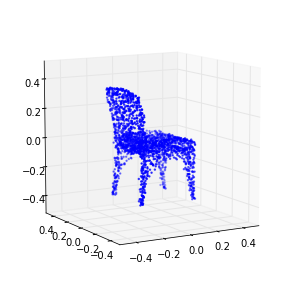

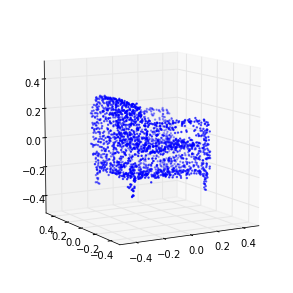

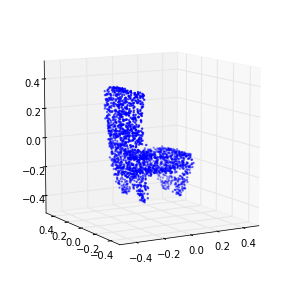

1241 (-0.18627354922118011, 0.2879208602287151)
1242 (-0.18674072479760206, 0.28351626241648636)
1243 (-0.18556531800164117, 0.29686697544874968)
1244 (-0.18556823046119125, 0.29777367633801921)
1245 (-0.18486329902101445, 0.29871909927438806)
1246 (-0.18536654026420027, 0.29556979956450286)
1247 (-0.18344910100654319, 0.29682440007174454)
1248 (-0.18737208589359566, 0.2906481656763289)
1249 (-0.18357473584236922, 0.29693546670454518)
1250 (-0.184333641771917, 0.29630617742185239)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1250 is not in all_model_checkpoint_paths. Manually adding it.


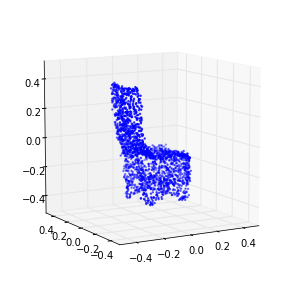

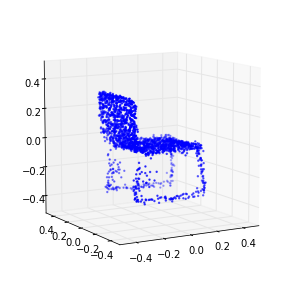

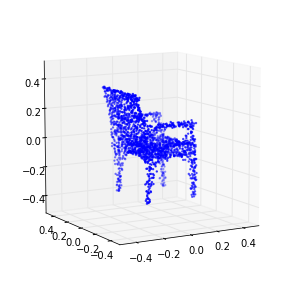

1251 (-0.18542264909655959, 0.29771563631516917)
1252 (-0.18604356988712592, 0.300523672942762)
1253 (-0.18552028437455495, 0.30251177593513773)
1254 (-0.18668754895528158, 0.29101901363443444)
1255 (-0.18525452150238886, 0.2911676212593361)
1256 (-0.18513629844895116, 0.29487524209199129)
1257 (-0.18583269925029189, 0.29662688793959441)
1258 (-0.18753770832662228, 0.28866822962407712)
1259 (-0.18681347833739387, 0.30075875918070477)
1260 (-0.1866295353130058, 0.29432495324699964)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1260 is not in all_model_checkpoint_paths. Manually adding it.


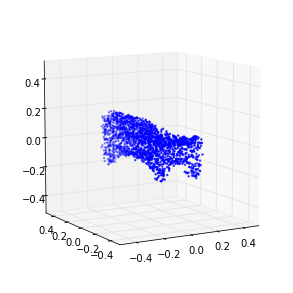

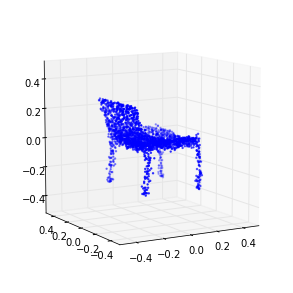

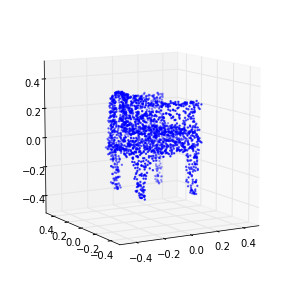

1261 (-0.18568601464783704, 0.2871822604426631)
1262 (-0.1854258950109835, 0.29190031356281704)
1263 (-0.18517446021238962, 0.29610636168056065)
1264 (-0.18626205567960386, 0.29092616063577159)
1265 (-0.18699521598992525, 0.29161141647232902)
1266 (-0.18649259871906704, 0.29672908231064127)
1267 (-0.18646402381084584, 0.29903455575307208)
1268 (-0.18367389506763881, 0.29433357274090804)
1269 (-0.18625647348386271, 0.3002023089815069)
1270 (-0.18833899983653316, 0.3003981290040193)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1270 is not in all_model_checkpoint_paths. Manually adding it.


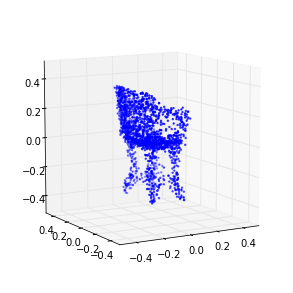

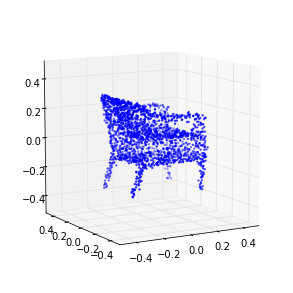

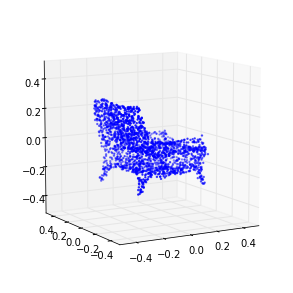

1271 (-0.18748107856070553, 0.2937089204788208)
1272 (-0.18559206944924814, 0.29966484286167006)
1273 (-0.18661808912400846, 0.28625955956953542)
1274 (-0.18717403886494813, 0.29104243053330314)
1275 (-0.18662029968367683, 0.28780679901440936)
1276 (-0.18516508947919916, 0.29969192765377184)
1277 (-0.18677411907249028, 0.29108522556446215)
1278 (-0.1863897654745314, 0.30369250310791862)
1279 (-0.18725949845932149, 0.28871946423142042)
1280 (-0.18634955761609254, 0.29154690437846714)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1280 is not in all_model_checkpoint_paths. Manually adding it.


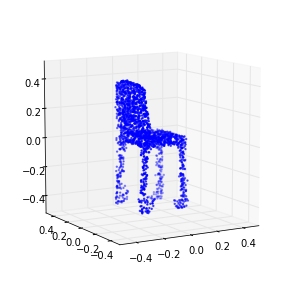

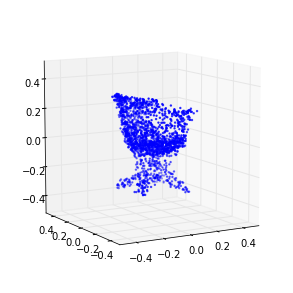

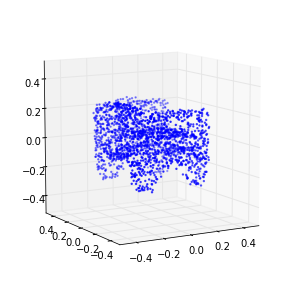

1281 (-0.18724656988073279, 0.29380830791261459)
1282 (-0.1854982719377235, 0.30278370667386939)
1283 (-0.1864940011942828, 0.29717136533172045)
1284 (-0.18750046613039795, 0.2898515518064852)
1285 (-0.18636631965637207, 0.29365844527880353)
1286 (-0.18527540398968589, 0.29492537180582684)
1287 (-0.18751861155033112, 0.29939366380373639)
1288 (-0.18787995786578568, 0.30465647357481496)
1289 (-0.18677937410495898, 0.29239225387573242)
1290 (-0.18653599564675932, 0.28946615038094697)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1290 is not in all_model_checkpoint_paths. Manually adding it.


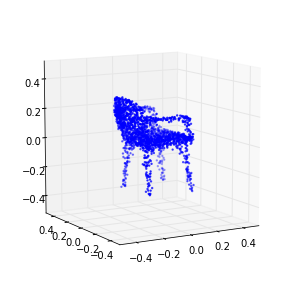

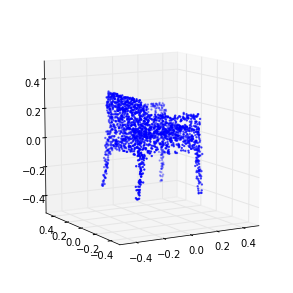

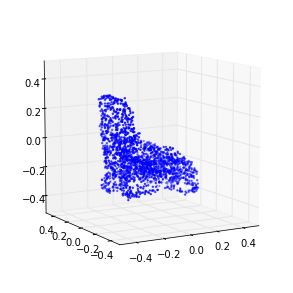

1291 (-0.18591145232871728, 0.28646945346284797)
1292 (-0.18703992035653855, 0.29491031611407242)
1293 (-0.18675376154758311, 0.29534998977625809)
1294 (-0.18743301254731637, 0.2952924845395265)
1295 (-0.18485896443879163, 0.29118249592957673)
1296 (-0.18524113087742416, 0.29428290658526951)
1297 (-0.18582558653972767, 0.29626138342751396)
1298 (-0.18715554508897994, 0.29840209859388844)
1299 (-0.18778584544305449, 0.29076734295597784)
1300 (-0.1859292475161729, 0.29415778429419909)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1300 is not in all_model_checkpoint_paths. Manually adding it.


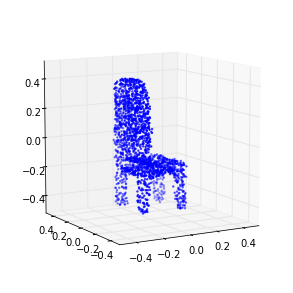

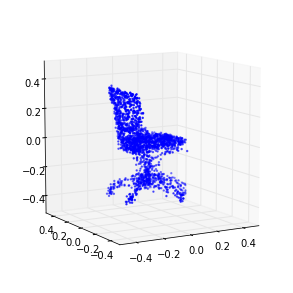

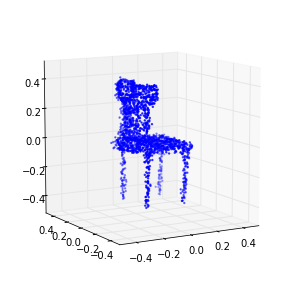

1301 (-0.18565768643661781, 0.29500091407034135)
1302 (-0.1875207093026903, 0.2962721089522044)
1303 (-0.18683445199772164, 0.29504398946408872)
1304 (-0.18725513904183, 0.29862054078667249)
1305 (-0.18633750732298252, 0.28997037366584494)
1306 (-0.18648241857687634, 0.2973412209086948)
1307 (-0.1861488096140049, 0.29412037796444362)
1308 (-0.18448045408284222, 0.29486713254893265)
1309 (-0.18529437360940157, 0.29834329861181752)
1310 (-0.18641344849710112, 0.28309448063373566)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1310 is not in all_model_checkpoint_paths. Manually adding it.


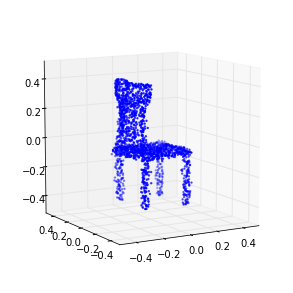

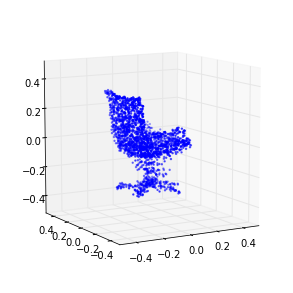

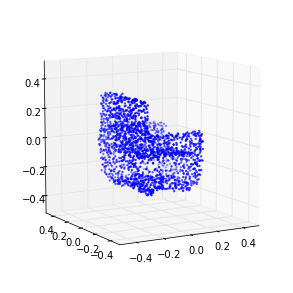

1311 (-0.18686427451946117, 0.29433123491428514)
1312 (-0.1887703662669217, 0.29914952980147469)
1313 (-0.1851091021740878, 0.28542345651873835)
1314 (-0.18738292665393264, 0.29038776954015094)
1315 (-0.18478325252179748, 0.29000059873969469)
1316 (-0.18812020796316642, 0.29970281653934056)
1317 (-0.18520042090504257, 0.29251846560725459)
1318 (-0.18754964205953811, 0.29456260138087803)
1319 (-0.18502338197496201, 0.29802158585301153)
1320 (-0.18809548053476546, 0.29481403364075554)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1320 is not in all_model_checkpoint_paths. Manually adding it.


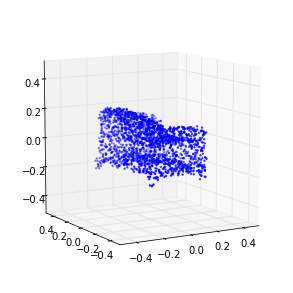

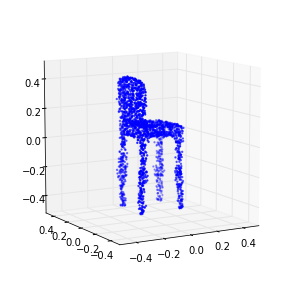

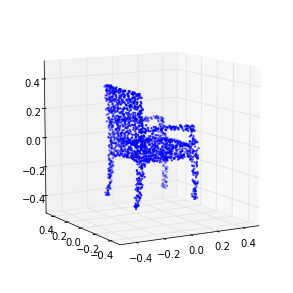

1321 (-0.18502535836564171, 0.2990781333711412)
1322 (-0.18812734694392594, 0.29479825938189469)
1323 (-0.18783632395444094, 0.29964842840477274)
1324 (-0.18711810023696335, 0.29487262942172865)
1325 (-0.1847493158446418, 0.29013874243806909)
1326 (-0.18645618403399433, 0.28476897213194108)
1327 (-0.18661153426876775, 0.29079633399292276)
1328 (-0.18737618879035667, 0.28659869785662051)
1329 (-0.18616308470567067, 0.29723925281454017)
1330 (-0.18632634326263711, 0.30025732406863459)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1330 is not in all_model_checkpoint_paths. Manually adding it.


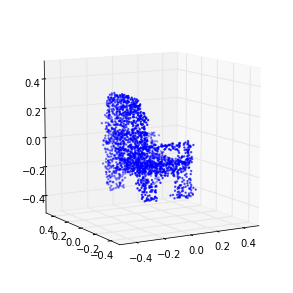

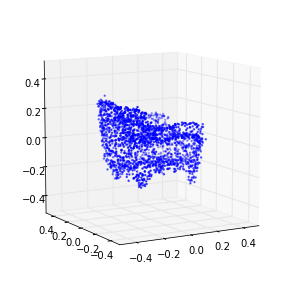

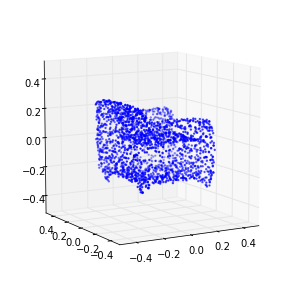

1331 (-0.1862161871459749, 0.29539164900779724)
1332 (-0.18720409814958219, 0.29190217786365086)
1333 (-0.1861465284117946, 0.29515755176544189)
1334 (-0.18565936364509442, 0.2896368779517986)
1335 (-0.18650121953752305, 0.29860609990579112)
1336 (-0.18513332086580772, 0.3004259577503911)
1337 (-0.18550564172091308, 0.28224673756846674)
1338 (-0.18597573086067481, 0.29229426825488053)
1339 (-0.18476601187829619, 0.30097357211289583)
1340 (-0.18763193532272621, 0.28672731916109723)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1340 is not in all_model_checkpoint_paths. Manually adding it.


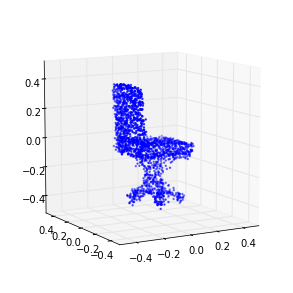

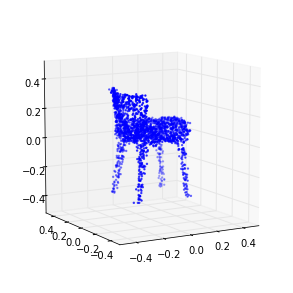

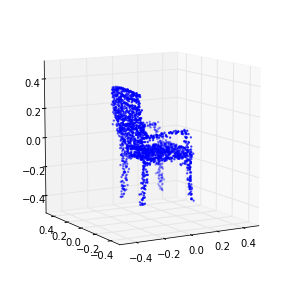

1341 (-0.186660858657625, 0.29853464718218203)
1342 (-0.18531753983762528, 0.29141708215077716)
1343 (-0.18762203830259819, 0.29143788086043465)
1344 (-0.18633066647582583, 0.28384268835738852)
1345 (-0.18722769595958569, 0.29579258075466863)
1346 (-0.1853548303798393, 0.29064069412372728)
1347 (-0.18664275198071092, 0.28680634388217219)
1348 (-0.1859732406006919, 0.29670154717233443)
1349 (-0.18688294181117304, 0.28321745384622504)
1350 (-0.18668331128579599, 0.29818408908667388)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1350 is not in all_model_checkpoint_paths. Manually adding it.


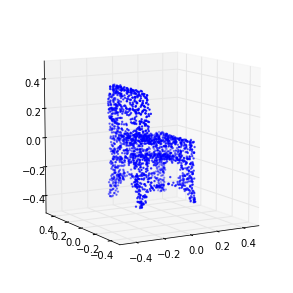

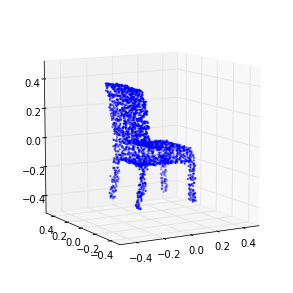

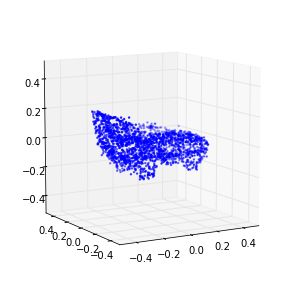

1351 (-0.18590400450759464, 0.30102702423378275)
1352 (-0.1856190609711188, 0.29801223454652009)
1353 (-0.18630128613224736, 0.28643508531429152)
1354 (-0.1861824760834376, 0.28988167533168085)
1355 (-0.1851027971064603, 0.28563392162322998)
1356 (-0.18673541258882592, 0.28822592673478303)
1357 (-0.18648498720592924, 0.30373826071068094)
1358 (-0.18573941853311327, 0.29541250401073033)
1359 (-0.1856611473692788, 0.29051597581969368)
1360 (-0.18722348709901174, 0.29432417507524844)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1360 is not in all_model_checkpoint_paths. Manually adding it.


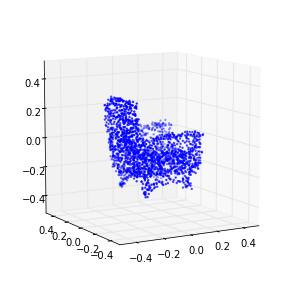

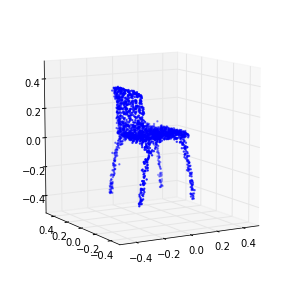

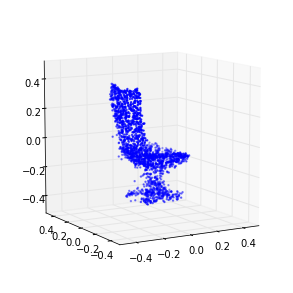

1361 (-0.18567052880922955, 0.28866502201115646)
1362 (-0.18582572837670644, 0.29446012775103253)
1363 (-0.18651087096443883, 0.29809080009107236)
1364 (-0.18614898886945513, 0.29249535225055834)
1365 (-0.18480718235174814, 0.28805793104348359)
1366 (-0.18703247982042806, 0.29471730192502338)
1367 (-0.1836343949591672, 0.29825312451080038)
1368 (-0.18622633549902173, 0.29863850165296485)
1369 (-0.18693639349054408, 0.29475264085663688)
1370 (-0.18602967979731383, 0.29859329263369244)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1370 is not in all_model_checkpoint_paths. Manually adding it.


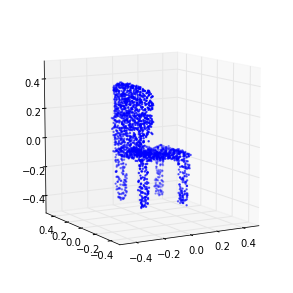

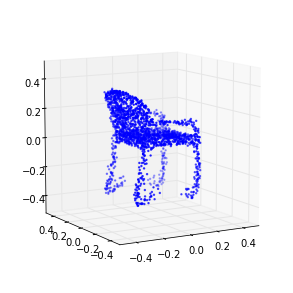

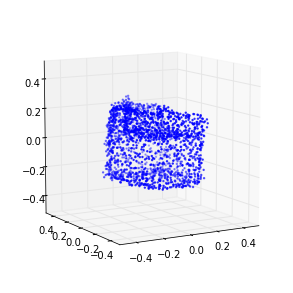

1371 (-0.18658323608062885, 0.29390933778550887)
1372 (-0.18547974780753806, 0.29367137838293006)
1373 (-0.18519097378960361, 0.29701211386256748)
1374 (-0.18623926374647354, 0.29418652808224716)
1375 (-0.18549260684737454, 0.29291262670799539)
1376 (-0.18557151467711838, 0.29292546819757531)
1377 (-0.18550877979508154, 0.29409579767121208)
1378 (-0.18559818433390723, 0.29384558289139356)
1379 (-0.1857911914587021, 0.28463688161638045)
1380 (-0.18620515885176481, 0.29508528886017976)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1380 is not in all_model_checkpoint_paths. Manually adding it.


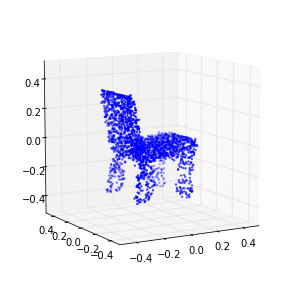

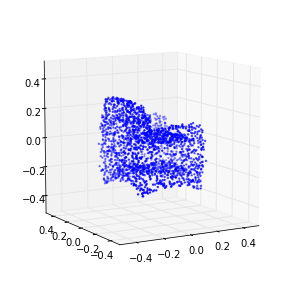

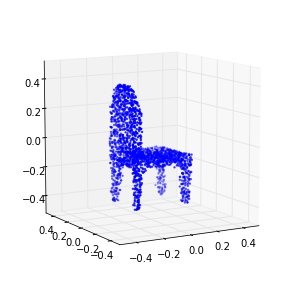

1381 (-0.18892847492739007, 0.2924150394068824)
1382 (-0.18584845849761256, 0.28331137917659899)
1383 (-0.18784413812337097, 0.29220809097643252)
1384 (-0.18593369391229417, 0.29496857413539179)
1385 (-0.18511267072624629, 0.29706217734901991)
1386 (-0.18539926001319179, 0.29157506702122865)
1387 (-0.18690415709107011, 0.28674798651977823)
1388 (-0.1882053675474944, 0.29712074774282948)
1389 (-0.18722301103450634, 0.29928801898603086)
1390 (-0.18582936304586906, 0.29624571734004551)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1390 is not in all_model_checkpoint_paths. Manually adding it.


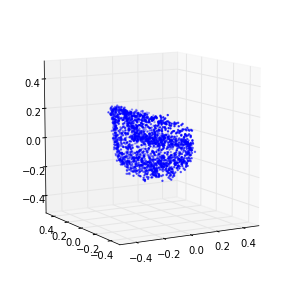

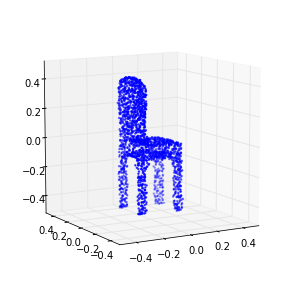

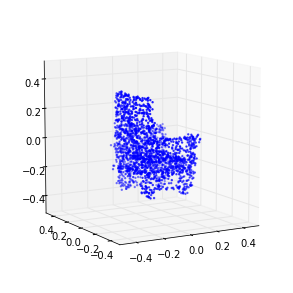

1391 (-0.18931524025069343, 0.29191882853154782)
1392 (-0.18602302979539942, 0.29225755179369889)
1393 (-0.18654269520883207, 0.28792391883002388)
1394 (-0.18711296606946876, 0.29532328579160905)
1395 (-0.18824003438154857, 0.29437320982968368)
1396 (-0.18615276592749136, 0.29439295662773979)
1397 (-0.18667273929825537, 0.29526763161023456)
1398 (-0.18647925070038548, 0.29878758942639388)
1399 (-0.18626951310369705, 0.29799586755258067)
1400 (-0.18671087876514153, 0.29698533923537646)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1400 is not in all_model_checkpoint_paths. Manually adding it.


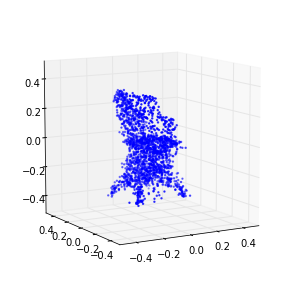

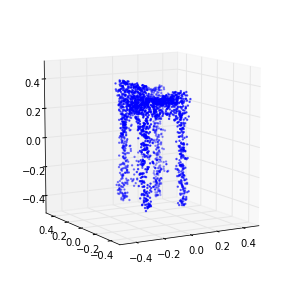

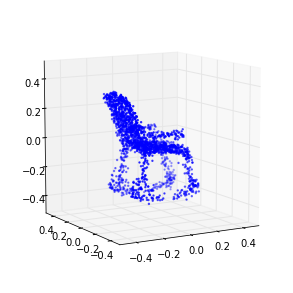

1401 (-0.18590159261668171, 0.29492629457403113)
1402 (-0.18770919486328408, 0.29920064630331816)
1403 (-0.18634558717409769, 0.30148381325933671)
1404 (-0.1869806397292349, 0.29590689142545062)
1405 (-0.18533609012762706, 0.29504177526191427)
1406 (-0.18684919310940637, 0.28936020091727926)
1407 (-0.18701769963458734, 0.29726755287912154)
1408 (-0.18633812599711949, 0.29712818066279095)
1409 (-0.18758457170592413, 0.29345412386788261)
1410 (-0.18648446025671783, 0.29429719514316982)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1410 is not in all_model_checkpoint_paths. Manually adding it.


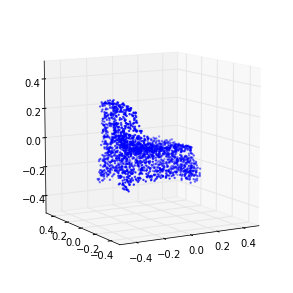

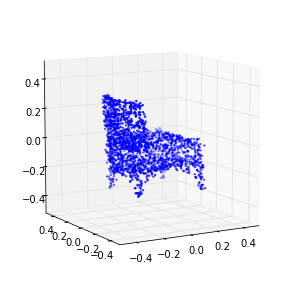

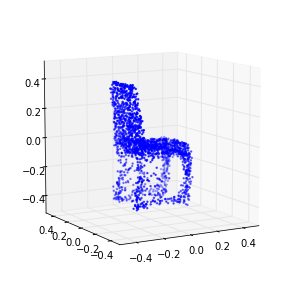

1411 (-0.18668239635449868, 0.29989190565215218)
1412 (-0.18864457276132371, 0.30009400734195002)
1413 (-0.18784475492106545, 0.29728473005471406)
1414 (-0.18668020632531906, 0.29909496174918282)
1415 (-0.18651739557584127, 0.28999205982243575)
1416 (-0.18652282268912704, 0.29297057897956286)
1417 (-0.18755542635917663, 0.30875575321692006)
1418 (-0.18733976152208115, 0.29497215814060634)
1419 (-0.18589468499024708, 0.29899729181219031)
1420 (-0.18767493400308821, 0.29608614908324349)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1420 is not in all_model_checkpoint_paths. Manually adding it.


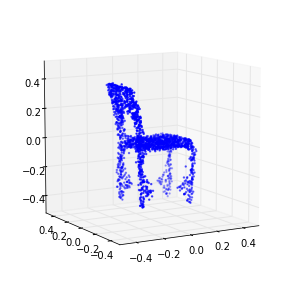

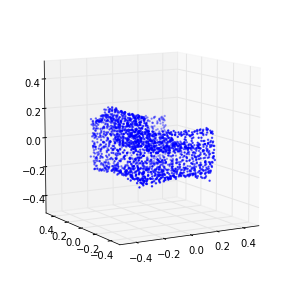

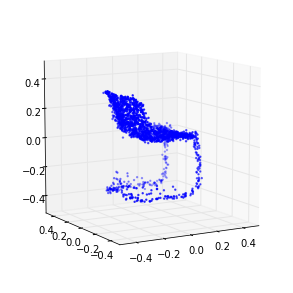

1421 (-0.18576031945369861, 0.29178096298818235)
1422 (-0.18624982039133708, 0.29279469891830728)
1423 (-0.18730231633892766, 0.29115056439682291)
1424 (-0.18651699644547923, 0.29029716937630262)
1425 (-0.18639662950127214, 0.29494230504389163)
1426 (-0.18559497098128, 0.30071823464499581)
1427 (-0.18908555220674586, 0.29504721253006544)
1428 (-0.18658602061095061, 0.29451160408832411)
1429 (-0.18513950926286202, 0.29006644531532572)
1430 (-0.18593889783929896, 0.29415967839735524)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1430 is not in all_model_checkpoint_paths. Manually adding it.


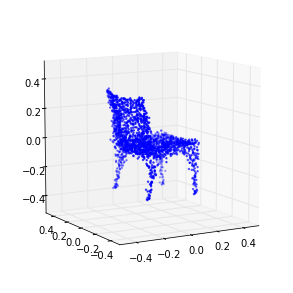

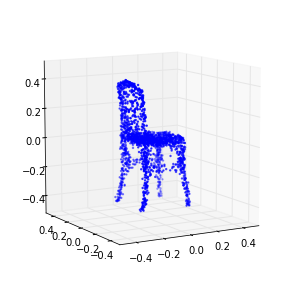

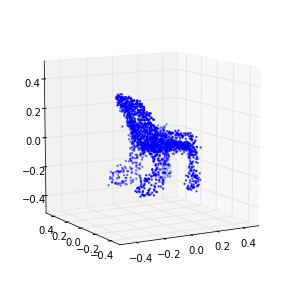

1431 (-0.18722352363445141, 0.2972916177025548)
1432 (-0.18666352905608991, 0.29630493786599899)
1433 (-0.18579200042618646, 0.29683569735950893)
1434 (-0.18641440172990162, 0.29929734932051766)
1435 (-0.18683802783489228, 0.29865117536650765)
1436 (-0.18716732473285111, 0.28955649446558068)
1437 (-0.18607312760971212, 0.29609552246552928)
1438 (-0.18610566755135854, 0.29714903566572404)
1439 (-0.18634069705450976, 0.30117861098713344)
1440 (-0.18641631901264191, 0.30106435109067847)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1440 is not in all_model_checkpoint_paths. Manually adding it.


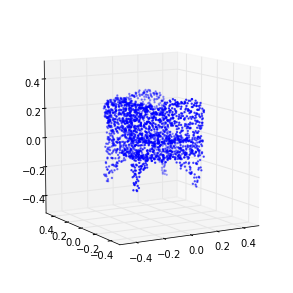

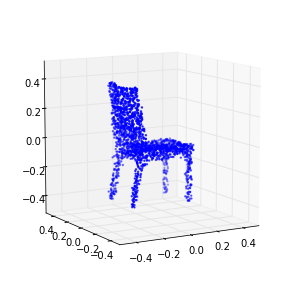

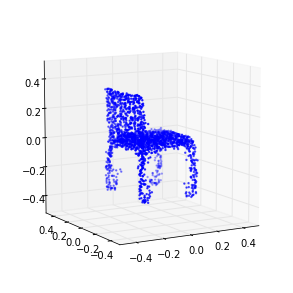

1441 (-0.18399077521430121, 0.28854484249044349)
1442 (-0.18697795989336791, 0.29577805046682004)
1443 (-0.18694798504864729, 0.29756017305232862)
1444 (-0.18549938146714812, 0.29591742709830954)
1445 (-0.18704002919020477, 0.29409049837677564)
1446 (-0.18623883050900919, 0.28951212653407343)
1447 (-0.18599099251959059, 0.29270279407501221)
1448 (-0.18711552454365624, 0.28562593791219926)
1449 (-0.18656649236325865, 0.29586403016690854)
1450 (-0.18545407939840247, 0.29467593961291844)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1450 is not in all_model_checkpoint_paths. Manually adding it.


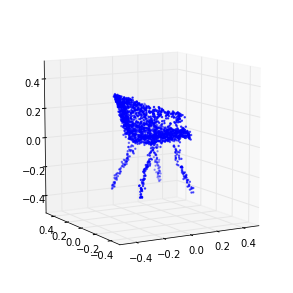

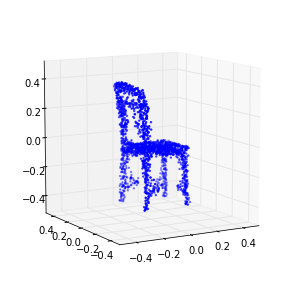

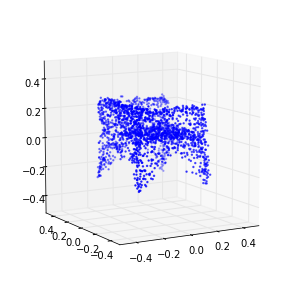

1451 (-0.18697603974077437, 0.29984970004470263)
1452 (-0.18719867975623519, 0.29132996333969963)
1453 (-0.18695474222854333, 0.29208496654475175)
1454 (-0.18675129601248988, 0.28552731264520576)
1455 (-0.18665435700504868, 0.29655906116520919)
1456 (-0.18645931515428754, 0.29570334156354267)
1457 (-0.18470396410535883, 0.30294200998765453)
1458 (-0.18649362325668334, 0.29940906001461876)
1459 (-0.18805144473358437, 0.29707811607254875)
1460 (-0.18706189758247799, 0.29688519129046687)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1460 is not in all_model_checkpoint_paths. Manually adding it.


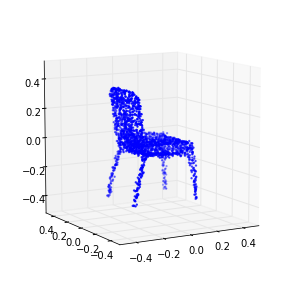

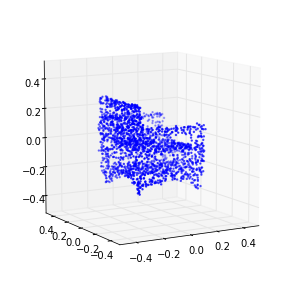

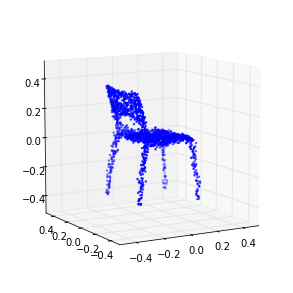

1461 (-0.18558665955508197, 0.29155291451348198)
1462 (-0.18681396731623898, 0.29333076322520218)
1463 (-0.18601418082360868, 0.29349301037964998)
1464 (-0.18784525548970257, 0.28605356978045571)
1465 (-0.18600049283769396, 0.29194985054157396)
1466 (-0.18795743408026519, 0.29477320777045357)
1467 (-0.18462637177220098, 0.2848226847472014)
1468 (-0.18762114401216859, 0.29501638699460914)
1469 (-0.18591796126630572, 0.29468705146401014)
1470 (-0.18588333229223888, 0.29744008514616227)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1470 is not in all_model_checkpoint_paths. Manually adding it.


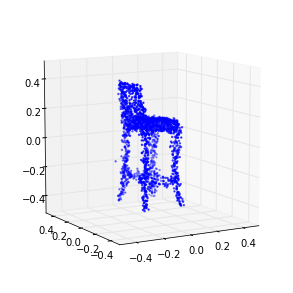

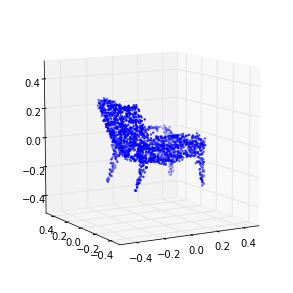

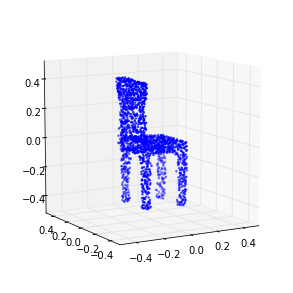

1471 (-0.18644055061870152, 0.29289137544455351)
1472 (-0.18784270032688424, 0.2938181349524745)
1473 (-0.18556981870421657, 0.30137048606519345)
1474 (-0.1870409075860624, 0.29545988749574731)
1475 (-0.18905142959621218, 0.2912597049165655)
1476 (-0.18698326636243751, 0.28951494009406481)
1477 (-0.18653905943587976, 0.28901221023665535)
1478 (-0.18629363234396334, 0.28211587888223155)
1479 (-0.18735499172298997, 0.29881147543589276)
1480 (-0.18678385256617158, 0.29598430792490643)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1480 is not in all_model_checkpoint_paths. Manually adding it.


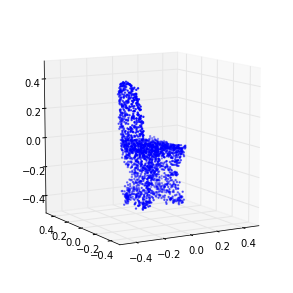

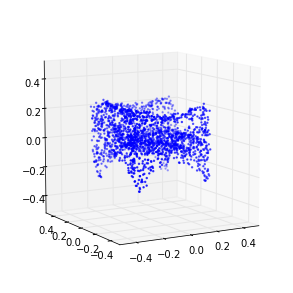

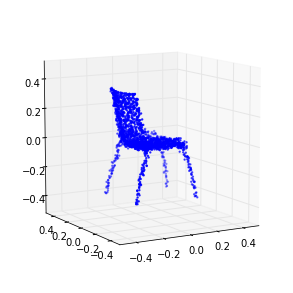

1481 (-0.18742091997906013, 0.29012499363334093)
1482 (-0.18529153664906819, 0.29045623651257269)
1483 (-0.18534743929350816, 0.29203072631800614)
1484 (-0.18587424854437509, 0.29024793262834903)
1485 (-0.18701305477707475, 0.29491720265812343)
1486 (-0.18575356359835024, 0.28543036955374257)
1487 (-0.18836423622237311, 0.29474616050720215)
1488 (-0.18636598029622325, 0.28854906117474594)
1489 (-0.18535096976492141, 0.2927533608895761)
1490 (-0.18571262282353859, 0.28349166280693477)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1490 is not in all_model_checkpoint_paths. Manually adding it.


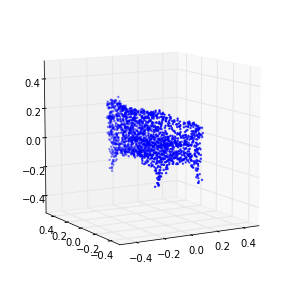

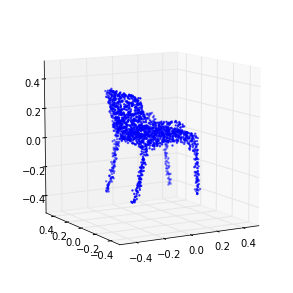

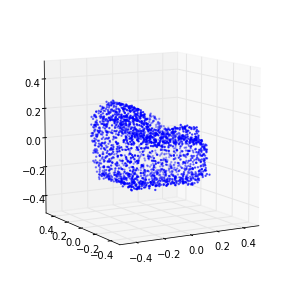

1491 (-0.18605908928094086, 0.28280499798280223)
1492 (-0.18626353630313167, 0.28586574892203015)
1493 (-0.18585972344433821, 0.28744879916862204)
1494 (-0.18631807135211098, 0.29710370522958263)
1495 (-0.18641922418717985, 0.28450682317769088)
1496 (-0.18751012925748473, 0.29560385092541025)
1497 (-0.18635921323740923, 0.29631518324216205)
1498 (-0.18724942428094368, 0.28119688287929251)
1499 (-0.18647462052327615, 0.29403309137732897)
1500 (-0.18788292132042073, 0.28820849679134508)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_13_emd_chair_2048_best_epoch/models.ckpt-1500 is not in all_model_checkpoint_paths. Manually adding it.


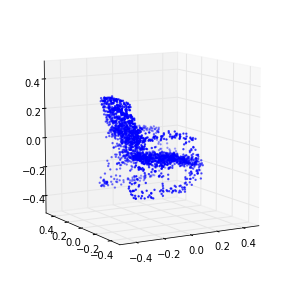

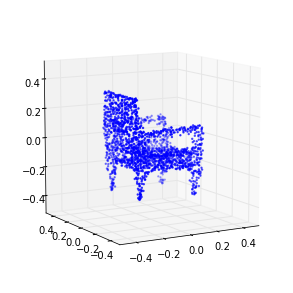

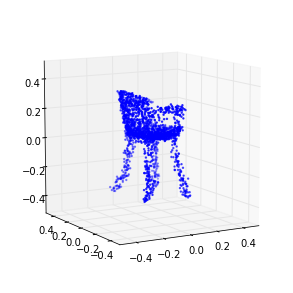

In [10]:
save_dir = osp.join(synthetic_data_out_dir, experiment_name)
save_dir = create_dir(save_dir)

buf_size = 1 # flush each line
if do_training:    
    train_stats = []
    log_file = open(osp.join(train_dir, 'train_stats.txt'), 'a', buf_size)
    for _ in range(max_epochs):        
        loss, duration = gan._single_epoch_train(training_data, batch_size, noise_params)
        epoch = int(gan.sess.run(gan.epoch.assign_add(tf.constant(1.0))))
        print epoch, loss                
        log_file.write('%04d\t%.9f\t%.9f\t%.4f\n' % (epoch, loss[0], loss[1], duration / 60.0))        

        if save_model and (epoch % saver_step == 0 or epoch <= 5):
            checkpoint_path = osp.join(train_dir, model_saver_id)
            gan.saver.save(gan.sess, checkpoint_path, global_step=gan.epoch)
            syn_latent_data = gan.generate(n_syn_samples, noise_params)
            syn_data = ae.decode(syn_latent_data)
            np.savez(osp.join(save_dir, 'epoch_' + str(epoch)), syn_data)
            for k in range(3):
                Point_Cloud(syn_data[k]).plot(in_u_sphere=True)
                        
        train_stats.append((epoch,) + loss)
    log_file.close()

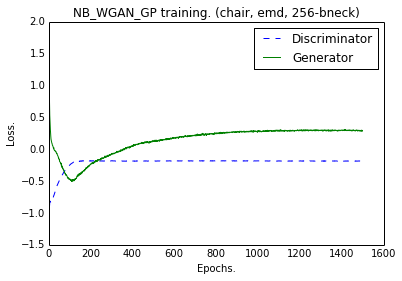

In [11]:
if do_plotting:
    x = range(len(train_stats))
    d_loss = [t[1] for t in train_stats]
    g_loss = [t[2] for t in train_stats]
    plt.plot(x, d_loss, '--')
    plt.plot(x, g_loss)
    plt.title('NB_WGAN_GP training. (%s, %s, %s-bneck)' %(class_name, ae_loss, ae.bottleneck_size))
    plt.legend(['Discriminator', 'Generator'], loc=0)
    
    plt.tick_params(axis='x', which='both', bottom='off', top='off')
    plt.tick_params(axis='y', which='both', left='off', right='off')
    
    plt.xlabel('Epochs.') 
    plt.ylabel('Loss.')
    
    plt.savefig(osp.join(train_dir, 'training_curve.png'))